# Data Exploration: Ambient Water Quality Management System 

Started: 12.04.09
Greg Lee

Acquired data from the https://awqms.utah.gov portal. Downloaded TWO types of data. Listed below are the parameters used for data collection: 

- Organizations & Locations Search Criteria
    - Organizations:
        - USGS-UT: USGS Water Quality Portal
        - UTAHDWQ_WQX: Utah Department of Environmental Quality
        - WFWQC: Wasatch Front Water Quality Council
    - Monitoring Location Types: 
        - All items checked
- Other Search Criteria
    - Parameter Types: 
        - Regular Results
    - Time Period: 
        - Dates (FINAL) = 12.01.1950 (earliest entry) - 09.23.2009 (latest entry)
        - Dates (ACCEPTED) = 09.29.2008 (earliest entry) - 12.01.2019 (latest entry)
    - Activity Types:
        - All items checked
        - Results Status: FINAL or ACCEPTED (see above)      
- Parameters
    - Select all (w/n) individual parameters
- Options: none 

Data is stored in a folder called AWSMS where there is a final and approved data based upon the criteria above. The sets have different headers!

The aim of this notebook is to open, clean and merge the data. Furthmore explore the distributions of labels and chemicals. 

## Import the .xlsx Data 

In [1]:
#Libraries: 
import pandas as pd
import numpy as np
import matplotlib as plt

In [3]:
# Importing FINAL Data
path = 'C:\\Users\\u0890227\\Desktop\\\AWSMS\\'

In [ ]:
alumin = pd.read_excel (path + '1950_2007_aluminum.xlsx',header=1)

In [ ]:
cymene = pd.read_excel (path + '1950_2007_Cymene.xlsx',header=1)

In [ ]:
maganese = pd.read_excel (path + '1950_2007_maganese.xlsx',header=1)

In [ ]:
phosphate_phosphorus = pd.read_excel (path + '1950_2007_phosphate_phosphorus.xlsx',header=1)

In [ ]:
spec_cond = pd.read_excel (path + '1950_2007_Specific_Conductance.xlsx',header=1)

In [ ]:
TSS = pd.read_excel (path + '1950_2007_Total_Susp_Solid_only.xlsx',header=1)

In [ ]:
Water_Temp = pd.read_excel (path + '1950_2007_Water_Temp_only.xlsx',header=1)

In [ ]:
Zirc = pd.read_excel (path + '1950_2007_Zirconium.xlsx',header=1)

In [ ]:
final_0709 = pd.read_excel (path + '120307_092309_ALL.xlsx',header=1)

## Are the data shapes consistent? 

In [ ]:
#Definetly faster to load the data in as .txt files

In [ ]:
a = pd.read_csv(path + 'test.txt',sep="\t",header = 0,low_memory=False)

In [ ]:
test = pd.read_csv(path + '1950_2007_Cymene.txt',sep="\t",header = 0,low_memory=False)

In [ ]:
comb= pd.concat([a,test])

In [ ]:
comb.shape

In [ ]:
comb.head()

In [ ]:
sorted_comb = comb.sort_values(by=['Activity Start Date'])

In [ ]:
one_entry = sorted_comb.iloc[[1]]
one_entry = one_entry.dropna(axis='columns')

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
one_entry.head()

In [ ]:
#Seems fairly easy to load and merge this data together. All values should have a lat long result and some type of ID
# Per attribute Want total number of years collected, recordings per year, 

## Approved Data: 

In [4]:
#Importing APPROVED Data
path_approved = path + 'Approved_Data\\'
approved_08_10 =  pd.read_excel (path_approved + '092908_120110.xlsx',header=1)
approved_10_13 =  pd.read_excel (path_approved + '120110_120113.xlsx',header=1)
approved_13_15 =  pd.read_excel (path_approved + '120113_120115.xlsx',header=1)
approved_15_19 =  pd.read_excel (path_approved + '120115__120119.xlsx',header=1)

In [5]:
approved_data = pd.concat([approved_08_10,approved_10_13,approved_13_15,approved_15_19])
approved_data.rename(columns=lambda x: x.replace(" ", "_"), inplace=True)
#Count the number of Nan's per column
approved_nans = approved_data.isna().sum()

In [6]:
#Shape of the data: 
approved_data.shape
print("The Shape of the Approved Data is " + str(approved_data.shape[0])+ " samples and " + 
      str(approved_data.shape[1]) + " features")

The Shape of the Approved Data is 1239707 samples and 58 features


In [7]:
#Sparsity of the Data:
approved_nans.sort_values()
#Not all values have result values. Partially due to the detection condition: 

Organization_ID                            0
Activity_Media                             0
Result_Unit                                0
Result_Status                              0
Analytical_Method_ID                       0
Analytical_Method_Context                  0
Analytical_Method_Name                     0
Characteristic_Name                        0
Sample_Collection_Method_Name              0
Sample_Collection_Method_ID                0
Project_ID1                                0
Activity_Start_Date                        0
Activity_Type                              0
Monitoring_Location_Type                   0
Monitoring_Location_Longitude              0
Monitoring_Location_Latitude               0
Monitoring_Location_Name                   0
Monitoring_Location_ID                     0
Activity_ID                                0
Sample_Collection_Method_Context           0
Result_Value_Type                          2
Monitoring_Location_State              39012
Activity_S

In [8]:
#How many different types of Characteristics were observed? 
app_characteristics = approved_data[['Characteristic_Name','Activity_Start_Date','Detection_Condition','Result_Value'
                                    , 'Result_Unit','Monitoring_Location_Longitude','Monitoring_Location_Latitude' ]]
uniq_feat = app_characteristics.Characteristic_Name.unique()
print("There are a total of : " + str(len(uniq_feat)) + " characteristics (mostly chemicals)")

There are a total of : 200 characteristics (mostly chemicals)


In [9]:
#Sort: Characteristic
app_sorted_charact = app_characteristics.sort_values(by=['Characteristic_Name','Activity_Start_Date'])

In [10]:
app_sorted_charact.head()

,Characteristic_Name,Activity_Start_Date,Detection_Condition,Result_Value,Result_Unit,Monitoring_Location_Longitude,Monitoring_Location_Latitude
328962,"1,1,1,2-Tetrachloroethane",2012-05-24,Not Detected,NaN,ug/l,-111.506192,40.029336
298132,"1,1,1,2-Tetrachloroethane",2013-01-15,Not Detected,NaN,ug/l,-112.034392,41.057441
356147,"1,1,1,2-Tetrachloroethane",2013-01-15,Not Detected,NaN,ug/l,-111.991420,41.044140
305271,"1,1,1,2-Tetrachloroethane",2013-02-26,Not Detected,NaN,ug/l,-111.991420,41.044140
384921,"1,1,1,2-Tetrachloroethane",2013-02-26,Not Detected,NaN,ug/l,-112.034392,41.057441


In [11]:
#How many observations exist per characteristic
app_counts = app_sorted_charact[['Characteristic_Name']].apply(pd.value_counts)
print("The features with the most data are: \nSpecific conductance, Water Temperature, pH, Dissolved Oxygen, Dissolved Oxygen Saturation")

The features with the most data are: 
Specific conductance, Water Temperature, pH, Dissolved Oxygen, Dissolved Oxygen Saturation


In [20]:
#What are time span of the data?
app_year_sort = app_characteristics.sort_values(by=['Activity_Start_Date'])
print("This data ranges from 2008.09.29 - 2019.01.15")

This data ranges from 2008.09.29- 2019.01.15


In [12]:
#What's next: 
#Per each characteristic: need to count the number of measurements per year --> go in from there
app_counts = app_sorted_charact[['Result_Value']].apply(pd.isnull)

In [30]:
#
characteristics = app_sorted_charact['Characteristic_Name'].drop_duplicates().values.reshape(200,1) 
for

    print(row['Activity_Start_Date'])

for ele in charact:
    for index, row in app_sorted_charact.iterrows(): 
        if ele == row['Characteristic_Name']:
           Activity_Start_Date 
#      if ele  == "BULL" else "Short" 
# index = pd.date_range('1/1/2000', periods=9, freq='T')
# series = pd.Series(range(9), index=index)

2012-05-24 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-10-16 00:00:00
2013-10-16 00:00:00
2013-10-22 00:00:00
2013-10-22 00:00:00
2013-12-10 00:00:00
2013-12-10 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-03-27 00:00:00
2014-03-27 00:00:00
2014-10-31 00:00:00
2014-10-31 00:00:00
2014-10-31 00:00:00
2012-05-24 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-08-13 00:00:00


2009-01-20 00:00:00
2009-01-20 00:00:00
2009-01-20 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00


2009-04-10 00:00:00
2009-04-10 00:00:00
2009-04-11 00:00:00
2009-04-11 00:00:00
2009-04-11 00:00:00
2009-04-11 00:00:00
2009-04-11 00:00:00
2009-04-11 00:00:00
2009-04-11 00:00:00
2009-04-11 00:00:00
2009-04-13 00:00:00
2009-04-13 00:00:00
2009-04-13 00:00:00
2009-04-13 00:00:00
2009-04-13 00:00:00
2009-04-13 00:00:00
2009-04-13 00:00:00
2009-04-13 00:00:00
2009-04-13 00:00:00
2009-04-13 00:00:00
2009-04-13 00:00:00
2009-04-13 00:00:00
2009-04-13 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00
2009-04-14 00:00:00


2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-29 00:00:00
2009-05-29 00:00:00
2009-05-29 00:00:00
2009-05-30 00:00:00
2009-05-31 00:00:00
2009-06-02 00:00:00


2009-08-17 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-19 00:00:00
2009-08-20 00:00:00
2009-08-20 00:00:00
2009-08-24 00:00:00
2009-08-24 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00


2009-11-11 00:00:00
2009-11-11 00:00:00
2009-11-11 00:00:00
2009-11-11 00:00:00
2009-11-11 00:00:00
2009-11-11 00:00:00
2009-11-11 00:00:00
2009-11-12 00:00:00
2009-11-12 00:00:00
2009-11-12 00:00:00
2009-11-12 00:00:00
2009-11-12 00:00:00
2009-11-12 00:00:00
2009-11-12 00:00:00
2009-11-12 00:00:00
2009-11-12 00:00:00
2009-11-12 00:00:00
2009-11-13 00:00:00
2009-11-13 00:00:00
2009-11-13 00:00:00
2009-11-13 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-16 00:00:00
2009-11-17 00:00:00


2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00


2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00


2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00


2010-10-09 00:00:00
2010-10-09 00:00:00
2010-10-11 00:00:00
2010-10-11 00:00:00
2010-10-11 00:00:00
2010-10-11 00:00:00
2010-10-11 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00


2011-01-26 00:00:00
2011-01-26 00:00:00
2011-01-26 00:00:00
2011-01-26 00:00:00
2011-01-26 00:00:00
2011-01-26 00:00:00
2011-01-27 00:00:00
2011-01-27 00:00:00
2011-01-27 00:00:00
2011-01-27 00:00:00
2011-01-27 00:00:00
2011-01-27 00:00:00
2011-01-27 00:00:00
2011-01-27 00:00:00
2011-01-28 00:00:00
2011-01-28 00:00:00
2011-01-28 00:00:00
2011-01-28 00:00:00
2011-01-28 00:00:00
2011-01-29 00:00:00
2011-01-29 00:00:00
2011-01-29 00:00:00
2011-01-29 00:00:00
2011-01-29 00:00:00
2011-01-31 00:00:00
2011-02-01 00:00:00
2011-02-01 00:00:00
2011-02-01 00:00:00
2011-02-07 00:00:00
2011-02-07 00:00:00
2011-02-07 00:00:00
2011-02-07 00:00:00
2011-02-07 00:00:00
2011-02-07 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-09 00:00:00
2011-02-09 00:00:00
2011-02-09 00:00:00
2011-02-09 00:00:00
2011-02-09 00:00:00
2011-02-09 00:00:00
2011-02-09 00:00:00
2011-02-09 00:00:00
2011-02-09 00:00:00


2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-20 00:00:00
2011-05-20 00:00:00
2011-05-21 00:00:00
2011-05-21 00:00:00
2011-05-21 00:00:00
2011-05-21 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-24 00:00:00
2011-05-24 00:00:00
2011-05-24 00:00:00
2011-05-24 00:00:00
2011-05-24 00:00:00
2011-05-24 00:00:00
2011-05-24 00:00:00
2011-05-24 00:00:00
2011-05-24 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00


2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-28 00:00:00
2011-07-28 00:00:00
2011-07-28 00:00:00
2011-07-28 00:00:00
2011-07-28 00:00:00
2011-07-28 00:00:00
2011-07-28 00:00:00
2011-07-28 00:00:00
2011-07-28 00:00:00
2011-07-28 00:00:00
2011-07-28 00:00:00
2011-07-28 00:00:00
2011-07-28 00:00:00
2011-07-28 00:00:00
2011-07-28 00:00:00
2011-07-29 00:00:00
2011-07-29 00:00:00
2011-07-29 00:00:00
2011-07-29 00:00:00
2011-07-29 00:00:00
2011-07-29 00:00:00
2011-07-29 00:00:00
2011-07-29 00:00:00
2011-07-29 00:00:00
2011-07-29 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00


2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00


2011-12-13 00:00:00
2011-12-13 00:00:00
2011-12-14 00:00:00
2011-12-14 00:00:00
2011-12-14 00:00:00
2011-12-15 00:00:00
2011-12-15 00:00:00
2011-12-15 00:00:00
2011-12-15 00:00:00
2011-12-15 00:00:00
2011-12-15 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-17 00:00:00
2011-12-19 00:00:00
2011-12-19 00:00:00
2011-12-19 00:00:00
2011-12-20 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-21 00:00:00
2011-12-22 00:00:00
2011-12-22 00:00:00
2011-12-28 00:00:00


2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00


2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-22 00:00:00
2012-06-22 00:00:00
2012-06-22 00:00:00
2012-06-22 00:00:00
2012-06-22 00:00:00
2012-06-22 00:00:00
2012-06-22 00:00:00
2012-06-22 00:00:00
2012-06-23 00:00:00
2012-06-23 00:00:00
2012-06-23 00:00:00
2012-06-25 00:00:00
2012-06-25 00:00:00
2012-06-25 00:00:00
2012-06-25 00:00:00
2012-06-25 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00


2012-08-25 00:00:00
2012-08-25 00:00:00
2012-08-25 00:00:00
2012-08-25 00:00:00
2012-08-25 00:00:00
2012-08-25 00:00:00
2012-08-25 00:00:00
2012-08-25 00:00:00
2012-08-25 00:00:00
2012-08-26 00:00:00
2012-08-27 00:00:00
2012-08-27 00:00:00
2012-08-27 00:00:00
2012-08-27 00:00:00
2012-08-27 00:00:00
2012-08-27 00:00:00
2012-08-27 00:00:00
2012-08-27 00:00:00
2012-08-27 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00


2012-11-01 00:00:00
2012-11-02 00:00:00
2012-11-02 00:00:00
2012-11-02 00:00:00
2012-11-02 00:00:00
2012-11-02 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00


2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-17 00:00:00
2013-04-18 00:00:00
2013-04-19 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-20 00:00:00
2013-04-22 00:00:00
2013-04-22 00:00:00
2013-04-22 00:00:00
2013-04-22 00:00:00
2013-04-22 00:00:00
2013-04-22 00:00:00
2013-04-22 00:00:00
2013-04-23 00:00:00
2013-04-23 00:00:00
2013-04-23 00:00:00
2013-04-23 00:00:00
2013-04-23 00:00:00
2013-04-23 00:00:00
2013-04-23 00:00:00
2013-04-23 00:00:00


2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00


2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00


2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-30 00:00:00
2014-04-30 00:00:00
2014-04-30 00:00:00
2014-04-30 00:00:00
2014-04-30 00:00:00
2014-04-30 00:00:00
2014-04-30 00:00:00
2014-04-30 00:00:00
2014-04-30 00:00:00
2014-04-30 00:00:00
2014-04-30 00:00:00
2014-04-30 00:00:00
2014-05-01 00:00:00


2014-08-21 00:00:00
2014-08-21 00:00:00
2014-08-21 00:00:00
2014-08-21 00:00:00
2014-08-21 00:00:00
2014-08-21 00:00:00
2014-08-21 00:00:00
2014-08-21 00:00:00
2014-08-21 00:00:00
2014-08-21 00:00:00
2014-08-21 00:00:00
2014-08-21 00:00:00
2014-08-21 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-23 00:00:00
2014-08-23 00:00:00
2014-08-23 00:00:00
2014-08-23 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00


2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-04-01 00:00:00
2015-04-01 00:00:00
2015-04-01 00:00:00
2015-04-02 00:00:00
2015-04-02 00:00:00
2015-04-03 00:00:00
2015-04-03 00:00:00
2015-04-04 00:00:00
2015-04-04 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00


2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-13 00:00:00
2015-08-13 00:00:00
2015-08-13 00:00:00
2015-08-13 00:00:00
2015-08-15 00:00:00
2015-08-17 00:00:00
2015-08-17 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-19 00:00:00
2015-08-19 00:00:00
2015-08-19 00:00:00
2015-08-19 00:00:00
2015-08-19 00:00:00
2015-08-19 00:00:00
2015-08-19 00:00:00
2015-08-19 00:00:00
2015-08-24 00:00:00
2015-08-24 00:00:00
2015-08-24 00:00:00


2016-03-31 00:00:00
2016-03-31 00:00:00
2016-03-31 00:00:00
2016-03-31 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-05 00:00:00
2016-04-06 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-14 00:00:00


2016-08-09 00:00:00
2016-08-09 00:00:00
2016-08-09 00:00:00
2016-08-09 00:00:00
2016-08-09 00:00:00
2016-08-09 00:00:00
2016-08-09 00:00:00
2016-08-09 00:00:00
2016-08-09 00:00:00
2016-08-10 00:00:00
2016-08-10 00:00:00
2016-08-13 00:00:00
2016-08-14 00:00:00
2016-08-14 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00


2017-05-15 00:00:00
2017-05-15 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00


2017-09-07 00:00:00
2017-09-09 00:00:00
2017-09-09 00:00:00
2017-09-10 00:00:00
2017-09-10 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00


2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-09 00:00:00
2017-12-10 00:00:00
2017-12-11 00:00:00
2017-12-11 00:00:00
2017-12-12 00:00:00
2017-12-13 00:00:00
2017-12-13 00:00:00
2017-12-14 00:00:00
2017-12-14 00:00:00
2017-12-14 00:00:00
2017-12-14 00:00:00
2017-12-18 00:00:00
2017-12-18 00:00:00
2017-12-18 00:00:00
2017-12-18 00:00:00
2017-12-18 00:00:00
2017-12-18 00:00:00
2017-12-18 00:00:00


2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-28 00:00:00
2018-07-28 00:00:00
2018-07-28 00:00:00
2018-07-28 00:00:00
2018-07-30 00:00:00
2018-07-30 00:00:00
2018-07-30 00:00:00
2018-07-30 00:00:00
2018-07-30 00:00:00
2018-07-30 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-08-01 00:00:00
2018-08-01 00:00:00
2018-08-02 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00


2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00


2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-02 00:00:00
2009-12-02 00:00:00
2009-12-02 00:00:00
2009-12-02 00:00:00
2009-12-02 00:00:00
2009-12-04 00:00:00
2009-12-04 00:00:00
2009-12-04 00:00:00
2009-12-11 00:00:00
2009-12-11 00:00:00
2009-12-11 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00


2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-17 00:00:00
2010-06-17 00:00:00
2010-06-17 00:00:00
2010-06-17 00:00:00
2010-06-17 00:00:00
2010-06-17 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00


2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-11 00:00:00
2010-10-11 00:00:00
2010-10-11 00:00:00
2010-10-11 00:00:00
2010-10-11 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00


2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-10 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00


2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00


2011-10-12 00:00:00
2011-10-13 00:00:00
2011-10-13 00:00:00
2011-10-14 00:00:00
2011-10-14 00:00:00
2011-10-14 00:00:00
2011-10-14 00:00:00
2011-10-17 00:00:00
2011-10-17 00:00:00
2011-10-17 00:00:00
2011-10-17 00:00:00
2011-10-17 00:00:00
2011-10-17 00:00:00
2011-10-17 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-19 00:00:00
2011-10-19 00:00:00
2011-10-19 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-21 00:00:00
2011-10-21 00:00:00
2011-10-21 00:00:00
2011-10-22 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00


2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00


2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-11 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-13 00:00:00
2012-07-14 00:00:00
2012-07-15 00:00:00
2012-07-15 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-17 00:00:00


2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-24 00:00:00
2012-10-24 00:00:00
2012-10-24 00:00:00
2012-10-24 00:00:00
2012-10-26 00:00:00
2012-10-29 00:00:00
2012-10-29 00:00:00
2012-10-30 00:00:00
2012-10-30 00:00:00
2012-10-30 00:00:00
2012-10-30 00:00:00
2012-10-31 00:00:00
2012-10-31 00:00:00
2012-11-01 00:00:00
2012-11-01 00:00:00
2012-11-01 00:00:00
2012-11-02 00:00:00
2012-11-02 00:00:00
2012-11-02 00:00:00
2012-11-02 00:00:00
2012-11-02 00:00:00
2012-11-02 00:00:00
2012-11-02 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00


2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00


2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-31 00:00:00
2013-08-31 00:00:00
2013-08-31 00:00:00
2013-08-31 00:00:00
2013-08-31 00:00:00
2013-09-03 00:00:00
2013-09-03 00:00:00
2013-09-03 00:00:00
2013-09-04 00:00:00
2013-09-04 00:00:00
2013-09-04 00:00:00
2013-09-04 00:00:00
2013-09-05 00:00:00
2013-09-05 00:00:00
2013-09-06 00:00:00
2013-09-06 00:00:00
2013-09-07 00:00:00
2013-09-08 00:00:00
2013-09-08 00:00:00
2013-09-08 00:00:00
2013-09-08 00:00:00
2013-09-09 00:00:00
2013-09-10 00:00:00
2013-09-11 00:00:00
2013-09-13 00:00:00
2013-09-14 00:00:00
2013-09-14 00:00:00
2013-09-15 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00


2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-12 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00
2014-02-19 00:00:00


2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00


2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00


2015-07-09 00:00:00
2015-07-09 00:00:00
2015-07-10 00:00:00
2015-07-10 00:00:00
2015-07-10 00:00:00
2015-07-11 00:00:00
2015-07-12 00:00:00
2015-07-13 00:00:00
2015-07-13 00:00:00
2015-07-13 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00


2015-12-17 00:00:00
2015-12-17 00:00:00
2015-12-17 00:00:00
2015-12-17 00:00:00
2015-12-17 00:00:00
2015-12-17 00:00:00
2015-12-17 00:00:00
2015-12-17 00:00:00
2015-12-17 00:00:00
2015-12-17 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00


2016-05-21 00:00:00
2016-05-21 00:00:00
2016-05-21 00:00:00
2016-05-21 00:00:00
2016-05-21 00:00:00
2016-05-23 00:00:00
2016-05-23 00:00:00
2016-05-23 00:00:00
2016-05-23 00:00:00
2016-05-23 00:00:00
2016-05-23 00:00:00
2016-05-23 00:00:00
2016-05-23 00:00:00
2016-05-23 00:00:00
2016-05-23 00:00:00
2016-05-23 00:00:00
2016-05-23 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00


2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-26 00:00:00
2016-08-26 00:00:00
2016-08-26 00:00:00
2016-08-26 00:00:00
2016-08-29 00:00:00
2016-08-29 00:00:00
2016-08-29 00:00:00
2016-08-30 00:00:00
2016-08-31 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00


2017-03-07 00:00:00
2017-03-07 00:00:00
2017-03-07 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-14 00:00:00
2017-03-14 00:00:00
2017-03-17 00:00:00
2017-03-17 00:00:00
2017-03-17 00:00:00
2017-03-17 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00


2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00


2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-11 00:00:00
2017-10-11 00:00:00
2017-10-11 00:00:00
2017-10-11 00:00:00
2017-10-11 00:00:00
2017-10-11 00:00:00
2017-10-11 00:00:00
2017-10-12 00:00:00
2017-10-13 00:00:00
2017-10-13 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00


2018-01-04 00:00:00
2018-01-04 00:00:00
2018-01-04 00:00:00
2018-01-04 00:00:00
2018-01-04 00:00:00
2018-01-08 00:00:00
2018-01-08 00:00:00
2018-01-08 00:00:00
2018-01-08 00:00:00
2018-01-09 00:00:00
2018-01-09 00:00:00
2018-01-09 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-22 00:00:00
2018-01-26 00:00:00
2018-01-26 00:00:00
2018-01-26 00:00:00
2018-01-26 00:00:00
2018-01-26 00:00:00
2018-01-27 00:00:00
2018-01-27 00:00:00
2018-01-28 00:00:00
2018-01-28 00:00:00
2018-01-28 00:00:00
2018-01-28 00:00:00
2018-01-29 00:00:00
2018-01-29 00:00:00
2018-01-29 00:00:00
2018-01-29 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00


2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00


2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-23 00:00:00
2009-01-23 00:00:00
2009-01-23 00:00:00
2009-01-23 00:00:00
2009-01-23 00:00:00
2009-01-23 00:00:00


2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00


2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00


2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-28 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-29 00:00:00
2009-07-30 00:00:00
2009-07-30 00:00:00
2009-07-30 00:00:00
2009-07-30 00:00:00
2009-07-30 00:00:00
2009-07-30 00:00:00
2009-07-30 00:00:00
2009-07-31 00:00:00
2009-07-31 00:00:00
2009-07-31 00:00:00
2009-07-31 00:00:00
2009-07-31 00:00:00
2009-07-31 00:00:00
2009-07-31 00:00:00
2009-08-03 00:00:00
2009-08-03 00:00:00
2009-08-03 00:00:00
2009-08-03 00:00:00


2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-22 00:00:00
2009-10-22 00:00:00
2009-10-22 00:00:00
2009-10-22 00:00:00
2009-10-22 00:00:00
2009-10-22 00:00:00
2009-10-22 00:00:00
2009-10-22 00:00:00
2009-10-22 00:00:00
2009-10-22 00:00:00
2009-10-23 00:00:00
2009-10-23 00:00:00
2009-10-23 00:00:00
2009-10-23 00:00:00
2009-10-23 00:00:00
2009-10-23 00:00:00
2009-10-25 00:00:00
2009-10-25 00:00:00
2009-10-25 00:00:00
2009-10-25 00:00:00
2009-10-25 00:00:00
2009-10-25 00:00:00
2009-10-25 00:00:00
2009-10-25 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00


2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-28 00:00:00
2010-01-29 00:00:00
2010-01-29 00:00:00
2010-01-29 00:00:00
2010-01-30 00:00:00
2010-01-30 00:00:00
2010-01-30 00:00:00
2010-01-30 00:00:00
2010-01-30 00:00:00
2010-01-30 00:00:00
2010-01-30 00:00:00
2010-02-02 00:00:00
2010-02-02 00:00:00
2010-02-02 00:00:00
2010-02-02 00:00:00
2010-02-02 00:00:00
2010-02-03 00:00:00
2010-02-03 00:00:00
2010-02-03 00:00:00
2010-02-03 00:00:00
2010-02-03 00:00:00
2010-02-03 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00


2010-05-11 00:00:00
2010-05-11 00:00:00
2010-05-11 00:00:00
2010-05-11 00:00:00
2010-05-11 00:00:00
2010-05-11 00:00:00
2010-05-11 00:00:00
2010-05-11 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00


2010-07-01 00:00:00
2010-07-01 00:00:00
2010-07-01 00:00:00
2010-07-01 00:00:00
2010-07-01 00:00:00
2010-07-01 00:00:00
2010-07-01 00:00:00
2010-07-01 00:00:00
2010-07-01 00:00:00
2010-07-02 00:00:00
2010-07-03 00:00:00
2010-07-05 00:00:00
2010-07-05 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-06 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00


2010-09-11 00:00:00
2010-09-11 00:00:00
2010-09-11 00:00:00
2010-09-11 00:00:00
2010-09-11 00:00:00
2010-09-11 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00


2010-11-30 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-12-02 00:00:00
2010-12-02 00:00:00
2010-12-02 00:00:00
2010-12-02 00:00:00
2010-12-02 00:00:00
2010-12-03 00:00:00
2010-12-03 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00


2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-13 00:00:00
2011-04-13 00:00:00
2011-04-13 00:00:00
2011-04-13 00:00:00
2011-04-13 00:00:00
2011-04-13 00:00:00
2011-04-13 00:00:00
2011-04-13 00:00:00
2011-04-13 00:00:00
2011-04-14 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-19 00:00:00
2011-04-20 00:00:00
2011-04-20 00:00:00
2011-04-20 00:00:00
2011-04-20 00:00:00
2011-04-20 00:00:00
2011-04-20 00:00:00
2011-04-20 00:00:00
2011-04-20 00:00:00
2011-04-21 00:00:00


2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-29 00:00:00
2011-06-29 00:00:00
2011-06-29 00:00:00
2011-06-29 00:00:00
2011-06-29 00:00:00
2011-06-29 00:00:00
2011-06-29 00:00:00


2011-08-18 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00


2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00


2012-02-08 00:00:00
2012-02-08 00:00:00
2012-02-08 00:00:00
2012-02-08 00:00:00
2012-02-08 00:00:00
2012-02-09 00:00:00
2012-02-09 00:00:00
2012-02-09 00:00:00
2012-02-09 00:00:00
2012-02-10 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00


2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00


2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-18 00:00:00
2012-07-19 00:00:00
2012-07-19 00:00:00
2012-07-19 00:00:00
2012-07-19 00:00:00
2012-07-19 00:00:00
2012-07-19 00:00:00
2012-07-19 00:00:00
2012-07-19 00:00:00


2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00


2013-01-15 00:00:00
2013-01-16 00:00:00
2013-01-16 00:00:00
2013-01-16 00:00:00
2013-01-16 00:00:00
2013-01-16 00:00:00
2013-01-16 00:00:00
2013-01-17 00:00:00
2013-01-17 00:00:00
2013-01-17 00:00:00
2013-01-17 00:00:00
2013-01-17 00:00:00
2013-01-17 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00


2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00


2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-15 00:00:00


2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-31 00:00:00
2013-11-01 00:00:00
2013-11-05 00:00:00
2013-11-05 00:00:00
2013-11-05 00:00:00
2013-11-05 00:00:00
2013-11-06 00:00:00
2013-11-06 00:00:00
2013-11-06 00:00:00
2013-11-06 00:00:00
2013-11-06 00:00:00
2013-11-06 00:00:00
2013-11-06 00:00:00
2013-11-06 00:00:00
2013-11-06 00:00:00
2013-11-08 00:00:00
2013-11-08 00:00:00
2013-11-08 00:00:00
2013-11-12 00:00:00
2013-11-12 00:00:00
2013-11-12 00:00:00
2013-11-13 00:00:00
2013-11-13 00:00:00
2013-11-13 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-15 00:00:00
2013-11-16 00:00:00
2013-11-16 00:00:00
2013-11-17 00:00:00
2013-11-17 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00


2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-26 00:00:00
2014-03-26 00:00:00
2014-03-26 00:00:00
2014-03-26 00:00:00
2014-03-26 00:00:00
2014-03-26 00:00:00
2014-03-26 00:00:00
2014-03-26 00:00:00
2014-03-26 00:00:00
2014-03-27 00:00:00
2014-03-27 00:00:00


2014-06-18 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00
2014-06-20 00:00:00
2014-06-20 00:00:00
2014-06-20 00:00:00
2014-06-20 00:00:00
2014-06-20 00:00:00
2014-06-22 00:00:00
2014-06-22 00:00:00
2014-06-22 00:00:00
2014-06-22 00:00:00
2014-06-22 00:00:00
2014-06-22 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00
2014-06-23 00:00:00


2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-22 00:00:00
2014-08-23 00:00:00
2014-08-23 00:00:00
2014-08-23 00:00:00
2014-08-23 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00


2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00


2015-03-23 00:00:00
2015-03-23 00:00:00
2015-03-23 00:00:00
2015-03-23 00:00:00
2015-03-23 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-25 00:00:00
2015-03-25 00:00:00
2015-03-25 00:00:00
2015-03-25 00:00:00
2015-03-25 00:00:00
2015-03-25 00:00:00
2015-03-25 00:00:00
2015-03-25 00:00:00
2015-03-25 00:00:00
2015-03-25 00:00:00
2015-03-26 00:00:00
2015-03-26 00:00:00
2015-03-26 00:00:00
2015-03-26 00:00:00
2015-03-26 00:00:00
2015-03-26 00:00:00
2015-03-26 00:00:00
2015-03-26 00:00:00
2015-03-26 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00


2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00


2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00


2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-30 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-05 00:00:00
2015-11-08 00:00:00
2015-11-09 00:00:00
2015-11-09 00:00:00
2015-11-09 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00


2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00


2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00


2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00


2016-11-16 00:00:00
2016-11-18 00:00:00
2016-11-18 00:00:00
2016-11-19 00:00:00
2016-11-20 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-28 00:00:00
2016-11-28 00:00:00
2016-11-28 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-30 00:00:00
2016-11-30 00:00:00
2016-11-30 00:00:00
2016-12-01 00:00:00
2016-12-01 00:00:00
2016-12-01 00:00:00
2016-12-01 00:00:00
2016-12-01 00:00:00
2016-12-02 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00


2017-04-19 00:00:00
2017-04-19 00:00:00
2017-04-19 00:00:00
2017-04-19 00:00:00
2017-04-19 00:00:00
2017-04-19 00:00:00
2017-04-19 00:00:00
2017-04-19 00:00:00
2017-04-19 00:00:00
2017-04-19 00:00:00
2017-04-19 00:00:00
2017-04-19 00:00:00
2017-04-19 00:00:00
2017-04-24 00:00:00
2017-04-24 00:00:00
2017-04-24 00:00:00
2017-04-24 00:00:00
2017-04-24 00:00:00
2017-04-24 00:00:00
2017-04-24 00:00:00
2017-04-24 00:00:00
2017-04-24 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00
2017-04-25 00:00:00


2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00
2017-06-14 00:00:00


2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-24 00:00:00


2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-19 00:00:00
2017-09-19 00:00:00
2017-09-19 00:00:00
2017-09-19 00:00:00
2017-09-19 00:00:00
2017-09-19 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00


2017-11-13 00:00:00
2017-11-13 00:00:00
2017-11-13 00:00:00
2017-11-13 00:00:00
2017-11-13 00:00:00
2017-11-13 00:00:00
2017-11-13 00:00:00
2017-11-13 00:00:00
2017-11-13 00:00:00
2017-11-13 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00
2017-11-14 00:00:00


2018-03-26 00:00:00
2018-03-26 00:00:00
2018-03-26 00:00:00
2018-03-26 00:00:00
2018-03-27 00:00:00
2018-03-27 00:00:00
2018-03-27 00:00:00
2018-03-27 00:00:00
2018-03-27 00:00:00
2018-03-27 00:00:00
2018-03-27 00:00:00
2018-03-27 00:00:00
2018-03-27 00:00:00
2018-03-27 00:00:00
2018-03-27 00:00:00
2018-03-27 00:00:00
2018-03-27 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00


2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00


2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-23 00:00:00
2018-08-23 00:00:00
2018-08-23 00:00:00
2018-08-23 00:00:00
2018-08-23 00:00:00
2018-08-23 00:00:00
2018-08-24 00:00:00
2018-08-27 00:00:00
2018-08-27 00:00:00
2018-08-27 00:00:00
2018-08-27 00:00:00
2018-08-27 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00


2016-02-29 00:00:00
2016-02-29 00:00:00
2016-03-01 00:00:00
2016-03-01 00:00:00
2016-03-01 00:00:00
2016-03-01 00:00:00
2016-03-01 00:00:00
2016-03-01 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-15 00:00:00
2016-03-15 00:00:00
2016-03-15 00:00:00
2016-03-15 00:00:00
2016-03-15 00:00:00
2016-03-15 00:00:00
2016-03-15 00:00:00
2016-03-15 00:00:00
2016-03-15 00:00:00
2016-03-15 00:00:00
2016-03-15 00:00:00
2016-03-15 00:00:00
2016-03-15 00:00:00
2016-03-15 00:00:00
2016-03-15 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00


2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-23 00:00:00
2009-01-23 00:00:00
2009-01-23 00:00:00
2009-01-23 00:00:00
2009-01-23 00:00:00
2009-01-23 00:00:00
2009-01-28 00:00:00
2009-02-11 00:00:00
2009-02-11 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-24 00:00:00
2009-02-28 00:00:00
2009-02-28 00:00:00
2009-02-28 00:00:00
2009-03-01 00:00:00
2009-03-01 00:00:00
2009-03-01 00:00:00
2009-03-02 00:00:00
2009-03-02 00:00:00
2009-03-03 00:00:00
2009-03-03 00:00:00
2009-03-03 00:00:00
2009-03-03 00:00:00
2009-03-03 00:00:00
2009-03-03 00:00:00
2009-03-03 00:00:00
2009-03-03 00:00:00
2009-03-03 00:00:00
2009-03-03 00:00:00
2009-03-03 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-19 00:00:00
2009-03-19 00:00:00
2009-03-19 00:00:00
2009-03-19 00:00:00
2009-03-25 00:00:00


2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-14 00:00:00
2009-10-14 00:00:00
2009-10-14 00:00:00
2009-10-14 00:00:00
2009-10-14 00:00:00
2009-10-14 00:00:00
2009-10-14 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-19 00:00:00
2009-10-19 00:00:00
2009-10-19 00:00:00
2009-10-19 00:00:00
2009-10-20 00:00:00
2009-10-20 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-22 00:00:00
2009-10-22 00:00:00
2009-10-23 00:00:00
2009-10-23 00:00:00
2009-10-23 00:00:00
2009-10-25 00:00:00
2009-10-25 00:00:00
2009-10-25 00:00:00
2009-10-25 00:00:00
2009-10-25 00:00:00
2009-10-25 00:00:00
2009-10-25 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00


2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-05 00:00:00
2010-05-05 00:00:00
2010-05-05 00:00:00
2010-05-05 00:00:00
2010-05-11 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-13 00:00:00
2010-05-13 00:00:00
2010-05-13 00:00:00
2010-05-13 00:00:00
2010-05-14 00:00:00
2010-05-17 00:00:00
2010-05-17 00:00:00
2010-05-17 00:00:00
2010-05-17 00:00:00
2010-05-17 00:00:00
2010-05-17 00:00:00
2010-05-17 00:00:00
2010-05-17 00:00:00
2010-05-17 00:00:00
2010-05-18 00:00:00
2010-05-18 00:00:00
2010-05-18 00:00:00
2010-05-18 00:00:00
2010-05-18 00:00:00
2010-05-18 00:00:00
2010-05-18 00:00:00
2010-05-18 00:00:00
2010-05-18 00:00:00
2010-05-18 00:00:00
2010-05-18 00:00:00
2010-05-18 00:00:00
2010-05-19 00:00:00
2010-05-19 00:00:00
2010-05-19 00:00:00
2010-05-19 00:00:00
2010-05-19 00:00:00
2010-05-20 00:00:00
2010-05-20 00:00:00
2010-05-21 00:00:00
2010-05-24 00:00:00


2010-08-24 00:00:00
2010-08-24 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-25 00:00:00
2010-08-26 00:00:00
2010-08-26 00:00:00
2010-08-26 00:00:00
2010-08-26 00:00:00
2010-08-26 00:00:00
2010-08-27 00:00:00
2010-08-27 00:00:00
2010-08-28 00:00:00
2010-08-30 00:00:00
2010-08-30 00:00:00
2010-08-30 00:00:00
2010-08-30 00:00:00
2010-08-30 00:00:00
2010-08-30 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-09-01 00:00:00


2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-26 00:00:00
2011-01-26 00:00:00
2011-01-26 00:00:00
2011-01-26 00:00:00
2011-01-26 00:00:00
2011-01-26 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-09 00:00:00
2011-02-10 00:00:00
2011-02-10 00:00:00
2011-02-10 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-14 00:00:00
2011-02-15 00:00:00
2011-02-15 00:00:00
2011-02-15 00:00:00
2011-02-15 00:00:00
2011-02-15 00:00:00
2011-02-15 00:00:00
2011-02-15 00:00:00
2011-02-15 00:00:00
2011-02-15 00:00:00
2011-02-15 00:00:00
2011-02-15 00:00:00


2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-23 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00


2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-06 00:00:00
2011-09-06 00:00:00
2011-09-06 00:00:00
2011-09-06 00:00:00
2011-09-06 00:00:00
2011-09-06 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-08 00:00:00
2011-09-08 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00


2011-12-06 00:00:00
2011-12-06 00:00:00
2011-12-06 00:00:00
2011-12-06 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-07 00:00:00
2011-12-08 00:00:00
2011-12-08 00:00:00
2011-12-08 00:00:00
2011-12-08 00:00:00
2011-12-08 00:00:00
2011-12-08 00:00:00
2011-12-08 00:00:00
2011-12-08 00:00:00
2011-12-08 00:00:00
2011-12-09 00:00:00
2011-12-09 00:00:00
2011-12-09 00:00:00
2011-12-09 00:00:00
2011-12-12 00:00:00
2011-12-12 00:00:00
2011-12-13 00:00:00
2011-12-13 00:00:00
2011-12-13 00:00:00
2011-12-13 00:00:00
2011-12-14 00:00:00


2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-19 00:00:00
2012-05-21 00:00:00
2012-05-21 00:00:00
2012-05-21 00:00:00
2012-05-21 00:00:00
2012-05-22 00:00:00
2012-05-22 00:00:00
2012-05-22 00:00:00
2012-05-22 00:00:00


2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-29 00:00:00
2012-08-29 00:00:00
2012-08-29 00:00:00
2012-08-29 00:00:00
2012-08-29 00:00:00
2012-08-29 00:00:00
2012-08-29 00:00:00
2012-08-29 00:00:00
2012-08-30 00:00:00
2012-08-30 00:00:00
2012-08-30 00:00:00
2012-08-30 00:00:00
2012-08-30 00:00:00
2012-08-30 00:00:00
2012-08-30 00:00:00
2012-08-30 00:00:00
2012-08-30 00:00:00
2012-08-30 00:00:00
2012-08-31 00:00:00
2012-08-31 00:00:00
2012-08-31 00:00:00


2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-23 00:00:00
2013-01-23 00:00:00
2013-01-23 00:00:00
2013-01-23 00:00:00
2013-01-23 00:00:00
2013-01-23 00:00:00
2013-01-23 00:00:00
2013-02-04 00:00:00
2013-02-04 00:00:00
2013-02-04 00:00:00
2013-02-04 00:00:00
2013-02-04 00:00:00
2013-02-04 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00


2013-07-02 00:00:00
2013-07-02 00:00:00
2013-07-03 00:00:00
2013-07-05 00:00:00
2013-07-06 00:00:00
2013-07-06 00:00:00
2013-07-06 00:00:00
2013-07-06 00:00:00
2013-07-07 00:00:00
2013-07-07 00:00:00
2013-07-07 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-08 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00


2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-11-04 00:00:00
2013-11-04 00:00:00
2013-11-04 00:00:00
2013-11-05 00:00:00
2013-11-05 00:00:00
2013-11-05 00:00:00
2013-11-13 00:00:00
2013-11-13 00:00:00
2013-11-13 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00


2014-05-17 00:00:00
2014-05-17 00:00:00
2014-05-17 00:00:00
2014-05-17 00:00:00
2014-05-17 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-23 00:00:00
2014-05-23 00:00:00
2014-05-23 00:00:00
2014-05-25 00:00:00
2014-05-25 00:00:00
2014-05-25 00:00:00
2014-05-25 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00


2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-29 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-10-01 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-06 00:00:00
2014-10-06 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-08 00:00:00
2014-10-08 00:00:00
2014-10-08 00:00:00


2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-22 00:00:00
2015-04-22 00:00:00
2015-04-22 00:00:00
2015-04-22 00:00:00
2015-04-22 00:00:00
2015-04-22 00:00:00
2015-04-22 00:00:00
2015-04-23 00:00:00
2015-04-23 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00


2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-24 00:00:00
2015-09-24 00:00:00
2015-09-24 00:00:00
2015-09-29 00:00:00
2015-09-29 00:00:00
2015-09-29 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-02 00:00:00
2015-10-05 00:00:00
2015-10-05 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00


2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00


2016-07-06 00:00:00
2016-07-06 00:00:00
2016-07-06 00:00:00
2016-07-06 00:00:00
2016-07-06 00:00:00
2016-07-06 00:00:00
2016-07-06 00:00:00
2016-07-06 00:00:00
2016-07-06 00:00:00
2016-07-06 00:00:00
2016-07-06 00:00:00
2016-07-06 00:00:00
2016-07-06 00:00:00
2016-07-06 00:00:00
2016-07-07 00:00:00
2016-07-07 00:00:00
2016-07-07 00:00:00
2016-07-07 00:00:00
2016-07-07 00:00:00
2016-07-07 00:00:00
2016-07-08 00:00:00
2016-07-08 00:00:00
2016-07-08 00:00:00
2016-07-08 00:00:00
2016-07-08 00:00:00
2016-07-08 00:00:00
2016-07-08 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-10 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00


2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-10 00:00:00
2016-11-10 00:00:00
2016-11-10 00:00:00
2016-11-10 00:00:00
2016-11-10 00:00:00
2016-11-14 00:00:00
2016-11-14 00:00:00
2016-11-14 00:00:00
2016-11-14 00:00:00
2016-11-14 00:00:00
2016-11-15 00:00:00
2016-11-15 00:00:00
2016-11-15 00:00:00
2016-11-15 00:00:00
2016-11-15 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-28 00:00:00
2016-11-28 00:00:00
2016-11-28 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00


2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00
2017-05-17 00:00:00


2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00


2017-11-01 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-03 00:00:00
2017-11-03 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-13 00:00:00


2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00


2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00


2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00


2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-02 00:00:00
2009-12-02 00:00:00
2009-12-02 00:00:00
2009-12-02 00:00:00
2009-12-02 00:00:00
2009-12-04 00:00:00
2009-12-04 00:00:00
2009-12-04 00:00:00
2009-12-11 00:00:00
2009-12-11 00:00:00
2009-12-11 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-16 00:00:00
2009-12-16 00:00:00


2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-17 00:00:00
2010-06-17 00:00:00
2010-06-17 00:00:00
2010-06-17 00:00:00
2010-06-17 00:00:00
2010-06-17 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-24 00:00:00
2010-06-24 00:00:00
2010-06-24 00:00:00
2010-06-24 00:00:00
2010-06-24 00:00:00
2010-06-24 00:00:00
2010-06-24 00:00:00
2010-06-25 00:00:00
2010-06-28 00:00:00
2010-06-28 00:00:00
2010-06-29 00:00:00
2010-06-30 00:00:00
2010-06-30 00:00:00
2010-06-30 00:00:00


2010-10-04 00:00:00
2010-10-04 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-11 00:00:00
2010-10-11 00:00:00
2010-10-11 00:00:00
2010-10-11 00:00:00
2010-10-11 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-12 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00
2010-10-13 00:00:00


2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-10 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00


2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00


2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-19 00:00:00
2011-10-19 00:00:00
2011-10-19 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-21 00:00:00
2011-10-21 00:00:00
2011-10-21 00:00:00
2011-10-22 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00


2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00


2012-07-11 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-13 00:00:00
2012-07-14 00:00:00
2012-07-15 00:00:00
2012-07-15 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00
2012-07-17 00:00:00


2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-24 00:00:00
2012-10-24 00:00:00
2012-10-24 00:00:00
2012-10-24 00:00:00
2012-10-26 00:00:00
2012-10-29 00:00:00
2012-10-29 00:00:00
2012-10-30 00:00:00
2012-10-30 00:00:00
2012-10-30 00:00:00
2012-10-30 00:00:00
2012-10-31 00:00:00
2012-10-31 00:00:00
2012-11-01 00:00:00
2012-11-01 00:00:00
2012-11-01 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-05 00:00:00


2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-29 00:00:00
2013-05-29 00:00:00
2013-05-29 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00


2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-28 00:00:00
2013-09-28 00:00:00
2013-09-28 00:00:00
2013-09-28 00:00:00
2013-09-30 00:00:00
2013-09-30 00:00:00
2013-09-30 00:00:00
2013-10-01 00:00:00
2013-10-01 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-03 00:00:00
2013-10-07 00:00:00
2013-10-07 00:00:00
2013-10-08 00:00:00
2013-10-09 00:00:00
2013-10-09 00:00:00
2013-10-09 00:00:00
2013-10-09 00:00:00
2013-10-09 00:00:00
2013-10-09 00:00:00
2013-10-10 00:00:00
2013-10-10 00:00:00
2013-10-13 00:00:00
2013-10-13 00:00:00
2013-10-13 00:00:00
2013-10-13 00:00:00
2013-10-13 00:00:00
2013-10-17 00:00:00
2013-10-17 00:00:00
2013-10-17 00:00:00


2014-11-05 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-12 00:00:00
2014-11-12 00:00:00
2014-11-12 00:00:00
2014-11-12 00:00:00
2014-11-12 00:00:00
2014-11-14 00:00:00
2014-11-14 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-05 00:00:00
2015-01-20 00:00:00
2015-01-20 00:00:00
2015-01-20 00:00:00
2015-01-20 00:00:00
2015-01-20 00:00:00
2015-01-20 00:00:00


2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-24 00:00:00
2016-02-24 00:00:00
2016-02-24 00:00:00
2016-02-24 00:00:00
2016-02-25 00:00:00
2016-02-25 00:00:00
2016-02-29 00:00:00
2016-02-29 00:00:00
2016-02-29 00:00:00
2016-02-29 00:00:00
2016-02-29 00:00:00
2016-02-29 00:00:00
2016-02-29 00:00:00
2016-02-29 00:00:00
2016-03-01 00:00:00
2016-03-01 00:00:00
2016-03-01 00:00:00
2016-03-01 00:00:00
2016-03-01 00:00:00
2016-03-01 00:00:00
2016-03-03 00:00:00
2016-03-03 00:00:00
2016-03-03 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00
2016-03-09 00:00:00


2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-12 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00


2017-02-01 00:00:00
2017-02-01 00:00:00
2017-02-02 00:00:00
2017-02-02 00:00:00
2017-02-02 00:00:00
2017-02-02 00:00:00
2017-02-02 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-07 00:00:00
2017-02-07 00:00:00
2017-02-07 00:00:00
2017-02-07 00:00:00
2017-02-07 00:00:00
2017-02-07 00:00:00
2017-02-07 00:00:00
2017-02-07 00:00:00
2017-02-07 00:00:00
2017-02-07 00:00:00
2017-02-07 00:00:00
2017-02-07 00:00:00
2017-02-07 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00


2017-06-22 00:00:00
2017-06-22 00:00:00
2017-06-22 00:00:00
2017-06-22 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-24 00:00:00
2017-06-24 00:00:00
2017-06-26 00:00:00
2017-06-26 00:00:00
2017-06-26 00:00:00
2017-06-26 00:00:00
2017-06-26 00:00:00
2017-06-26 00:00:00
2017-06-26 00:00:00
2017-06-26 00:00:00
2017-06-26 00:00:00
2017-06-26 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-29 00:00:00
2017-06-29 00:00:00
2017-06-29 00:00:00
2017-07-05 00:00:00
2017-07-05 00:00:00
2017-07-05 00:00:00
2017-07-05 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00


2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-19 00:00:00
2017-10-19 00:00:00
2017-10-20 00:00:00
2017-10-20 00:00:00
2017-10-20 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00


2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00


2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-24 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-30 00:00:00
2018-09-04 00:00:00
2018-09-04 00:00:00
2018-09-04 00:00:00
2018-09-04 00:00:00
2018-09-05 00:00:00
2018-09-05 00:00:00
2018-09-05 00:00:00
2018-09-05 00:00:00
2018-09-05 00:00:00
2018-09-05 00:00:00
2018-09-05 00:00:00
2018-09-07 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-11 00:00:00
2018-09-11 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00


2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-09 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-12-02 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00


2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-28 00:00:00
2017-05-29 00:00:00
2017-05-29 00:00:00
2017-05-29 00:00:00
2017-05-29 00:00:00
2017-06-01 00:00:00
2017-06-01 00:00:00
2017-06-01 00:00:00
2017-06-01 00:00:00
2017-06-01 00:00:00
2017-06-01 00:00:00


2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00


2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00


2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-24 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-30 00:00:00
2018-09-04 00:00:00
2018-09-04 00:00:00
2018-09-04 00:00:00
2018-09-04 00:00:00
2018-09-05 00:00:00
2018-09-05 00:00:00
2018-09-05 00:00:00
2018-09-05 00:00:00
2018-09-05 00:00:00
2018-09-05 00:00:00
2018-09-05 00:00:00
2018-09-07 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-11 00:00:00
2018-09-11 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-13 00:00:00
2018-09-13 00:00:00
2018-09-13 00:00:00
2018-09-14 00:00:00
2018-09-14 00:00:00
2018-09-14 00:00:00
2018-09-14 00:00:00
2018-09-17 00:00:00
2018-09-17 00:00:00
2018-09-17 00:00:00
2018-09-17 00:00:00
2018-09-17 00:00:00
2018-09-17 00:00:00
2018-09-17 00:00:00
2018-09-17 00:00:00


2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00


2009-04-30 00:00:00
2009-04-30 00:00:00
2009-05-01 00:00:00
2009-05-01 00:00:00
2009-05-02 00:00:00
2009-05-03 00:00:00
2009-05-03 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00


2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-08 00:00:00
2009-07-08 00:00:00
2009-07-08 00:00:00
2009-07-09 00:00:00
2009-07-09 00:00:00
2009-07-09 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00


2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-08 00:00:00
2009-10-08 00:00:00
2009-10-09 00:00:00
2009-10-09 00:00:00
2009-10-09 00:00:00
2009-10-09 00:00:00
2009-10-09 00:00:00
2009-10-09 00:00:00
2009-10-09 00:00:00
2009-10-10 00:00:00
2009-10-10 00:00:00
2009-10-10 00:00:00
2009-10-10 00:00:00
2009-10-10 00:00:00
2009-10-10 00:00:00
2009-10-10 00:00:00
2009-10-10 00:00:00
2009-10-11 00:00:00
2009-10-11 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00


2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-25 00:00:00
2010-01-25 00:00:00
2010-01-25 00:00:00
2010-01-25 00:00:00
2010-01-25 00:00:00
2010-01-25 00:00:00
2010-01-25 00:00:00
2010-01-25 00:00:00
2010-01-25 00:00:00
2010-01-25 00:00:00
2010-01-25 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00


2010-05-03 00:00:00
2010-05-03 00:00:00
2010-05-03 00:00:00
2010-05-03 00:00:00
2010-05-03 00:00:00
2010-05-03 00:00:00
2010-05-03 00:00:00
2010-05-03 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-04 00:00:00
2010-05-05 00:00:00
2010-05-05 00:00:00
2010-05-05 00:00:00
2010-05-05 00:00:00
2010-05-05 00:00:00
2010-05-05 00:00:00
2010-05-05 00:00:00
2010-05-05 00:00:00
2010-05-05 00:00:00
2010-05-05 00:00:00
2010-05-06 00:00:00
2010-05-06 00:00:00
2010-05-06 00:00:00
2010-05-10 00:00:00
2010-05-11 00:00:00


2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-07 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-08 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00


2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-08-31 00:00:00
2010-09-01 00:00:00
2010-09-01 00:00:00
2010-09-01 00:00:00
2010-09-01 00:00:00
2010-09-01 00:00:00
2010-09-01 00:00:00
2010-09-01 00:00:00
2010-09-01 00:00:00
2010-09-01 00:00:00
2010-09-01 00:00:00
2010-09-02 00:00:00
2010-09-02 00:00:00
2010-09-02 00:00:00
2010-09-02 00:00:00
2010-09-02 00:00:00
2010-09-02 00:00:00
2010-09-02 00:00:00
2010-09-03 00:00:00
2010-09-03 00:00:00
2010-09-04 00:00:00
2010-09-04 00:00:00
2010-09-05 00:00:00
2010-09-06 00:00:00
2010-09-07 00:00:00
2010-09-07 00:00:00
2010-09-07 00:00:00
2010-09-07 00:00:00
2010-09-07 00:00:00
2010-09-07 00:00:00
2010-09-08 00:00:00
2010-09-08 00:00:00
2010-09-08 00:00:00
2010-09-08 00:00:00
2010-09-08 00:00:00
2010-09-08 00:00:00
2010-09-08 00:00:00
2010-09-08 00:00:00
2010-09-08 00:00:00
2010-09-08 00:00:00
2010-09-08 00:00:00
2010-09-08 00:00:00


2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-18 00:00:00
2010-11-18 00:00:00
2010-11-18 00:00:00
2010-11-18 00:00:00
2010-11-18 00:00:00
2010-11-18 00:00:00


2011-04-04 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-10 00:00:00
2011-04-11 00:00:00


2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-22 00:00:00
2011-06-23 00:00:00
2011-06-23 00:00:00
2011-06-23 00:00:00
2011-06-23 00:00:00
2011-06-23 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00


2011-08-18 00:00:00
2011-08-18 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00


2011-10-19 00:00:00
2011-10-19 00:00:00
2011-10-19 00:00:00
2011-10-19 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-21 00:00:00
2011-10-21 00:00:00
2011-10-21 00:00:00
2011-10-21 00:00:00
2011-10-21 00:00:00
2011-10-21 00:00:00
2011-10-21 00:00:00
2011-10-22 00:00:00
2011-10-22 00:00:00
2011-10-22 00:00:00
2011-10-22 00:00:00
2011-10-22 00:00:00
2011-10-22 00:00:00
2011-10-22 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00


2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00


2012-05-02 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-07 00:00:00
2012-05-07 00:00:00
2012-05-07 00:00:00
2012-05-07 00:00:00
2012-05-07 00:00:00
2012-05-07 00:00:00
2012-05-07 00:00:00
2012-05-07 00:00:00
2012-05-07 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00


2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-11 00:00:00
2012-07-11 00:00:00
2012-07-11 00:00:00
2012-07-11 00:00:00
2012-07-11 00:00:00
2012-07-11 00:00:00
2012-07-11 00:00:00
2012-07-11 00:00:00
2012-07-11 00:00:00
2012-07-11 00:00:00
2012-07-11 00:00:00
2012-07-11 00:00:00
2012-07-11 00:00:00
2012-07-11 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00


2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00


2012-12-11 00:00:00
2012-12-11 00:00:00
2012-12-11 00:00:00
2012-12-11 00:00:00
2012-12-11 00:00:00
2012-12-11 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-12 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-13 00:00:00
2012-12-17 00:00:00
2012-12-17 00:00:00
2012-12-17 00:00:00
2012-12-17 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00


2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-17 00:00:00
2013-05-17 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00


2013-07-31 00:00:00
2013-08-01 00:00:00
2013-08-02 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-06 00:00:00
2013-08-06 00:00:00
2013-08-06 00:00:00
2013-08-07 00:00:00
2013-08-07 00:00:00
2013-08-07 00:00:00
2013-08-07 00:00:00
2013-08-07 00:00:00
2013-08-07 00:00:00
2013-08-07 00:00:00
2013-08-08 00:00:00
2013-08-08 00:00:00
2013-08-09 00:00:00
2013-08-09 00:00:00
2013-08-09 00:00:00
2013-08-09 00:00:00
2013-08-10 00:00:00
2013-08-10 00:00:00
2013-08-12 00:00:00
2013-08-12 00:00:00
2013-08-12 00:00:00
2013-08-12 00:00:00
2013-08-12 00:00:00
2013-08-12 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00


2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-20 00:00:00
2013-11-20 00:00:00
2013-11-20 00:00:00
2013-11-20 00:00:00
2013-11-20 00:00:00
2013-11-20 00:00:00
2013-11-20 00:00:00
2013-11-26 00:00:00
2013-11-26 00:00:00
2013-11-26 00:00:00
2013-11-26 00:00:00
2013-11-26 00:00:00
2013-11-26 00:00:00
2013-11-26 00:00:00
2013-12-05 00:00:00
2013-12-05 00:00:00
2013-12-05 00:00:00
2013-12-05 00:00:00
2013-12-05 00:00:00
2013-12-05 00:00:00
2013-12-06 00:00:00
2013-12-08 00:00:00
2013-12-08 00:00:00
2013-12-10 00:00:00
2013-12-10 00:00:00
2013-12-10 00:00:00
2013-12-10 00:00:00
2013-12-10 00:00:00
2013-12-10 00:00:00
2013-12-10 00:00:00


2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-13 00:00:00
2014-06-13 00:00:00
2014-06-13 00:00:00
2014-06-16 00:00:00
2014-06-16 00:00:00
2014-06-16 00:00:00
2014-06-16 00:00:00
2014-06-16 00:00:00
2014-06-16 00:00:00
2014-06-17 00:00:00
2014-06-17 00:00:00
2014-06-17 00:00:00
2014-06-17 00:00:00
2014-06-17 00:00:00
2014-06-17 00:00:00
2014-06-17 00:00:00
2014-06-17 00:00:00
2014-06-17 00:00:00
2014-06-17 00:00:00
2014-06-17 00:00:00
2014-06-17 00:00:00
2014-06-17 00:00:00
2014-06-17 00:00:00
2014-06-17 00:00:00
2014-06-18 00:00:00
2014-06-18 00:00:00
2014-06-18 00:00:00
2014-06-18 00:00:00
2014-06-18 00:00:00
2014-06-18 00:00:00
2014-06-18 00:00:00
2014-06-18 00:00:00
2014-06-18 00:00:00
2014-06-18 00:00:00
2014-06-18 00:00:00
2014-06-18 00:00:00
2014-06-19 00:00:00
2014-06-19 00:00:00


2014-10-17 00:00:00
2014-10-17 00:00:00
2014-10-17 00:00:00
2014-10-17 00:00:00
2014-10-17 00:00:00
2014-10-17 00:00:00
2014-10-17 00:00:00
2014-10-17 00:00:00
2014-10-17 00:00:00
2014-10-17 00:00:00
2014-10-17 00:00:00
2014-10-17 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-21 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-23 00:00:00
2014-10-23 00:00:00
2014-10-23 00:00:00
2014-10-27 00:00:00


2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-10 00:00:00
2015-06-14 00:00:00
2015-06-14 00:00:00
2015-06-15 00:00:00
2015-06-15 00:00:00
2015-06-15 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00


2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-30 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-05 00:00:00
2015-11-08 00:00:00
2015-11-09 00:00:00
2015-11-09 00:00:00
2015-11-09 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-17 00:00:00
2015-11-18 00:00:00
2015-11-18 00:00:00
2015-11-18 00:00:00


2016-06-20 00:00:00
2016-06-20 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-22 00:00:00
2016-06-22 00:00:00
2016-06-22 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-27 00:00:00
2016-06-27 00:00:00
2016-06-27 00:00:00
2016-07-01 00:00:00
2016-07-01 00:00:00
2016-07-01 00:00:00
2016-07-01 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00


2012-01-17 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-02-09 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-14 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00


2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-07-09 00:00:00
2018-07-09 00:00:00
2018-07-09 00:00:00
2018-07-09 00:00:00
2018-07-09 00:00:00
2018-07-09 00:00:00
2018-07-09 00:00:00
2018-07-09 00:00:00
2018-07-09 00:00:00


2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-08 00:00:00
2009-07-09 00:00:00
2009-07-09 00:00:00
2009-07-09 00:00:00
2009-07-09 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-13 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-24 00:00:00
2009-07-27 00:00:00
2009-07-27 00:00:00
2009-07-27 00:00:00


2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-23 00:00:00
2010-02-23 00:00:00
2010-02-23 00:00:00


2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00


2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00


2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-10 00:00:00
2011-04-11 00:00:00


2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-14 00:00:00
2011-07-14 00:00:00
2011-07-14 00:00:00
2011-07-14 00:00:00
2011-07-14 00:00:00
2011-07-14 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00


2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-26 00:00:00
2011-09-26 00:00:00
2011-09-26 00:00:00
2011-09-26 00:00:00
2011-09-26 00:00:00
2011-09-26 00:00:00
2011-09-26 00:00:00
2011-09-26 00:00:00
2011-09-26 00:00:00
2011-09-26 00:00:00
2011-09-26 00:00:00
2011-09-26 00:00:00
2011-09-26 00:00:00
2011-09-27 00:00:00
2011-09-27 00:00:00
2011-09-27 00:00:00
2011-09-27 00:00:00
2011-09-27 00:00:00
2011-09-27 00:00:00
2011-09-27 00:00:00
2011-09-27 00:00:00
2011-09-27 00:00:00
2011-09-27 00:00:00
2011-09-27 00:00:00
2011-09-27 00:00:00
2011-09-27 00:00:00
2011-09-28 00:00:00
2011-09-28 00:00:00
2011-09-28 00:00:00
2011-09-28 00:00:00
2011-09-28 00:00:00
2011-09-28 00:00:00
2011-09-28 00:00:00
2011-09-28 00:00:00
2011-09-29 00:00:00
2011-09-29 00:00:00
2011-09-29 00:00:00
2011-09-29 00:00:00
2011-09-29 00:00:00
2011-09-29 00:00:00
2011-09-29 00:00:00
2011-09-29 00:00:00
2011-09-29 00:00:00
2011-09-30 00:00:00


2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-19 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-21 00:00:00
2012-01-23 00:00:00
2012-01-23 00:00:00
2012-01-24 00:00:00
2012-01-24 00:00:00
2012-01-24 00:00:00
2012-01-24 00:00:00
2012-01-25 00:00:00


2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-28 00:00:00
2012-06-28 00:00:00
2012-06-28 00:00:00
2012-06-29 00:00:00


2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-18 00:00:00
2012-10-18 00:00:00
2012-10-18 00:00:00
2012-10-18 00:00:00
2012-10-18 00:00:00
2012-10-18 00:00:00
2012-10-18 00:00:00
2012-10-18 00:00:00
2012-10-22 00:00:00
2012-10-22 00:00:00
2012-10-22 00:00:00
2012-10-22 00:00:00
2012-10-22 00:00:00
2012-10-22 00:00:00
2012-10-22 00:00:00
2012-10-22 00:00:00
2012-10-22 00:00:00
2012-10-22 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00


2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00


2013-09-17 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-09-18 00:00:00
2013-09-18 00:00:00
2013-09-18 00:00:00
2013-09-18 00:00:00
2013-09-19 00:00:00
2013-09-19 00:00:00
2013-09-19 00:00:00
2013-09-19 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-23 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00


2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00


2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00


2015-03-05 00:00:00
2015-03-10 00:00:00
2015-03-10 00:00:00
2015-03-10 00:00:00
2015-03-13 00:00:00
2015-03-15 00:00:00
2015-03-16 00:00:00
2015-03-16 00:00:00
2015-03-16 00:00:00
2015-03-16 00:00:00
2015-03-16 00:00:00
2015-03-16 00:00:00
2015-03-16 00:00:00
2015-03-16 00:00:00
2015-03-16 00:00:00
2015-03-16 00:00:00
2015-03-16 00:00:00
2015-03-17 00:00:00
2015-03-17 00:00:00
2015-03-17 00:00:00
2015-03-17 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-26 00:00:00
2015-03-26 00:00:00
2015-03-26 00:00:00
2015-03-26 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-04-01 00:00:00
2015-04-01 00:00:00
2015-04-01 00:00:00


2015-09-29 00:00:00
2015-09-29 00:00:00
2015-09-29 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-02 00:00:00
2015-10-05 00:00:00
2015-10-05 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-08 00:00:00
2015-10-08 00:00:00
2015-10-08 00:00:00
2015-10-09 00:00:00
2015-10-09 00:00:00
2015-10-11 00:00:00
2015-10-12 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-14 00:00:00
2015-10-14 00:00:00
2015-10-14 00:00:00
2015-10-15 00:00:00
2015-10-19 00:00:00
2015-10-20 00:00:00
2015-10-20 00:00:00
2015-10-21 00:00:00
2015-10-21 00:00:00


2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-12 00:00:00
2016-08-13 00:00:00
2016-08-14 00:00:00
2016-08-14 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00
2016-08-15 00:00:00


2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-24 00:00:00
2017-01-24 00:00:00
2017-01-24 00:00:00
2017-01-25 00:00:00
2017-01-25 00:00:00
2017-01-25 00:00:00
2017-02-01 00:00:00
2017-02-01 00:00:00
2017-02-01 00:00:00
2017-02-01 00:00:00
2017-02-02 00:00:00
2017-02-02 00:00:00
2017-02-02 00:00:00
2017-02-02 00:00:00
2017-02-02 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00


2017-06-19 00:00:00
2017-06-19 00:00:00
2017-06-19 00:00:00
2017-06-19 00:00:00
2017-06-19 00:00:00
2017-06-19 00:00:00
2017-06-19 00:00:00
2017-06-19 00:00:00
2017-06-19 00:00:00
2017-06-19 00:00:00
2017-06-19 00:00:00
2017-06-19 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00


2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-20 00:00:00
2017-09-21 00:00:00
2017-09-22 00:00:00
2017-09-22 00:00:00
2017-09-22 00:00:00
2017-09-22 00:00:00
2017-09-22 00:00:00
2017-09-25 00:00:00
2017-09-25 00:00:00
2017-09-25 00:00:00
2017-09-25 00:00:00
2017-09-25 00:00:00
2017-09-25 00:00:00
2017-09-25 00:00:00
2017-09-25 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00


2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00


2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00


2009-05-18 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2010-01-06 00:00:00
2010-01-06 00:00:00
2010-01-06 00:00:00
2010-01-06 00:00:00
2010-01-06 00:00:00
2010-01-06 00:00:00
2010-01-06 00:00:00
2010-01-07 00:00:00
2010-01-07 00:00:00
2010-01-07 00:00:00
2010-01-07 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-03-24 00:00:00
2010-03-24 00:00:00
2010-03-24 00:00:00
2010-03-24 00:00:00
2010-03-24 00:00:00
2010-04-06 00:00:00
2010-04-06 00:00:00
2010-04-06 00:00:00
2010-04-06 00:00:00
2010-04-06 00:00:00
2010-04-06 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00


2009-06-03 00:00:00
2009-06-03 00:00:00
2009-06-03 00:00:00
2009-06-03 00:00:00
2009-06-03 00:00:00
2009-06-04 00:00:00
2009-06-05 00:00:00
2009-06-05 00:00:00
2009-06-05 00:00:00
2009-06-05 00:00:00
2009-06-06 00:00:00
2009-06-06 00:00:00
2009-06-06 00:00:00
2009-06-06 00:00:00
2009-06-06 00:00:00
2009-06-06 00:00:00
2009-06-06 00:00:00
2009-06-10 00:00:00
2009-06-10 00:00:00
2009-06-15 00:00:00
2009-06-15 00:00:00
2009-06-18 00:00:00
2009-06-18 00:00:00
2009-06-18 00:00:00
2009-06-18 00:00:00
2009-06-18 00:00:00
2009-06-18 00:00:00
2009-06-18 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-23 00:00:00
2009-06-23 00:00:00
2009-06-23 00:00:00
2009-06-24 00:00:00
2009-06-24 00:00:00
2009-06-24 00:00:00
2009-06-25 00:00:00
2009-06-26 00:00:00
2009-06-26 00:00:00
2009-06-26 00:00:00
2009-06-26 00:00:00
2009-06-26 00:00:00
2009-06-26 00:00:00
2009-06-26 00:00:00
2009-06-27 00:00:00
2009-06-27 00:00:00
2009-06-27 00:00:00
2009-06-27 00:00:00


2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-10 00:00:00
2010-02-10 00:00:00
2010-02-10 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00


2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-22 00:00:00


2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00


2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00


2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-10 00:00:00
2011-08-10 00:00:00
2011-08-10 00:00:00
2011-08-10 00:00:00
2011-08-10 00:00:00
2011-08-11 00:00:00
2011-08-11 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00
2011-08-15 00:00:00


2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00


2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-17 00:00:00
2012-02-17 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00


2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-04 00:00:00
2012-07-04 00:00:00
2012-07-04 00:00:00
2012-07-04 00:00:00
2012-07-04 00:00:00
2012-07-04 00:00:00
2012-07-04 00:00:00
2012-07-05 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-07 00:00:00
2012-07-07 00:00:00
2012-07-08 00:00:00
2012-07-08 00:00:00
2012-07-08 00:00:00
2012-07-08 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-11 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00
2012-07-12 00:00:00


2012-10-05 00:00:00
2012-10-06 00:00:00
2012-10-07 00:00:00
2012-10-07 00:00:00
2012-10-08 00:00:00
2012-10-09 00:00:00
2012-10-09 00:00:00
2012-10-09 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00


2013-03-13 00:00:00
2013-03-13 00:00:00
2013-03-14 00:00:00
2013-03-14 00:00:00
2013-03-14 00:00:00
2013-03-14 00:00:00
2013-03-14 00:00:00
2013-03-14 00:00:00
2013-03-14 00:00:00
2013-03-14 00:00:00
2013-03-14 00:00:00
2013-03-18 00:00:00
2013-03-18 00:00:00
2013-03-18 00:00:00
2013-03-18 00:00:00
2013-03-18 00:00:00
2013-03-18 00:00:00
2013-03-18 00:00:00
2013-03-18 00:00:00
2013-03-18 00:00:00
2013-03-18 00:00:00
2013-03-19 00:00:00
2013-03-19 00:00:00
2013-03-19 00:00:00
2013-03-19 00:00:00
2013-03-19 00:00:00
2013-03-26 00:00:00
2013-03-27 00:00:00
2013-03-27 00:00:00
2013-03-27 00:00:00
2013-04-01 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-03 00:00:00
2013-04-08 00:00:00


2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00


2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00


2014-05-14 00:00:00
2014-05-14 00:00:00
2014-05-14 00:00:00
2014-05-14 00:00:00
2014-05-14 00:00:00
2014-05-14 00:00:00
2014-05-14 00:00:00
2014-05-14 00:00:00
2014-05-14 00:00:00
2014-05-14 00:00:00
2014-05-14 00:00:00
2014-05-14 00:00:00
2014-05-14 00:00:00
2014-05-14 00:00:00
2014-05-14 00:00:00
2014-05-17 00:00:00
2014-05-17 00:00:00
2014-05-17 00:00:00
2014-05-17 00:00:00
2014-05-17 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-20 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-23 00:00:00
2014-05-23 00:00:00
2014-05-23 00:00:00
2014-05-25 00:00:00
2014-05-25 00:00:00
2014-05-25 00:00:00
2014-05-25 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00


2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-29 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-10-01 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-06 00:00:00
2014-10-06 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-08 00:00:00
2014-10-08 00:00:00


2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-21 00:00:00
2015-04-22 00:00:00
2015-04-22 00:00:00
2015-04-22 00:00:00
2015-04-22 00:00:00
2015-04-22 00:00:00
2015-04-22 00:00:00
2015-04-22 00:00:00
2015-04-23 00:00:00
2015-04-23 00:00:00
2015-04-24 00:00:00
2015-04-24 00:00:00
2015-04-24 00:00:00
2015-04-24 00:00:00
2015-04-24 00:00:00
2015-04-24 00:00:00
2015-04-24 00:00:00
2015-04-24 00:00:00
2015-04-24 00:00:00
2015-04-24 00:00:00


2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-02 00:00:00
2015-10-05 00:00:00
2015-10-05 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-08 00:00:00
2015-10-08 00:00:00
2015-10-08 00:00:00
2015-10-09 00:00:00
2015-10-09 00:00:00
2015-10-09 00:00:00
2015-10-09 00:00:00
2015-10-09 00:00:00
2015-10-09 00:00:00
2015-10-09 00:00:00
2015-10-09 00:00:00
2015-10-09 00:00:00
2015-10-09 00:00:00
2015-10-09 00:00:00
2015-10-11 00:00:00
2015-10-12 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-14 00:00:00
2015-10-14 00:00:00
2015-10-14 00:00:00
2015-10-15 00:00:00
2015-10-19 00:00:00
2015-10-20 00:00:00
2015-10-20 00:00:00
2015-10-21 00:00:00


2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-21 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00
2016-03-22 00:00:00


2016-06-22 00:00:00
2016-06-22 00:00:00
2016-06-23 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-25 00:00:00
2016-06-27 00:00:00
2016-06-27 00:00:00
2016-06-27 00:00:00
2016-06-27 00:00:00
2016-06-27 00:00:00
2016-06-27 00:00:00
2016-06-28 00:00:00
2016-06-28 00:00:00
2016-06-28 00:00:00
2016-06-28 00:00:00
2016-06-28 00:00:00
2016-06-28 00:00:00
2016-06-28 00:00:00
2016-06-28 00:00:00
2016-06-29 00:00:00
2016-06-29 00:00:00
2016-06-29 00:00:00
2016-06-30 00:00:00
2016-06-30 00:00:00
2016-06-30 00:00:00
2016-06-30 00:00:00
2016-07-01 00:00:00
2016-07-01 00:00:00
2016-07-01 00:00:00
2016-07-01 00:00:00
2016-07-01 00:00:00
2016-07-01 00:00:00
2016-07-04 00:00:00
2016-07-04 00:00:00
2016-07-04 00:00:00
2016-07-04 00:00:00
2016-07-04 00:00:00
2016-07-04 00:00:00
2016-07-04 00:00:00


2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00
2016-11-08 00:00:00


2017-05-15 00:00:00
2017-05-15 00:00:00
2017-05-15 00:00:00
2017-05-15 00:00:00
2017-05-15 00:00:00
2017-05-15 00:00:00
2017-05-15 00:00:00
2017-05-15 00:00:00
2017-05-15 00:00:00
2017-05-15 00:00:00
2017-05-15 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00
2017-05-16 00:00:00


2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-21 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00


2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-11-01 00:00:00
2017-11-01 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-03 00:00:00
2017-11-03 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00


2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-24 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-25 00:00:00
2018-04-26 00:00:00
2018-04-26 00:00:00
2018-04-26 00:00:00
2018-04-30 00:00:00
2018-04-30 00:00:00
2018-04-30 00:00:00
2018-04-30 00:00:00
2018-04-30 00:00:00
2018-04-30 00:00:00
2018-05-01 00:00:00
2018-05-01 00:00:00
2018-05-02 00:00:00
2018-05-02 00:00:00


2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-23 00:00:00
2018-08-23 00:00:00
2018-08-24 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-29 00:00:00


2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-05 00:00:00
2009-03-12 00:00:00
2009-03-12 00:00:00
2009-03-13 00:00:00
2009-03-13 00:00:00
2009-03-13 00:00:00
2009-03-14 00:00:00
2009-03-15 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-16 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00


2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00
2009-05-06 00:00:00


2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-23 00:00:00
2009-07-23 00:00:00
2009-07-23 00:00:00
2009-07-23 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00


2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-29 00:00:00
2009-10-29 00:00:00
2009-10-29 00:00:00


2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-11 00:00:00
2010-03-11 00:00:00
2010-03-12 00:00:00
2010-03-12 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00


2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00


2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00


2010-09-29 00:00:00
2010-09-30 00:00:00
2010-09-30 00:00:00
2010-09-30 00:00:00
2010-09-30 00:00:00
2010-09-30 00:00:00
2010-09-30 00:00:00
2010-09-30 00:00:00
2010-09-30 00:00:00
2010-09-30 00:00:00
2010-10-04 00:00:00
2010-10-04 00:00:00
2010-10-04 00:00:00
2010-10-04 00:00:00
2010-10-04 00:00:00
2010-10-04 00:00:00
2010-10-04 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-08 00:00:00
2010-10-08 00:00:00
2010-10-08 00:00:00
2010-10-08 00:00:00
2010-10-08 00:00:00
2010-10-09 00:00:00


2011-01-13 00:00:00
2011-01-13 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-19 00:00:00
2011-01-19 00:00:00
2011-01-21 00:00:00
2011-01-21 00:00:00
2011-01-21 00:00:00
2011-01-21 00:00:00
2011-01-21 00:00:00
2011-01-21 00:00:00
2011-01-21 00:00:00
2011-01-22 00:00:00
2011-01-23 00:00:00
2011-01-24 00:00:00
2011-01-24 00:00:00
2011-01-24 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00


2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-13 00:00:00
2011-05-13 00:00:00
2011-05-13 00:00:00
2011-05-13 00:00:00


2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00


2011-09-01 00:00:00
2011-09-01 00:00:00
2011-09-01 00:00:00
2011-09-01 00:00:00
2011-09-01 00:00:00
2011-09-01 00:00:00
2011-09-01 00:00:00
2011-09-01 00:00:00
2011-09-01 00:00:00
2011-09-01 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-02 00:00:00
2011-09-03 00:00:00
2011-09-03 00:00:00
2011-09-03 00:00:00
2011-09-03 00:00:00
2011-09-03 00:00:00
2011-09-03 00:00:00
2011-09-03 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00
2011-09-05 00:00:00


2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00


2012-02-15 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-17 00:00:00
2012-02-17 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00


2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00


2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-22 00:00:00
2012-08-23 00:00:00
2012-08-23 00:00:00
2012-08-23 00:00:00
2012-08-23 00:00:00
2012-08-23 00:00:00
2012-08-23 00:00:00
2012-08-23 00:00:00
2012-08-23 00:00:00
2012-08-23 00:00:00
2012-08-23 00:00:00
2012-08-24 00:00:00
2012-08-24 00:00:00


2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-08 00:00:00
2012-11-08 00:00:00


2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00


2013-07-17 00:00:00
2013-07-17 00:00:00
2013-07-17 00:00:00
2013-07-17 00:00:00
2013-07-17 00:00:00
2013-07-17 00:00:00
2013-07-17 00:00:00
2013-07-17 00:00:00
2013-07-17 00:00:00
2013-07-17 00:00:00
2013-07-17 00:00:00
2013-07-17 00:00:00
2013-07-17 00:00:00
2013-07-17 00:00:00
2013-07-17 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-20 00:00:00
2013-07-20 00:00:00


2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00


2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00


2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-11 00:00:00
2014-07-11 00:00:00
2014-07-11 00:00:00
2014-07-12 00:00:00
2014-07-12 00:00:00
2014-07-13 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00


2014-10-06 00:00:00
2014-10-06 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-08 00:00:00
2014-10-08 00:00:00
2014-10-08 00:00:00
2014-10-08 00:00:00
2014-10-08 00:00:00
2014-10-08 00:00:00
2014-10-08 00:00:00
2014-10-09 00:00:00
2014-10-09 00:00:00
2014-10-10 00:00:00
2014-10-11 00:00:00
2014-10-11 00:00:00
2014-10-13 00:00:00
2014-10-13 00:00:00
2014-10-14 00:00:00
2014-10-14 00:00:00
2014-10-14 00:00:00
2014-10-14 00:00:00
2014-10-14 00:00:00
2014-10-14 00:00:00
2014-10-14 00:00:00
2014-10-14 00:00:00
2014-10-14 00:00:00
2014-10-14 00:00:00
2014-10-14 00:00:00
2014-10-14 00:00:00
2014-10-15 00:00:00
2014-10-15 00:00:00
2014-10-15 00:00:00
2014-10-15 00:00:00
2014-10-15 00:00:00
2014-10-15 00:00:00
2014-10-15 00:00:00
2014-10-15 00:00:00
2014-10-15 00:00:00
2014-10-15 00:00:00
2014-10-15 00:00:00
2014-10-15 00:00:00
2014-10-15 00:00:00
2014-10-16 00:00:00
2014-10-16 00:00:00
2014-10-16 00:00:00


2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-30 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-04-01 00:00:00
2015-04-01 00:00:00
2015-04-01 00:00:00
2015-04-02 00:00:00
2015-04-02 00:00:00
2015-04-03 00:00:00
2015-04-03 00:00:00
2015-04-04 00:00:00
2015-04-04 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00


2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-15 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-16 00:00:00
2015-07-17 00:00:00
2015-07-17 00:00:00
2015-07-17 00:00:00


2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-30 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00


2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00
2016-03-30 00:00:00


2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-13 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00


2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-26 00:00:00
2016-08-26 00:00:00
2016-08-26 00:00:00
2016-08-26 00:00:00
2016-08-29 00:00:00
2016-08-29 00:00:00
2016-08-29 00:00:00
2016-08-30 00:00:00
2016-08-30 00:00:00
2016-08-30 00:00:00
2016-08-30 00:00:00
2016-08-30 00:00:00
2016-08-31 00:00:00
2016-08-31 00:00:00
2016-08-31 00:00:00
2016-09-01 00:00:00
2016-09-02 00:00:00
2016-09-02 00:00:00
2016-09-03 00:00:00
2016-09-05 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00


2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-24 00:00:00
2017-01-24 00:00:00
2017-01-24 00:00:00
2017-01-25 00:00:00
2017-01-25 00:00:00
2017-01-25 00:00:00
2017-02-01 00:00:00
2017-02-01 00:00:00
2017-02-01 00:00:00
2017-02-01 00:00:00
2017-02-02 00:00:00
2017-02-02 00:00:00
2017-02-02 00:00:00
2017-02-02 00:00:00
2017-02-02 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-06 00:00:00
2017-02-07 00:00:00
2017-02-07 00:00:00


2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00
2017-06-09 00:00:00
2017-06-09 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00
2017-06-13 00:00:00


2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-22 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-24 00:00:00


2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-11-01 00:00:00
2017-11-01 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-03 00:00:00
2017-11-03 00:00:00
2017-11-03 00:00:00
2017-11-04 00:00:00
2017-11-04 00:00:00
2017-11-05 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-07 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00


2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-09 00:00:00
2018-05-10 00:00:00
2018-05-10 00:00:00
2018-05-10 00:00:00
2018-05-10 00:00:00
2018-05-10 00:00:00
2018-05-10 00:00:00
2018-05-10 00:00:00
2018-05-10 00:00:00
2018-05-10 00:00:00
2018-05-10 00:00:00
2018-05-10 00:00:00
2018-05-10 00:00:00
2018-05-10 00:00:00
2018-05-10 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00


2018-09-17 00:00:00
2018-09-17 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00


2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-17 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00


2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00
2009-05-05 00:00:00


2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-05 00:00:00
2009-07-05 00:00:00
2009-07-05 00:00:00
2009-07-05 00:00:00
2009-07-05 00:00:00
2009-07-05 00:00:00
2009-07-05 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00


2009-10-10 00:00:00
2009-10-10 00:00:00
2009-10-11 00:00:00
2009-10-11 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-12 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-13 00:00:00
2009-10-14 00:00:00
2009-10-14 00:00:00


2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-27 00:00:00
2010-01-28 00:00:00
2010-01-29 00:00:00
2010-01-29 00:00:00
2010-01-29 00:00:00
2010-01-30 00:00:00
2010-01-30 00:00:00
2010-01-30 00:00:00
2010-01-30 00:00:00
2010-01-30 00:00:00
2010-01-30 00:00:00
2010-01-30 00:00:00
2010-02-02 00:00:00
2010-02-02 00:00:00
2010-02-03 00:00:00
2010-02-03 00:00:00
2010-02-03 00:00:00
2010-02-03 00:00:00
2010-02-03 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00


2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-12 00:00:00
2010-05-13 00:00:00
2010-05-13 00:00:00


2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00


2010-09-09 00:00:00
2010-09-09 00:00:00
2010-09-09 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-11 00:00:00
2010-09-11 00:00:00
2010-09-11 00:00:00
2010-09-11 00:00:00
2010-09-11 00:00:00
2010-09-11 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00


2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-06 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-07 00:00:00
2010-12-08 00:00:00
2010-12-08 00:00:00
2010-12-08 00:00:00
2010-12-08 00:00:00
2010-12-08 00:00:00
2010-12-08 00:00:00
2010-12-08 00:00:00
2010-12-08 00:00:00
2010-12-08 00:00:00
2010-12-08 00:00:00


2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-12 00:00:00
2011-04-13 00:00:00
2011-04-13 00:00:00


2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-27 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-28 00:00:00
2011-06-29 00:00:00


2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00


2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00


2012-02-01 00:00:00
2012-02-01 00:00:00
2012-02-06 00:00:00
2012-02-06 00:00:00
2012-02-06 00:00:00
2012-02-06 00:00:00
2012-02-06 00:00:00
2012-02-07 00:00:00
2012-02-07 00:00:00
2012-02-07 00:00:00
2012-02-07 00:00:00
2012-02-07 00:00:00
2012-02-08 00:00:00
2012-02-08 00:00:00
2012-02-08 00:00:00
2012-02-08 00:00:00
2012-02-08 00:00:00
2012-02-08 00:00:00
2012-02-08 00:00:00
2012-02-08 00:00:00
2012-02-08 00:00:00
2012-02-08 00:00:00
2012-02-09 00:00:00
2012-02-09 00:00:00
2012-02-09 00:00:00
2012-02-09 00:00:00
2012-02-10 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00
2012-02-13 00:00:00


2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-11 00:00:00
2012-05-11 00:00:00
2012-05-11 00:00:00
2012-05-11 00:00:00
2012-05-12 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00
2012-05-14 00:00:00


2012-07-04 00:00:00
2012-07-05 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-07 00:00:00
2012-07-07 00:00:00
2012-07-08 00:00:00
2012-07-08 00:00:00
2012-07-08 00:00:00
2012-07-08 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-09 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00
2012-07-10 00:00:00


2012-09-11 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00


2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-06 00:00:00
2012-12-06 00:00:00
2012-12-06 00:00:00
2012-12-06 00:00:00
2012-12-06 00:00:00
2012-12-06 00:00:00
2012-12-06 00:00:00
2012-12-06 00:00:00
2012-12-06 00:00:00
2012-12-06 00:00:00
2012-12-10 00:00:00
2012-12-10 00:00:00
2012-12-10 00:00:00
2012-12-10 00:00:00
2012-12-10 00:00:00
2012-12-10 00:00:00
2012-12-10 00:00:00
2012-12-10 00:00:00
2012-12-10 00:00:00
2012-12-11 00:00:00
2012-12-11 00:00:00
2012-12-11 00:00:00
2012-12-11 00:00:00
2012-12-11 00:00:00
2012-12-11 00:00:00
2012-12-11 00:00:00
2012-12-11 00:00:00
2012-12-11 00:00:00
2012-12-11 00:00:00


2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-13 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-14 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00
2013-05-15 00:00:00


2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-24 00:00:00
2013-07-24 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-27 00:00:00
2013-07-27 00:00:00
2013-07-27 00:00:00
2013-07-27 00:00:00
2013-07-27 00:00:00
2013-07-29 00:00:00
2013-07-29 00:00:00
2013-07-29 00:00:00
2013-07-29 00:00:00
2013-07-29 00:00:00
2013-07-29 00:00:00
2013-07-29 00:00:00
2013-07-29 00:00:00
2013-07-29 00:00:00
2013-07-29 00:00:00
2013-07-29 00:00:00


2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-31 00:00:00
2013-11-01 00:00:00
2013-11-04 00:00:00
2013-11-04 00:00:00
2013-11-04 00:00:00
2013-11-05 00:00:00
2013-11-05 00:00:00
2013-11-05 00:00:00
2013-11-05 00:00:00
2013-11-06 00:00:00
2013-11-06 00:00:00
2013-11-06 00:00:00
2013-11-06 00:00:00
2013-11-06 00:00:00
2013-11-06 00:00:00


2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-03 00:00:00
2014-06-03 00:00:00
2014-06-03 00:00:00
2014-06-03 00:00:00
2014-06-03 00:00:00
2014-06-03 00:00:00
2014-06-03 00:00:00
2014-06-03 00:00:00
2014-06-03 00:00:00
2014-06-04 00:00:00
2014-06-04 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-06 00:00:00
2014-06-07 00:00:00
2014-06-08 00:00:00
2014-06-08 00:00:00
2014-06-09 00:00:00
2014-06-10 00:00:00
2014-06-10 00:00:00
2014-06-10 00:00:00
2014-06-10 00:00:00
2014-06-10 00:00:00
2014-06-10 00:00:00
2014-06-10 00:00:00


2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-29 00:00:00
2014-09-29 00:00:00
2014-09-29 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-06 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-07 00:00:00
2014-10-08 00:00:00
2014-10-08 00:00:00
2014-10-08 00:00:00


2015-05-19 00:00:00
2015-05-19 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-21 00:00:00
2015-05-21 00:00:00
2015-05-21 00:00:00
2015-05-22 00:00:00
2015-05-22 00:00:00
2015-05-22 00:00:00
2015-05-22 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00


2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-08 00:00:00
2015-10-08 00:00:00
2015-10-09 00:00:00
2015-10-09 00:00:00
2015-10-11 00:00:00
2015-10-12 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-13 00:00:00
2015-10-14 00:00:00
2015-10-14 00:00:00
2015-10-14 00:00:00
2015-10-14 00:00:00
2015-10-14 00:00:00
2015-10-14 00:00:00


2016-05-31 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00
2016-06-01 00:00:00
2016-06-01 00:00:00
2016-06-01 00:00:00
2016-06-01 00:00:00
2016-06-01 00:00:00
2016-06-01 00:00:00
2016-06-01 00:00:00
2016-06-01 00:00:00
2016-06-02 00:00:00
2016-06-02 00:00:00
2016-06-02 00:00:00
2016-06-02 00:00:00
2016-06-05 00:00:00
2016-06-05 00:00:00
2016-06-05 00:00:00
2016-06-05 00:00:00
2016-06-05 00:00:00
2016-06-05 00:00:00
2016-06-05 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00


2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-19 00:00:00
2013-07-22 00:00:00
2013-07-22 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00
2013-10-17 00:00:00
2013-10-17 00:00:00
2013-10-17 00:00:00
2013-10-17 00:00:00
2013-10-17 00:00:00
2013-10-17 00:00:00
2013-10-17 00:00:00
2013-10-17 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-09-25 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00
2014-10-22 00:00:00


2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00


2009-08-03 00:00:00
2009-08-03 00:00:00
2009-08-03 00:00:00
2009-08-03 00:00:00
2009-08-03 00:00:00
2009-08-03 00:00:00
2009-08-03 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-04 00:00:00
2009-08-05 00:00:00
2009-08-05 00:00:00
2009-08-05 00:00:00
2009-08-10 00:00:00
2009-08-11 00:00:00
2009-08-12 00:00:00
2009-08-12 00:00:00
2009-08-12 00:00:00
2009-08-12 00:00:00
2009-08-12 00:00:00
2009-08-12 00:00:00
2009-08-12 00:00:00
2009-08-12 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-15 00:00:00
2009-08-15 00:00:00
2009-08-15 00:00:00
2009-08-16 00:00:00
2009-08-16 00:00:00
2009-08-16 00:00:00
2009-08-17 00:00:00
2009-08-17 00:00:00
2009-08-17 00:00:00
2009-08-17 00:00:00


2009-12-16 00:00:00
2009-12-16 00:00:00
2009-12-16 00:00:00
2009-12-16 00:00:00
2009-12-16 00:00:00
2009-12-16 00:00:00
2009-12-16 00:00:00
2009-12-16 00:00:00
2009-12-16 00:00:00
2009-12-16 00:00:00
2009-12-16 00:00:00
2009-12-16 00:00:00
2009-12-16 00:00:00
2009-12-17 00:00:00
2009-12-17 00:00:00
2009-12-18 00:00:00
2009-12-18 00:00:00
2009-12-18 00:00:00
2009-12-18 00:00:00
2009-12-18 00:00:00
2009-12-18 00:00:00
2009-12-18 00:00:00
2009-12-18 00:00:00
2009-12-18 00:00:00
2009-12-18 00:00:00
2009-12-18 00:00:00
2009-12-18 00:00:00
2009-12-28 00:00:00
2009-12-30 00:00:00
2010-01-07 00:00:00
2010-01-07 00:00:00
2010-01-07 00:00:00
2010-01-11 00:00:00
2010-01-11 00:00:00
2010-01-11 00:00:00
2010-01-11 00:00:00
2010-01-18 00:00:00
2010-01-18 00:00:00
2010-01-18 00:00:00
2010-01-18 00:00:00
2010-01-18 00:00:00
2010-01-18 00:00:00
2010-01-18 00:00:00
2010-01-18 00:00:00
2010-01-19 00:00:00
2010-01-19 00:00:00
2010-01-19 00:00:00
2010-01-19 00:00:00
2010-01-19 00:00:00
2010-01-19 00:00:00


2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-10 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-13 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00
2010-09-16 00:00:00
2010-09-20 00:00:00
2010-09-20 00:00:00
2010-09-20 00:00:00
2010-09-20 00:00:00


2011-05-21 00:00:00
2011-05-21 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-24 00:00:00
2011-05-24 00:00:00
2011-05-24 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-25 00:00:00
2011-05-27 00:00:00
2011-05-27 00:00:00
2011-05-28 00:00:00
2011-05-28 00:00:00
2011-05-28 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-30 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-06-01 00:00:00
2011-06-02 00:00:00
2011-06-06 00:00:00
2011-06-06 00:00:00
2011-06-13 00:00:00
2011-06-13 00:00:00


2012-04-26 00:00:00
2012-04-26 00:00:00
2012-04-26 00:00:00
2012-04-26 00:00:00
2012-04-26 00:00:00
2012-04-26 00:00:00
2012-04-27 00:00:00
2012-04-28 00:00:00
2012-04-28 00:00:00
2012-04-28 00:00:00
2012-04-28 00:00:00
2012-04-28 00:00:00
2012-04-28 00:00:00
2012-04-29 00:00:00
2012-04-30 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-03 00:00:00
2012-05-07 00:00:00
2012-05-08 00:00:00
2012-05-08 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-09 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00
2012-05-10 00:00:00


2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-12 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-13 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-15 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00


2013-05-18 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-27 00:00:00
2013-05-27 00:00:00
2013-05-27 00:00:00
2013-05-27 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-29 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00


2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-28 00:00:00
2013-09-28 00:00:00
2013-09-30 00:00:00
2013-10-01 00:00:00
2013-10-01 00:00:00
2013-10-01 00:00:00
2013-10-01 00:00:00
2013-10-01 00:00:00
2013-10-01 00:00:00
2013-10-01 00:00:00
2013-10-01 00:00:00
2013-10-01 00:00:00
2013-10-01 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-02 00:00:00
2013-10-07 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00
2013-10-08 00:00:00


2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-23 00:00:00
2014-05-23 00:00:00
2014-05-23 00:00:00
2014-05-25 00:00:00
2014-05-25 00:00:00
2014-05-25 00:00:00
2014-05-25 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-28 00:00:00
2014-05-29 00:00:00
2014-05-29 00:00:00
2014-05-29 00:00:00
2014-05-29 00:00:00


2014-08-23 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-25 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-26 00:00:00
2014-08-27 00:00:00
2014-08-27 00:00:00
2014-08-27 00:00:00
2014-08-27 00:00:00
2014-08-27 00:00:00
2014-08-27 00:00:00
2014-08-27 00:00:00
2014-08-27 00:00:00
2014-08-27 00:00:00
2014-08-27 00:00:00
2014-08-27 00:00:00
2014-08-27 00:00:00
2014-08-27 00:00:00


2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-22 00:00:00
2015-06-22 00:00:00
2015-06-23 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00
2015-06-24 00:00:00


2009-02-05 00:00:00
2009-02-11 00:00:00
2009-02-11 00:00:00
2009-02-11 00:00:00
2009-02-11 00:00:00
2009-02-13 00:00:00
2009-02-14 00:00:00
2009-02-14 00:00:00
2009-02-15 00:00:00
2009-02-16 00:00:00
2009-02-17 00:00:00
2009-02-17 00:00:00
2009-02-18 00:00:00
2009-02-18 00:00:00
2009-02-18 00:00:00
2009-02-18 00:00:00
2009-02-18 00:00:00
2009-02-18 00:00:00
2009-02-18 00:00:00
2009-02-20 00:00:00
2009-02-20 00:00:00
2009-02-20 00:00:00
2009-02-20 00:00:00
2009-02-20 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00
2009-02-23 00:00:00


2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-29 00:00:00
2009-04-30 00:00:00


2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-23 00:00:00
2009-07-23 00:00:00
2009-07-23 00:00:00
2009-07-23 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00


2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-04 00:00:00
2009-11-04 00:00:00
2009-11-04 00:00:00
2009-11-04 00:00:00
2009-11-04 00:00:00
2009-11-04 00:00:00
2009-11-04 00:00:00
2009-11-05 00:00:00
2009-11-05 00:00:00
2009-11-05 00:00:00
2009-11-05 00:00:00
2009-11-05 00:00:00
2009-11-05 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-07 00:00:00
2009-11-07 00:00:00
2009-11-07 00:00:00
2009-11-07 00:00:00
2009-11-07 00:00:00
2009-11-07 00:00:00
2009-11-07 00:00:00
2009-11-07 00:00:00


2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-11 00:00:00
2010-03-11 00:00:00
2010-03-12 00:00:00
2010-03-12 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-15 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00
2010-03-16 00:00:00


2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00


2010-07-30 00:00:00
2010-07-30 00:00:00
2010-07-30 00:00:00
2010-08-01 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-02 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-03 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00


2010-10-04 00:00:00
2010-10-04 00:00:00
2010-10-04 00:00:00
2010-10-04 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-05 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-06 00:00:00
2010-10-08 00:00:00
2010-10-08 00:00:00
2010-10-08 00:00:00
2010-10-08 00:00:00
2010-10-08 00:00:00
2010-10-09 00:00:00
2010-10-09 00:00:00
2010-10-09 00:00:00


2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-25 00:00:00
2011-01-26 00:00:00
2011-01-26 00:00:00
2011-01-26 00:00:00
2011-01-26 00:00:00
2011-01-26 00:00:00
2011-01-26 00:00:00
2011-01-27 00:00:00
2011-01-27 00:00:00
2011-01-27 00:00:00
2011-01-27 00:00:00
2011-01-27 00:00:00
2011-01-27 00:00:00
2011-01-27 00:00:00
2011-01-27 00:00:00
2011-01-28 00:00:00
2011-01-28 00:00:00
2011-01-28 00:00:00
2011-01-28 00:00:00
2011-01-28 00:00:00
2011-01-29 00:00:00
2011-01-29 00:00:00
2011-01-29 00:00:00
2011-01-29 00:00:00
2011-01-29 00:00:00
2011-01-31 00:00:00
2011-02-01 00:00:00
2011-02-07 00:00:00
2011-02-07 00:00:00
2011-02-07 00:00:00
2011-02-07 00:00:00
2011-02-07 00:00:00
2011-02-07 00:00:00


2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-17 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-18 00:00:00
2011-05-20 00:00:00
2011-05-20 00:00:00
2011-05-21 00:00:00
2011-05-21 00:00:00
2011-05-21 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00
2011-05-23 00:00:00


2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00


2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-16 00:00:00
2011-09-16 00:00:00
2011-09-16 00:00:00
2011-09-17 00:00:00
2011-09-17 00:00:00
2011-09-17 00:00:00
2011-09-17 00:00:00
2011-09-17 00:00:00
2011-09-17 00:00:00
2011-09-17 00:00:00
2011-09-17 00:00:00
2011-09-17 00:00:00
2011-09-18 00:00:00
2011-09-18 00:00:00
2011-09-18 00:00:00
2011-09-19 00:00:00
2011-09-19 00:00:00
2011-09-19 00:00:00
2011-09-19 00:00:00
2011-09-19 00:00:00
2011-09-19 00:00:00
2011-09-19 00:00:00
2011-09-19 00:00:00
2011-09-19 00:00:00
2011-09-19 00:00:00
2011-09-19 00:00:00
2011-09-19 00:00:00


2011-11-26 00:00:00
2011-11-26 00:00:00
2011-11-26 00:00:00
2011-11-26 00:00:00
2011-11-27 00:00:00
2011-11-28 00:00:00
2011-11-28 00:00:00
2011-11-28 00:00:00
2011-11-28 00:00:00
2011-11-28 00:00:00
2011-11-28 00:00:00
2011-11-28 00:00:00
2011-11-28 00:00:00
2011-11-28 00:00:00
2011-11-28 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-30 00:00:00
2011-11-30 00:00:00
2011-11-30 00:00:00
2011-11-30 00:00:00
2011-11-30 00:00:00
2011-11-30 00:00:00
2011-11-30 00:00:00
2011-11-30 00:00:00
2011-11-30 00:00:00
2011-11-30 00:00:00
2011-11-30 00:00:00


2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-21 00:00:00
2012-03-21 00:00:00
2012-03-21 00:00:00


2012-06-06 00:00:00
2012-06-06 00:00:00
2012-06-06 00:00:00
2012-06-06 00:00:00
2012-06-06 00:00:00
2012-06-06 00:00:00
2012-06-06 00:00:00
2012-06-06 00:00:00
2012-06-06 00:00:00
2012-06-07 00:00:00
2012-06-07 00:00:00
2012-06-07 00:00:00
2012-06-07 00:00:00
2012-06-07 00:00:00
2012-06-08 00:00:00
2012-06-08 00:00:00
2012-06-08 00:00:00
2012-06-08 00:00:00
2012-06-08 00:00:00
2012-06-08 00:00:00
2012-06-08 00:00:00
2012-06-08 00:00:00
2012-06-09 00:00:00
2012-06-09 00:00:00
2012-06-09 00:00:00
2012-06-09 00:00:00
2012-06-09 00:00:00
2012-06-10 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-11 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00


2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-30 00:00:00
2012-07-30 00:00:00
2012-07-30 00:00:00
2012-07-30 00:00:00
2012-07-30 00:00:00
2012-07-30 00:00:00
2012-07-30 00:00:00
2012-07-30 00:00:00
2012-07-30 00:00:00
2012-07-30 00:00:00
2012-07-30 00:00:00
2012-07-30 00:00:00
2012-07-30 00:00:00
2012-07-31 00:00:00
2012-07-31 00:00:00
2012-07-31 00:00:00
2012-07-31 00:00:00
2012-08-01 00:00:00
2012-08-01 00:00:00
2012-08-01 00:00:00
2012-08-01 00:00:00
2012-08-01 00:00:00
2012-08-01 00:00:00
2012-08-01 00:00:00
2012-08-01 00:00:00
2012-08-01 00:00:00
2012-08-02 00:00:00
2012-08-02 00:00:00
2012-08-02 00:00:00
2012-08-02 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00


2012-10-09 00:00:00
2012-10-09 00:00:00
2012-10-09 00:00:00
2012-10-09 00:00:00
2012-10-09 00:00:00
2012-10-09 00:00:00
2012-10-09 00:00:00
2012-10-09 00:00:00
2012-10-09 00:00:00
2012-10-09 00:00:00
2012-10-09 00:00:00
2012-10-09 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-11 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00


2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-21 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-22 00:00:00
2013-01-23 00:00:00
2013-01-23 00:00:00
2013-01-23 00:00:00
2013-01-23 00:00:00
2013-01-23 00:00:00
2013-01-23 00:00:00
2013-01-23 00:00:00
2013-01-28 00:00:00
2013-01-28 00:00:00
2013-01-28 00:00:00
2013-01-28 00:00:00
2013-01-28 00:00:00
2013-01-28 00:00:00
2013-01-28 00:00:00
2013-01-28 00:00:00
2013-01-29 00:00:00
2013-01-29 00:00:00
2013-01-29 00:00:00


2013-05-31 00:00:00
2013-05-31 00:00:00
2013-05-31 00:00:00
2013-05-31 00:00:00
2013-05-31 00:00:00
2013-05-31 00:00:00
2013-05-31 00:00:00
2013-06-02 00:00:00
2013-06-03 00:00:00
2013-06-03 00:00:00
2013-06-03 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-06 00:00:00


2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-14 00:00:00
2013-08-15 00:00:00
2013-08-15 00:00:00
2013-08-15 00:00:00
2013-08-16 00:00:00
2013-08-16 00:00:00
2013-08-17 00:00:00
2013-08-17 00:00:00
2013-08-17 00:00:00
2013-08-17 00:00:00
2013-08-17 00:00:00
2013-08-20 00:00:00
2013-08-20 00:00:00
2013-08-20 00:00:00
2013-08-20 00:00:00
2013-08-20 00:00:00
2013-08-20 00:00:00
2013-08-20 00:00:00
2013-08-20 00:00:00
2013-08-20 00:00:00
2013-08-20 00:00:00
2013-08-20 00:00:00
2013-08-20 00:00:00
2013-08-20 00:00:00
2013-08-20 00:00:00
2013-08-21 00:00:00
2013-08-21 00:00:00
2013-08-21 00:00:00
2013-08-21 00:00:00
2013-08-21 00:00:00
2013-08-21 00:00:00
2013-08-21 00:00:00
2013-08-21 00:00:00
2013-08-21 00:00:00
2013-08-21 00:00:00
2013-08-21 00:00:00
2013-08-22 00:00:00
2013-08-22 00:00:00
2013-08-22 00:00:00


2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-20 00:00:00
2013-11-20 00:00:00
2013-11-20 00:00:00
2013-11-20 00:00:00
2013-11-20 00:00:00


2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00


2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-27 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-02 00:00:00
2014-07-02 00:00:00
2014-07-02 00:00:00
2014-07-02 00:00:00
2014-07-02 00:00:00
2014-07-02 00:00:00
2014-07-02 00:00:00
2014-07-02 00:00:00
2014-07-03 00:00:00
2014-07-03 00:00:00
2014-07-03 00:00:00
2014-07-03 00:00:00
2014-07-07 00:00:00
2014-07-07 00:00:00
2014-07-07 00:00:00
2014-07-08 00:00:00
2014-07-08 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00


2014-08-28 00:00:00
2014-08-28 00:00:00
2014-08-28 00:00:00
2014-08-28 00:00:00
2014-08-28 00:00:00
2014-08-28 00:00:00
2014-08-28 00:00:00
2014-09-02 00:00:00
2014-09-02 00:00:00
2014-09-02 00:00:00
2014-09-02 00:00:00
2014-09-02 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-04 00:00:00
2014-09-05 00:00:00
2014-09-06 00:00:00
2014-09-06 00:00:00
2014-09-07 00:00:00
2014-09-09 00:00:00
2014-09-09 00:00:00
2014-09-09 00:00:00
2014-09-09 00:00:00


2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-29 00:00:00
2014-12-01 00:00:00
2014-12-01 00:00:00
2014-12-01 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-03 00:00:00
2014-12-03 00:00:00
2014-12-03 00:00:00
2014-12-03 00:00:00
2014-12-04 00:00:00
2014-12-04 00:00:00
2014-12-04 00:00:00
2014-12-04 00:00:00
2014-12-05 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00


2015-04-13 00:00:00
2015-04-13 00:00:00
2015-04-13 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-14 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00
2015-04-15 00:00:00


2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-09 00:00:00
2015-07-09 00:00:00
2015-07-09 00:00:00
2015-07-09 00:00:00
2015-07-09 00:00:00
2015-07-09 00:00:00
2015-07-09 00:00:00
2015-07-09 00:00:00
2015-07-09 00:00:00
2015-07-09 00:00:00
2015-07-09 00:00:00
2015-07-10 00:00:00
2015-07-10 00:00:00
2015-07-11 00:00:00
2015-07-12 00:00:00
2015-07-13 00:00:00
2015-07-13 00:00:00
2015-07-13 00:00:00
2015-07-13 00:00:00
2015-07-13 00:00:00
2015-07-13 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00
2015-07-14 00:00:00


2015-09-18 00:00:00
2015-09-18 00:00:00
2015-09-18 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-21 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00


2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-01-27 00:00:00
2016-02-04 00:00:00
2016-02-07 00:00:00
2016-02-07 00:00:00
2016-02-07 00:00:00
2016-02-09 00:00:00
2016-02-09 00:00:00
2016-02-09 00:00:00


2016-04-26 00:00:00
2016-04-26 00:00:00
2016-04-26 00:00:00
2016-04-26 00:00:00
2016-04-26 00:00:00
2016-04-26 00:00:00
2016-04-26 00:00:00
2016-04-26 00:00:00
2016-04-26 00:00:00
2016-04-27 00:00:00
2016-04-27 00:00:00
2016-04-27 00:00:00
2016-04-27 00:00:00
2016-04-27 00:00:00
2016-04-27 00:00:00
2016-04-27 00:00:00
2016-04-28 00:00:00
2016-04-28 00:00:00
2016-05-02 00:00:00
2016-05-02 00:00:00
2016-05-02 00:00:00
2016-05-02 00:00:00
2016-05-02 00:00:00
2016-05-02 00:00:00
2016-05-03 00:00:00
2016-05-03 00:00:00
2016-05-03 00:00:00
2016-05-04 00:00:00
2016-05-04 00:00:00
2016-05-04 00:00:00
2016-05-04 00:00:00
2016-05-04 00:00:00
2016-05-04 00:00:00
2016-05-04 00:00:00
2016-05-05 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00


2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00


2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00
2016-09-21 00:00:00


2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-08 00:00:00
2017-02-09 00:00:00
2017-02-09 00:00:00
2017-02-09 00:00:00
2017-02-09 00:00:00
2017-02-09 00:00:00
2017-02-09 00:00:00
2017-02-09 00:00:00
2017-02-09 00:00:00
2017-02-13 00:00:00
2017-02-14 00:00:00
2017-02-14 00:00:00
2017-02-14 00:00:00
2017-02-14 00:00:00
2017-02-14 00:00:00
2017-02-14 00:00:00
2017-02-14 00:00:00
2017-02-14 00:00:00
2017-02-14 00:00:00
2017-02-15 00:00:00
2017-02-15 00:00:00
2017-02-15 00:00:00
2017-02-15 00:00:00
2017-02-15 00:00:00
2017-02-15 00:00:00
2017-02-15 00:00:00
2017-02-15 00:00:00
2017-02-15 00:00:00
2017-02-16 00:00:00
2017-02-16 00:00:00
2017-02-16 00:00:00
2017-02-20 00:00:00
2017-02-20 00:00:00
2017-02-20 00:00:00
2017-02-20 00:00:00
2017-02-20 00:00:00
2017-02-21 00:00:00
2017-02-22 00:00:00


2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00


2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00


2017-10-06 00:00:00
2017-10-06 00:00:00
2017-10-06 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-11 00:00:00
2017-10-11 00:00:00
2017-10-11 00:00:00


2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-09 00:00:00
2017-12-10 00:00:00


2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-07 00:00:00
2018-06-07 00:00:00
2018-06-07 00:00:00
2018-06-07 00:00:00
2018-06-07 00:00:00
2018-06-07 00:00:00
2018-06-07 00:00:00
2018-06-07 00:00:00
2018-06-07 00:00:00
2018-06-07 00:00:00
2018-06-07 00:00:00
2018-06-07 00:00:00
2018-06-08 00:00:00
2018-06-10 00:00:00
2018-06-10 00:00:00
2018-06-10 00:00:00
2018-06-10 00:00:00
2018-06-10 00:00:00
2018-06-10 00:00:00
2018-06-10 00:00:00
2018-06-10 00:00:00
2018-06-11 00:00:00
2018-06-11 00:00:00


2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-26 00:00:00
2018-09-26 00:00:00
2018-09-27 00:00:00
2018-09-27 00:00:00
2018-09-27 00:00:00
2018-09-27 00:00:00
2018-09-27 00:00:00
2018-09-27 00:00:00
2018-10-02 00:00:00
2018-10-03 00:00:00
2018-10-03 00:00:00
2018-10-03 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00


2012-07-25 00:00:00
2012-07-25 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-21 00:00:00
2012-08-30 00:00:00
2012-09-10 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-20 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-10-23 00:00:00
2012-11-27 00:00:00
2012-11-27 00:00:00
2012-11-27 00:00:00
2012-11-27 00:00:00
2012-11-27 00:00:00
2012-11-27 00:00:00
2012-11-27 00:00:00
2012-11-27 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00


2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2012-05-24 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-10-16 00:00:00
2013-10-16 00:00:00
2013-10-22 00:00:00
2013-10-22 00:00:00
2013-12-10 00:00:00
2013-12-10 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-03-27 00:00:00
2014-03-27 00:00:00
2014-10-31 00:00:00
2014-10-31 00:00:00
2014-10-31 00:00:00
2012-05-24 00:00:00


2010-02-24 00:00:00
2010-02-24 00:00:00
2010-02-24 00:00:00
2010-03-08 00:00:00
2010-03-08 00:00:00
2010-03-08 00:00:00
2010-03-08 00:00:00
2010-03-08 00:00:00
2010-03-08 00:00:00
2010-03-09 00:00:00
2010-03-09 00:00:00
2010-03-09 00:00:00
2010-03-09 00:00:00
2010-03-09 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-10 00:00:00
2010-03-11 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00
2010-03-24 00:00:00
2010-03-24 00:00:00
2010-03-24 00:00:00
2010-03-24 00:00:00
2010-03-24 00:00:00
2010-03-24 00:00:00
2010-03-24 00:00:00
2010-03-24 00:00:00
2010-04-05 00:00:00
2010-04-05 00:00:00
2010-04-05 00:00:00
2010-04-05 00:00:00
2010-04-05 00:00:00
2010-04-05 00:00:00


2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-12-20 00:00:00
2010-12-20 00:00:00
2010-12-20 00:00:00
2010-12-20 00:00:00
2010-12-20 00:00:00
2010-12-20 00:00:00
2010-12-22 00:00:00
2010-12-22 00:00:00
2010-12-22 00:00:00
2010-12-22 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-11 00:00:00
2011-01-11 00:00:00
2011-01-11 00:00:00
2011-01-11 00:00:00
2011-01-11 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-08 00:00:00
2011-02-10 00:00:00
2011-02-10 00:00:00
2011-02-10 00:00:00
2011-02-10 00:00:00
2011-03-07 00:00:00
2011-03-07 00:00:00


2012-03-22 00:00:00
2012-03-22 00:00:00
2012-03-22 00:00:00
2012-03-22 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-09 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-10 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00
2012-04-11 00:00:00


2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-15 00:00:00
2010-06-15 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-22 00:00:00
2010-06-23 00:00:00


2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-11 00:00:00
2015-05-11 00:00:00
2015-05-11 00:00:00
2015-05-11 00:00:00
2015-05-11 00:00:00
2015-05-11 00:00:00
2015-06-03 00:00:00
2015-06-03 00:00:00
2015-06-03 00:00:00
2015-06-03 00:00:00
2015-06-03 00:00:00
2015-06-03 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00


2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-18 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-09-19 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-15 00:00:00
2018-10-15 00:00:00
2018-10-15 00:00:00
2018-10-15 00:00:00
2018-10-15 00:00:00
2018-10-15 00:00:00
2018-11-13 00:00:00
2018-11-13 00:00:00
2018-11-13 00:00:00
2018-11-13 00:00:00
2018-11-13 00:00:00
2018-11-13 00:00:00
2018-11-13 00:00:00
2018-11-13 00:00:00
2018-11-14 00:00:00
2018-11-14 00:00:00
2018-11-14 00:00:00
2018-11-20 00:00:00
2018-11-20 00:00:00
2018-11-20 00:00:00
2018-11-20 00:00:00
2018-11-20 00:00:00
2018-12-10 00:00:00


2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-06 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00
2017-11-08 00:00:00


2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-20 00:00:00
2009-05-20 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00
2009-05-28 00:00:00


2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-27 00:00:00
2010-01-28 00:00:00
2010-01-29 00:00:00
2010-01-29 00:00:00
2010-01-29 00:00:00
2010-01-30 00:00:00
2010-01-30 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-08 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-10 00:00:00
2010-02-10 00:00:00
2010-02-10 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00


2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00


2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-28 00:00:00
2010-10-28 00:00:00
2010-11-01 00:00:00
2010-11-02 00:00:00
2010-11-06 00:00:00
2010-11-06 00:00:00
2010-11-08 00:00:00
2010-11-09 00:00:00
2010-11-09 00:00:00
2010-11-09 00:00:00
2010-11-09 00:00:00
2010-11-09 00:00:00
2010-11-09 00:00:00
2010-11-09 00:00:00
2010-11-09 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00


2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-05-02 00:00:00
2011-05-02 00:00:00
2011-05-02 00:00:00
2011-05-02 00:00:00
2011-05-02 00:00:00
2011-05-02 00:00:00
2011-05-02 00:00:00
2011-05-02 00:00:00
2011-05-02 00:00:00
2011-05-03 00:00:00
2011-05-03 00:00:00
2011-05-03 00:00:00
2011-05-03 00:00:00
2011-05-04 00:00:00
2011-05-04 00:00:00
2011-05-06 00:00:00
2011-05-10 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00


2011-08-08 00:00:00
2011-08-08 00:00:00
2011-08-08 00:00:00
2011-08-08 00:00:00
2011-08-08 00:00:00
2011-08-08 00:00:00
2011-08-08 00:00:00
2011-08-08 00:00:00
2011-08-08 00:00:00
2011-08-08 00:00:00
2011-08-08 00:00:00
2011-08-08 00:00:00
2011-08-08 00:00:00
2011-08-08 00:00:00
2011-08-08 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-10 00:00:00
2011-08-10 00:00:00
2011-08-10 00:00:00
2011-08-10 00:00:00
2011-08-10 00:00:00
2011-08-11 00:00:00
2011-08-11 00:00:00


2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-16 00:00:00
2011-11-16 00:00:00
2011-11-16 00:00:00
2011-11-16 00:00:00
2011-11-16 00:00:00
2011-11-16 00:00:00
2011-11-16 00:00:00
2011-11-16 00:00:00
2011-11-16 00:00:00
2011-11-16 00:00:00
2011-11-16 00:00:00
2011-11-16 00:00:00
2011-11-16 00:00:00
2011-11-16 00:00:00


2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-14 00:00:00
2012-03-14 00:00:00
2012-03-14 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-17 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-21 00:00:00
2012-03-21 00:00:00


2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00


2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-08 00:00:00
2012-11-08 00:00:00
2012-11-08 00:00:00
2012-11-08 00:00:00
2012-11-08 00:00:00
2012-11-08 00:00:00
2012-11-08 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-13 00:00:00
2012-11-14 00:00:00
2012-11-14 00:00:00
2012-11-14 00:00:00
2012-11-14 00:00:00
2012-11-14 00:00:00
2012-11-15 00:00:00
2012-11-19 00:00:00
2012-11-19 00:00:00
2012-11-19 00:00:00
2012-11-19 00:00:00
2012-11-19 00:00:00
2012-11-20 00:00:00
2012-11-20 00:00:00
2012-11-20 00:00:00
2012-11-20 00:00:00
2012-11-21 00:00:00


2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-31 00:00:00
2013-05-31 00:00:00
2013-05-31 00:00:00
2013-05-31 00:00:00
2013-06-02 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-06 00:00:00
2013-06-06 00:00:00
2013-06-06 00:00:00
2013-06-07 00:00:00
2013-06-07 00:00:00


2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-28 00:00:00
2013-09-28 00:00:00
2013-09-28 00:00:00
2013-09-28 00:00:00


2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-20 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-26 00:00:00
2014-04-07 00:00:00
2014-04-07 00:00:00
2014-04-07 00:00:00


2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00


2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00


2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-10 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00


2016-01-26 00:00:00
2016-01-27 00:00:00
2016-02-04 00:00:00
2016-02-04 00:00:00
2016-02-09 00:00:00
2016-02-10 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-17 00:00:00
2016-02-17 00:00:00


2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00


2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-26 00:00:00
2016-08-26 00:00:00
2016-08-26 00:00:00
2016-08-26 00:00:00
2016-08-29 00:00:00
2016-08-29 00:00:00
2016-08-29 00:00:00
2016-08-30 00:00:00
2016-08-31 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00


2017-02-14 00:00:00
2017-02-14 00:00:00
2017-02-14 00:00:00
2017-02-14 00:00:00
2017-02-14 00:00:00
2017-02-16 00:00:00
2017-02-16 00:00:00
2017-02-16 00:00:00
2017-02-20 00:00:00
2017-02-20 00:00:00
2017-02-20 00:00:00
2017-02-21 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-28 00:00:00
2017-02-28 00:00:00
2017-02-28 00:00:00
2017-03-02 00:00:00
2017-03-02 00:00:00
2017-03-02 00:00:00
2017-03-02 00:00:00
2017-03-06 00:00:00
2017-03-06 00:00:00
2017-03-06 00:00:00
2017-03-07 00:00:00
2017-03-07 00:00:00
2017-03-07 00:00:00
2017-03-07 00:00:00
2017-03-07 00:00:00
2017-03-07 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00


2017-06-26 00:00:00
2017-06-26 00:00:00
2017-06-26 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-29 00:00:00
2017-06-29 00:00:00
2017-06-29 00:00:00
2017-07-05 00:00:00
2017-07-05 00:00:00
2017-07-05 00:00:00
2017-07-05 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00


2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-26 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-29 00:00:00
2017-09-29 00:00:00
2017-09-29 00:00:00
2017-09-29 00:00:00
2017-09-29 00:00:00
2017-09-29 00:00:00
2017-10-02 00:00:00
2017-10-02 00:00:00
2017-10-02 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-04 00:00:00


2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-09 00:00:00
2017-12-10 00:00:00
2017-12-11 00:00:00
2017-12-11 00:00:00
2017-12-11 00:00:00
2017-12-11 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-13 00:00:00
2017-12-13 00:00:00
2017-12-13 00:00:00
2017-12-14 00:00:00
2017-12-14 00:00:00
2017-12-18 00:00:00
2017-12-18 00:00:00
2017-12-18 00:00:00
2017-12-18 00:00:00
2017-12-18 00:00:00
2017-12-18 00:00:00
2017-12-18 00:00:00
2017-12-18 00:00:00


2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-18 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00


2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-28 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-03-29 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-04 00:00:00
2016-04-06 00:00:00
2016-04-06 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00


2009-06-06 00:00:00
2009-06-06 00:00:00
2009-06-06 00:00:00
2009-06-06 00:00:00
2009-06-06 00:00:00
2009-06-06 00:00:00
2009-06-06 00:00:00
2009-06-10 00:00:00
2009-06-10 00:00:00
2009-06-15 00:00:00
2009-06-15 00:00:00
2009-06-18 00:00:00
2009-06-18 00:00:00
2009-06-18 00:00:00
2009-06-18 00:00:00
2009-06-18 00:00:00
2009-06-18 00:00:00
2009-06-18 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-23 00:00:00
2009-06-23 00:00:00
2009-06-23 00:00:00
2009-06-24 00:00:00
2009-06-24 00:00:00
2009-06-24 00:00:00
2009-06-25 00:00:00
2009-06-26 00:00:00
2009-06-26 00:00:00
2009-06-26 00:00:00
2009-06-26 00:00:00
2009-06-26 00:00:00
2009-06-26 00:00:00
2009-06-26 00:00:00
2009-06-27 00:00:00
2009-06-27 00:00:00
2009-06-27 00:00:00
2009-06-27 00:00:00
2009-06-27 00:00:00
2009-06-30 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00
2009-07-07 00:00:00


2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-10 00:00:00
2010-02-10 00:00:00
2010-02-10 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-22 00:00:00
2010-02-23 00:00:00


2010-07-14 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-19 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-20 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00
2010-07-21 00:00:00


2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-26 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-27 00:00:00
2010-10-28 00:00:00
2010-10-28 00:00:00
2010-11-01 00:00:00
2010-11-02 00:00:00
2010-11-06 00:00:00
2010-11-06 00:00:00
2010-11-08 00:00:00
2010-11-09 00:00:00
2010-11-09 00:00:00
2010-11-09 00:00:00
2010-11-09 00:00:00
2010-11-09 00:00:00
2010-11-09 00:00:00
2010-11-09 00:00:00
2010-11-09 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00


2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00
2011-04-27 00:00:00


2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00


2011-10-31 00:00:00
2011-11-01 00:00:00
2011-11-01 00:00:00
2011-11-01 00:00:00
2011-11-01 00:00:00
2011-11-01 00:00:00
2011-11-01 00:00:00
2011-11-02 00:00:00
2011-11-02 00:00:00
2011-11-02 00:00:00
2011-11-02 00:00:00
2011-11-02 00:00:00
2011-11-02 00:00:00
2011-11-02 00:00:00
2011-11-02 00:00:00
2011-11-02 00:00:00
2011-11-03 00:00:00
2011-11-08 00:00:00
2011-11-08 00:00:00
2011-11-08 00:00:00
2011-11-09 00:00:00
2011-11-09 00:00:00
2011-11-09 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-14 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00
2011-11-15 00:00:00


2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-08 00:00:00
2012-03-08 00:00:00
2012-03-08 00:00:00
2012-03-08 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00


2012-07-24 00:00:00
2012-07-24 00:00:00
2012-07-24 00:00:00
2012-07-24 00:00:00
2012-07-24 00:00:00
2012-07-24 00:00:00
2012-07-24 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00


2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-08 00:00:00
2012-11-08 00:00:00
2012-11-08 00:00:00
2012-11-08 00:00:00
2012-11-08 00:00:00
2012-11-08 00:00:00
2012-11-08 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00


2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-31 00:00:00
2013-05-31 00:00:00
2013-05-31 00:00:00
2013-05-31 00:00:00
2013-06-02 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-06 00:00:00
2013-06-06 00:00:00
2013-06-06 00:00:00
2013-06-07 00:00:00
2013-06-07 00:00:00
2013-06-08 00:00:00
2013-06-08 00:00:00
2013-06-08 00:00:00
2013-06-08 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00


2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-24 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-25 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00
2013-09-26 00:00:00


2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-18 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-19 00:00:00
2014-03-20 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-26 00:00:00
2014-04-07 00:00:00
2014-04-07 00:00:00
2014-04-07 00:00:00


2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-14 00:00:00
2014-08-14 00:00:00
2014-08-14 00:00:00
2014-08-14 00:00:00
2014-08-14 00:00:00
2014-08-14 00:00:00
2014-08-14 00:00:00
2014-08-14 00:00:00
2014-08-14 00:00:00
2014-08-14 00:00:00
2014-08-14 00:00:00
2014-08-14 00:00:00
2014-08-15 00:00:00
2014-08-15 00:00:00


2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-09 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00
2015-02-10 00:00:00


2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-13 00:00:00
2015-08-13 00:00:00
2015-08-13 00:00:00
2015-08-13 00:00:00
2015-08-13 00:00:00
2015-08-13 00:00:00
2015-08-13 00:00:00
2015-08-13 00:00:00
2015-08-17 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-18 00:00:00
2015-08-19 00:00:00
2015-08-20 00:00:00
2015-08-21 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00


2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-16 00:00:00
2016-02-17 00:00:00
2016-02-17 00:00:00
2016-02-17 00:00:00
2016-02-17 00:00:00
2016-02-17 00:00:00
2016-02-17 00:00:00
2016-02-17 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00


2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-24 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-25 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00
2016-05-31 00:00:00


2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-24 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-26 00:00:00
2016-08-26 00:00:00
2016-08-26 00:00:00
2016-08-26 00:00:00
2016-08-29 00:00:00
2016-08-29 00:00:00
2016-08-29 00:00:00
2016-08-30 00:00:00
2016-08-31 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00
2016-09-06 00:00:00


2017-03-07 00:00:00
2017-03-07 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-14 00:00:00
2017-03-14 00:00:00
2017-03-17 00:00:00
2017-03-17 00:00:00
2017-03-17 00:00:00
2017-03-17 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-20 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00


2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00


2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-09 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-10 00:00:00
2017-10-11 00:00:00
2017-10-11 00:00:00
2017-10-11 00:00:00
2017-10-11 00:00:00
2017-10-11 00:00:00
2017-10-11 00:00:00
2017-10-11 00:00:00
2017-10-12 00:00:00
2017-10-13 00:00:00
2017-10-13 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00


2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-22 00:00:00
2018-01-26 00:00:00
2018-01-26 00:00:00
2018-01-26 00:00:00
2018-01-26 00:00:00
2018-01-26 00:00:00
2018-01-27 00:00:00
2018-01-27 00:00:00
2018-01-28 00:00:00
2018-01-28 00:00:00
2018-01-28 00:00:00
2018-01-28 00:00:00
2018-01-29 00:00:00
2018-01-29 00:00:00
2018-01-29 00:00:00
2018-01-29 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00


2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-19 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-20 00:00:00
2018-06-25 00:00:00
2018-06-25 00:00:00
2018-06-25 00:00:00


2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-20 00:00:00
2009-05-20 00:00:00
2009-05-21 00:00:00
2009-05-21 00:00:00
2009-05-21 00:00:00
2009-05-21 00:00:00
2009-06-10 00:00:00
2009-06-10 00:00:00
2009-06-10 00:00:00
2009-06-10 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-23 00:00:00
2009-06-23 00:00:00
2009-06-23 00:00:00
2009-06-23 00:00:00
2009-06-23 00:00:00
2009-06-24 00:00:00
2009-06-24 00:00:00
2009-06-24 00:00:00
2009-06-24 00:00:00
2009-06-24 00:00:00
2009-06-24 00:00:00
2009-06-25 00:00:00
2009-06-25 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-06 00:00:00
2009-07-07 00:00:00


2011-12-03 00:00:00
2011-12-03 00:00:00
2011-12-04 00:00:00
2011-12-05 00:00:00
2011-12-06 00:00:00
2012-01-05 00:00:00
2012-02-09 00:00:00
2012-03-07 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00


2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00


2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-26 00:00:00
2012-07-02 00:00:00
2012-07-02 00:00:00
2012-07-02 00:00:00
2012-07-02 00:00:00
2012-07-02 00:00:00
2012-07-02 00:00:00
2012-07-02 00:00:00
2012-07-02 00:00:00
2012-07-02 00:00:00
2012-07-02 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00


2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00


2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00
2013-07-11 00:00:00


2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-27 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-28 00:00:00
2013-08-29 00:00:00


2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-21 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00


2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00


2014-08-28 00:00:00
2014-08-28 00:00:00
2014-08-28 00:00:00
2014-08-28 00:00:00
2014-08-28 00:00:00
2014-08-28 00:00:00
2014-08-28 00:00:00
2014-08-28 00:00:00
2014-08-28 00:00:00
2014-08-28 00:00:00
2014-08-28 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00
2014-09-03 00:00:00


2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00
2015-04-09 00:00:00


2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00


2015-07-05 00:00:00
2015-07-05 00:00:00
2015-07-05 00:00:00
2015-07-05 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00


2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00


2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00


2016-05-10 00:00:00
2016-05-10 00:00:00
2016-05-10 00:00:00
2016-05-10 00:00:00
2016-05-10 00:00:00
2016-05-10 00:00:00
2016-05-10 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00


2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00


2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00


2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00


2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-07 00:00:00
2016-11-08 00:00:00
2016-12-01 00:00:00
2016-12-01 00:00:00
2016-12-01 00:00:00
2016-12-01 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00


2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00
2017-05-25 00:00:00


2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00


2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-07 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-10 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-11 00:00:00


2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-13 00:00:00
2017-07-13 00:00:00
2017-07-13 00:00:00
2017-07-13 00:00:00
2017-07-13 00:00:00
2017-07-13 00:00:00
2017-07-13 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00


2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00


2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-18 00:00:00
2017-10-19 00:00:00
2017-10-19 00:00:00
2017-10-19 00:00:00
2017-10-19 00:00:00
2017-10-23 00:00:00
2017-10-23 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00


2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-18 00:00:00
2018-07-18 00:00:00
2018-07-18 00:00:00
2018-07-18 00:00:00
2018-07-18 00:00:00
2018-07-18 00:00:00
2018-07-25 00:00:00
2018-07-25 00:00:00
2018-07-25 00:00:00
2018-07-25 00:00:00
2018-07-25 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-26 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-08 00:00:00
2018-08-08 00:00:00


2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-03-04 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00


2009-06-25 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00


2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00


2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00


2010-03-30 00:00:00
2010-03-30 00:00:00
2010-03-30 00:00:00
2010-03-30 00:00:00
2010-03-30 00:00:00
2010-03-30 00:00:00
2010-03-30 00:00:00
2010-03-30 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-03-31 00:00:00
2010-04-01 00:00:00
2010-04-01 00:00:00
2010-04-01 00:00:00
2010-04-01 00:00:00
2010-04-01 00:00:00
2010-04-01 00:00:00
2010-04-01 00:00:00
2010-04-01 00:00:00
2010-04-01 00:00:00
2010-04-01 00:00:00
2010-04-01 00:00:00
2010-04-01 00:00:00


2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00


2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00


2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00
2010-08-10 00:00:00


2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00


2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-01-10 00:00:00
2011-02-09 00:00:00
2011-02-09 00:00:00
2011-02-09 00:00:00
2011-02-09 00:00:00
2011-02-09 00:00:00
2011-02-09 00:00:00
2011-02-09 00:00:00


2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00


2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-16 00:00:00
2011-06-17 00:00:00
2011-06-17 00:00:00
2011-06-17 00:00:00
2011-06-17 00:00:00
2011-06-17 00:00:00
2011-06-17 00:00:00
2011-06-17 00:00:00
2011-06-17 00:00:00
2011-06-17 00:00:00
2011-06-17 00:00:00
2011-06-17 00:00:00
2011-06-17 00:00:00


2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00


2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00
2011-08-03 00:00:00


2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00


2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-19 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00
2011-08-22 00:00:00


2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00


2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00


2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00


2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00


2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00


2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00


2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-06 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00


2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00


2012-10-18 00:00:00
2012-10-18 00:00:00
2012-10-18 00:00:00
2012-10-18 00:00:00
2012-10-18 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-07 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00


2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00


2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-09-03 00:00:00
2013-09-03 00:00:00
2013-09-03 00:00:00
2013-09-03 00:00:00
2013-09-03 00:00:00
2013-09-03 00:00:00
2013-09-03 00:00:00
2013-09-03 00:00:00
2013-09-03 00:00:00
2013-09-03 00:00:00
2013-09-03 00:00:00
2013-09-03 00:00:00
2013-09-04 00:00:00
2013-09-04 00:00:00
2013-09-04 00:00:00
2013-09-04 00:00:00
2013-09-04 00:00:00
2013-09-04 00:00:00
2013-09-04 00:00:00
2013-09-16 00:00:00


2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00
2014-05-22 00:00:00


2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00


2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-09-30 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00
2014-10-02 00:00:00


2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-04-16 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00


2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00
2015-06-16 00:00:00


2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00
2015-07-02 00:00:00


2015-08-06 00:00:00
2015-08-06 00:00:00
2015-08-06 00:00:00
2015-08-06 00:00:00
2015-08-06 00:00:00
2015-08-06 00:00:00
2015-08-06 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00


2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-01 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00


2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00


2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00


2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00


2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00
2016-08-25 00:00:00


2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00


2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00
2017-05-20 00:00:00


2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00


2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00
2017-06-08 00:00:00


2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00
2017-06-23 00:00:00


2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00


2017-08-02 00:00:00
2017-08-02 00:00:00
2017-08-02 00:00:00
2017-08-02 00:00:00
2017-08-02 00:00:00
2017-08-02 00:00:00
2017-08-02 00:00:00
2017-08-02 00:00:00
2017-08-02 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-07 00:00:00
2017-08-08 00:00:00
2017-08-08 00:00:00
2017-08-08 00:00:00
2017-08-08 00:00:00
2017-08-08 00:00:00
2017-08-08 00:00:00


2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00


2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00
2017-10-24 00:00:00


2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00
2017-10-27 00:00:00


2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00


2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00


2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00


2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00
2018-08-15 00:00:00


2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00


2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00
2009-01-21 00:00:00


2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-01 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-07 00:00:00
2009-04-08 00:00:00


2009-05-13 00:00:00
2009-05-13 00:00:00
2009-05-13 00:00:00
2009-05-13 00:00:00
2009-05-13 00:00:00
2009-05-13 00:00:00
2009-05-13 00:00:00
2009-05-13 00:00:00
2009-05-13 00:00:00
2009-05-14 00:00:00
2009-05-14 00:00:00
2009-05-14 00:00:00
2009-05-14 00:00:00
2009-05-14 00:00:00
2009-05-14 00:00:00
2009-05-15 00:00:00
2009-05-15 00:00:00
2009-05-15 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-18 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00
2009-05-19 00:00:00


2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00


2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00


2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00


2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-24 00:00:00
2009-09-28 00:00:00
2009-09-28 00:00:00
2009-09-28 00:00:00
2009-09-28 00:00:00
2009-09-28 00:00:00
2009-09-28 00:00:00
2009-09-28 00:00:00
2009-09-28 00:00:00
2009-09-28 00:00:00
2009-09-28 00:00:00


2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-29 00:00:00
2009-10-29 00:00:00
2009-10-29 00:00:00
2009-10-29 00:00:00
2009-10-29 00:00:00
2009-10-29 00:00:00
2009-10-31 00:00:00
2009-10-31 00:00:00
2009-10-31 00:00:00
2009-10-31 00:00:00
2009-10-31 00:00:00
2009-10-31 00:00:00
2009-10-31 00:00:00
2009-10-31 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-03 00:00:00
2009-11-04 00:00:00
2009-11-04 00:00:00
2009-11-05 00:00:00
2009-11-05 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00
2009-11-06 00:00:00


2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00
2010-02-09 00:00:00


2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-14 00:00:00
2010-04-15 00:00:00
2010-04-16 00:00:00
2010-04-17 00:00:00
2010-04-18 00:00:00
2010-04-19 00:00:00
2010-04-19 00:00:00
2010-04-19 00:00:00
2010-04-19 00:00:00
2010-04-19 00:00:00
2010-04-19 00:00:00
2010-04-19 00:00:00
2010-04-19 00:00:00
2010-04-19 00:00:00
2010-04-19 00:00:00
2010-04-19 00:00:00
2010-04-19 00:00:00
2010-04-20 00:00:00
2010-04-20 00:00:00
2010-04-20 00:00:00
2010-04-20 00:00:00
2010-04-20 00:00:00
2010-04-20 00:00:00
2010-04-20 00:00:00
2010-04-20 00:00:00
2010-04-20 00:00:00
2010-04-20 00:00:00
2010-04-20 00:00:00
2010-04-20 00:00:00
2010-04-20 00:00:00
2010-04-20 00:00:00
2010-04-21 00:00:00


2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00


2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00


2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00


2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-05 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00
2010-08-09 00:00:00


2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00


2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00


2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00
2011-01-09 00:00:00


2011-03-14 00:00:00
2011-03-14 00:00:00
2011-03-14 00:00:00
2011-03-14 00:00:00
2011-03-14 00:00:00
2011-03-14 00:00:00
2011-03-14 00:00:00
2011-03-14 00:00:00
2011-03-14 00:00:00
2011-03-14 00:00:00
2011-03-14 00:00:00
2011-03-14 00:00:00
2011-03-14 00:00:00
2011-03-14 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00


2011-06-06 00:00:00
2011-06-06 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00
2011-06-07 00:00:00


2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00


2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-20 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00


2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00


2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-20 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-25 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-26 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00
2011-07-27 00:00:00


2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-10 00:00:00
2011-08-10 00:00:00
2011-08-10 00:00:00
2011-08-10 00:00:00
2011-08-10 00:00:00
2011-08-10 00:00:00


2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00
2011-08-17 00:00:00


2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00
2011-08-24 00:00:00


2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-13 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-14 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-15 00:00:00
2011-09-16 00:00:00
2011-09-16 00:00:00
2011-09-16 00:00:00
2011-09-17 00:00:00
2011-09-17 00:00:00
2011-09-17 00:00:00
2011-09-17 00:00:00
2011-09-17 00:00:00
2011-09-17 00:00:00


2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-26 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-27 00:00:00
2011-10-29 00:00:00
2011-10-29 00:00:00
2011-10-29 00:00:00
2011-10-29 00:00:00
2011-10-29 00:00:00
2011-10-29 00:00:00
2011-10-29 00:00:00
2011-10-29 00:00:00
2011-10-29 00:00:00


2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00
2011-12-04 00:00:00


2012-01-12 00:00:00
2012-01-12 00:00:00
2012-01-13 00:00:00
2012-01-13 00:00:00
2012-01-13 00:00:00
2012-01-13 00:00:00
2012-01-13 00:00:00
2012-01-13 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00


2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00
2012-03-10 00:00:00


2012-03-18 00:00:00
2012-03-18 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-21 00:00:00
2012-03-21 00:00:00
2012-03-21 00:00:00
2012-03-21 00:00:00
2012-03-21 00:00:00


2012-05-15 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-16 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00
2012-05-17 00:00:00


2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00


2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00


2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00
2012-07-16 00:00:00


2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00
2012-08-15 00:00:00


2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00


2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-13 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-15 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-16 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00
2012-10-17 00:00:00


2013-02-04 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-05 00:00:00
2013-02-06 00:00:00
2013-02-06 00:00:00
2013-02-06 00:00:00
2013-02-06 00:00:00
2013-02-06 00:00:00
2013-02-06 00:00:00
2013-02-06 00:00:00
2013-02-06 00:00:00
2013-02-07 00:00:00
2013-02-07 00:00:00
2013-02-07 00:00:00
2013-02-07 00:00:00
2013-02-07 00:00:00
2013-02-07 00:00:00
2013-02-07 00:00:00
2013-02-07 00:00:00
2013-02-07 00:00:00
2013-02-10 00:00:00
2013-02-11 00:00:00
2013-02-12 00:00:00
2013-02-12 00:00:00
2013-02-12 00:00:00
2013-02-12 00:00:00
2013-02-12 00:00:00
2013-02-13 00:00:00
2013-02-13 00:00:00
2013-02-13 00:00:00
2013-02-13 00:00:00
2013-02-13 00:00:00
2013-02-18 00:00:00
2013-02-18 00:00:00


2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-05-29 00:00:00
2013-05-29 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00
2013-05-30 00:00:00


2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00
2013-06-26 00:00:00


2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00


2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-16 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00


2013-11-08 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-15 00:00:00
2013-11-16 00:00:00
2013-11-17 00:00:00
2013-11-17 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00
2013-11-19 00:00:00


2014-03-27 00:00:00
2014-03-27 00:00:00
2014-03-27 00:00:00
2014-03-27 00:00:00
2014-03-28 00:00:00
2014-03-28 00:00:00
2014-03-28 00:00:00
2014-03-28 00:00:00
2014-04-07 00:00:00
2014-04-07 00:00:00
2014-04-07 00:00:00
2014-04-07 00:00:00
2014-04-07 00:00:00
2014-04-08 00:00:00
2014-04-08 00:00:00
2014-04-08 00:00:00
2014-04-08 00:00:00
2014-04-08 00:00:00
2014-04-08 00:00:00
2014-04-08 00:00:00
2014-04-08 00:00:00
2014-04-10 00:00:00
2014-04-10 00:00:00
2014-04-11 00:00:00
2014-04-12 00:00:00
2014-04-12 00:00:00
2014-04-13 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00


2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00
2014-06-05 00:00:00


2014-07-09 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-10 00:00:00
2014-07-11 00:00:00
2014-07-12 00:00:00
2014-07-13 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00


2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00


2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-23 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00
2014-09-24 00:00:00


2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-29 00:00:00
2014-12-01 00:00:00
2014-12-01 00:00:00
2014-12-01 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-03 00:00:00
2014-12-03 00:00:00
2014-12-03 00:00:00
2014-12-03 00:00:00
2014-12-04 00:00:00
2014-12-04 00:00:00
2014-12-04 00:00:00
2014-12-04 00:00:00
2014-12-05 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00
2014-12-08 00:00:00


2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00


2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00
2015-05-06 00:00:00


2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00


2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00


2015-07-07 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00
2015-07-08 00:00:00


2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00


2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-01 00:00:00
2015-09-02 00:00:00
2015-09-02 00:00:00
2015-09-02 00:00:00
2015-09-02 00:00:00
2015-09-02 00:00:00
2015-09-02 00:00:00
2015-09-02 00:00:00
2015-09-02 00:00:00
2015-09-02 00:00:00
2015-09-02 00:00:00
2015-09-02 00:00:00
2015-09-02 00:00:00
2015-09-03 00:00:00
2015-09-03 00:00:00
2015-09-03 00:00:00
2015-09-03 00:00:00
2015-09-08 00:00:00
2015-09-08 00:00:00
2015-09-08 00:00:00
2015-09-08 00:00:00
2015-09-08 00:00:00
2015-09-08 00:00:00
2015-09-08 00:00:00
2015-09-09 00:00:00
2015-09-09 00:00:00


2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-06 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00
2015-10-07 00:00:00


2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00
2015-12-16 00:00:00


2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00


2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-09 00:00:00
2016-05-10 00:00:00
2016-05-10 00:00:00
2016-05-10 00:00:00
2016-05-10 00:00:00
2016-05-10 00:00:00
2016-05-10 00:00:00
2016-05-10 00:00:00
2016-05-10 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00


2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00
2016-06-07 00:00:00


2016-06-20 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-21 00:00:00
2016-06-22 00:00:00
2016-06-22 00:00:00
2016-06-22 00:00:00
2016-06-22 00:00:00
2016-06-22 00:00:00
2016-06-22 00:00:00
2016-06-22 00:00:00
2016-06-22 00:00:00
2016-06-22 00:00:00
2016-06-22 00:00:00
2016-06-22 00:00:00
2016-06-22 00:00:00
2016-06-23 00:00:00
2016-06-23 00:00:00


2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-19 00:00:00
2016-07-20 00:00:00
2016-07-20 00:00:00
2016-07-20 00:00:00
2016-07-20 00:00:00
2016-07-20 00:00:00
2016-07-20 00:00:00
2016-07-20 00:00:00
2016-07-20 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00
2016-07-21 00:00:00


2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-18 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-22 00:00:00
2016-08-23 00:00:00
2016-08-23 00:00:00
2016-08-23 00:00:00
2016-08-23 00:00:00
2016-08-23 00:00:00
2016-08-23 00:00:00
2016-08-23 00:00:00
2016-08-23 00:00:00


2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00
2016-09-20 00:00:00


2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-27 00:00:00
2016-10-27 00:00:00
2016-10-27 00:00:00
2016-10-27 00:00:00
2016-10-31 00:00:00
2016-10-31 00:00:00
2016-10-31 00:00:00
2016-10-31 00:00:00
2016-10-31 00:00:00
2016-11-01 00:00:00
2016-11-01 00:00:00
2016-11-01 00:00:00


2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-21 00:00:00
2017-03-22 00:00:00
2017-03-22 00:00:00
2017-03-22 00:00:00
2017-03-22 00:00:00
2017-03-22 00:00:00
2017-03-22 00:00:00
2017-03-22 00:00:00
2017-03-23 00:00:00
2017-03-23 00:00:00
2017-03-23 00:00:00
2017-03-23 00:00:00
2017-03-23 00:00:00
2017-03-23 00:00:00
2017-03-23 00:00:00
2017-03-24 00:00:00
2017-03-24 00:00:00
2017-03-24 00:00:00
2017-03-24 00:00:00


2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-11 00:00:00
2017-05-11 00:00:00
2017-05-11 00:00:00
2017-05-11 00:00:00
2017-05-11 00:00:00


2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00


2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-21 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00
2017-05-22 00:00:00


2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00


2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00
2017-06-15 00:00:00


2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00


2017-07-11 00:00:00
2017-07-11 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00


2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00


2017-08-12 00:00:00
2017-08-12 00:00:00
2017-08-12 00:00:00
2017-08-12 00:00:00
2017-08-12 00:00:00
2017-08-14 00:00:00
2017-08-14 00:00:00
2017-08-14 00:00:00
2017-08-14 00:00:00
2017-08-14 00:00:00
2017-08-14 00:00:00
2017-08-14 00:00:00
2017-08-14 00:00:00
2017-08-14 00:00:00
2017-08-14 00:00:00
2017-08-14 00:00:00
2017-08-14 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00


2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00
2017-09-11 00:00:00


2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00


2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00
2017-10-25 00:00:00


2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00
2017-10-28 00:00:00


2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-04 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00
2017-12-05 00:00:00


2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-19 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00
2018-04-23 00:00:00


2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00


2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00
2018-06-12 00:00:00


2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00
2018-07-11 00:00:00


2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-07-31 00:00:00
2018-08-01 00:00:00
2018-08-01 00:00:00
2018-08-02 00:00:00
2018-08-02 00:00:00
2018-08-02 00:00:00
2018-08-02 00:00:00
2018-08-02 00:00:00
2018-08-02 00:00:00
2018-08-02 00:00:00
2018-08-02 00:00:00
2018-08-02 00:00:00
2018-08-02 00:00:00
2018-08-06 00:00:00
2018-08-06 00:00:00
2018-08-06 00:00:00
2018-08-06 00:00:00
2018-08-06 00:00:00
2018-08-06 00:00:00
2018-08-06 00:00:00
2018-08-06 00:00:00
2018-08-06 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00
2018-08-07 00:00:00


2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-28 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00
2018-08-29 00:00:00


2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00
2018-09-25 00:00:00


2018-10-29 00:00:00
2018-10-29 00:00:00
2018-10-29 00:00:00
2018-10-29 00:00:00
2018-10-29 00:00:00
2018-10-29 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-30 00:00:00
2018-10-31 00:00:00
2018-10-31 00:00:00
2018-10-31 00:00:00
2018-10-31 00:00:00
2018-11-05 00:00:00
2018-11-05 00:00:00
2018-11-05 00:00:00
2018-11-05 00:00:00
2018-11-13 00:00:00
2018-11-13 00:00:00
2018-11-13 00:00:00
2018-11-13 00:00:00
2018-11-13 00:00:00


2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-18 00:00:00
2009-03-19 00:00:00
2009-03-19 00:00:00
2009-03-19 00:00:00
2009-03-19 00:00:00
2009-03-19 00:00:00
2009-03-19 00:00:00
2009-03-19 00:00:00
2009-03-19 00:00:00
2009-03-19 00:00:00
2009-03-20 00:00:00
2009-03-20 00:00:00
2009-03-24 00:00:00
2009-03-24 00:00:00
2009-03-25 00:00:00
2009-03-25 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00
2009-03-30 00:00:00


2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00
2009-05-12 00:00:00


2009-06-20 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00
2009-06-22 00:00:00


2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-14 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-15 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-16 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00
2009-07-20 00:00:00


2009-08-12 00:00:00
2009-08-12 00:00:00
2009-08-12 00:00:00
2009-08-12 00:00:00
2009-08-12 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00
2009-08-13 00:00:00


2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00
2009-09-23 00:00:00


2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-26 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-27 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00
2009-10-28 00:00:00


2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00


2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-01 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00
2010-06-02 00:00:00


2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00
2010-06-16 00:00:00


2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00


2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00
2010-08-04 00:00:00


2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00
2010-09-16 00:00:00


2010-11-06 00:00:00
2010-11-06 00:00:00
2010-11-10 00:00:00
2010-11-10 00:00:00
2010-11-10 00:00:00
2010-11-10 00:00:00
2010-11-10 00:00:00
2010-11-14 00:00:00
2010-11-14 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-15 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00
2010-11-16 00:00:00


2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-05 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-06 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-07 00:00:00
2011-04-10 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00
2011-04-11 00:00:00


2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-09 00:00:00
2011-06-09 00:00:00
2011-06-09 00:00:00
2011-06-10 00:00:00
2011-06-10 00:00:00


2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00


2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-14 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00


2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00
2011-08-09 00:00:00


2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00
2011-08-31 00:00:00


2011-10-12 00:00:00
2011-10-12 00:00:00
2011-10-12 00:00:00
2011-10-12 00:00:00
2011-10-12 00:00:00
2011-10-12 00:00:00
2011-10-12 00:00:00
2011-10-12 00:00:00
2011-10-12 00:00:00
2011-10-12 00:00:00
2011-10-12 00:00:00
2011-10-13 00:00:00
2011-10-13 00:00:00
2011-10-13 00:00:00
2011-10-13 00:00:00
2011-10-13 00:00:00
2011-10-13 00:00:00
2011-10-13 00:00:00
2011-10-13 00:00:00
2011-10-17 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00
2011-10-18 00:00:00


2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-15 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-16 00:00:00
2012-02-17 00:00:00
2012-02-17 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00


2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-11 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00
2012-03-12 00:00:00


2012-04-17 00:00:00
2012-04-17 00:00:00
2012-04-17 00:00:00
2012-04-17 00:00:00
2012-04-17 00:00:00
2012-04-17 00:00:00
2012-04-17 00:00:00
2012-04-17 00:00:00
2012-04-17 00:00:00
2012-04-17 00:00:00
2012-04-17 00:00:00
2012-04-17 00:00:00
2012-04-17 00:00:00
2012-04-17 00:00:00
2012-04-17 00:00:00
2012-04-18 00:00:00
2012-04-18 00:00:00
2012-04-18 00:00:00
2012-04-20 00:00:00
2012-04-20 00:00:00
2012-04-20 00:00:00
2012-04-20 00:00:00
2012-04-20 00:00:00
2012-04-23 00:00:00
2012-04-23 00:00:00
2012-04-23 00:00:00
2012-04-23 00:00:00
2012-04-23 00:00:00
2012-04-23 00:00:00
2012-04-23 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00
2012-04-25 00:00:00


2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00
2012-06-12 00:00:00


2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00
2012-06-17 00:00:00


2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-04 00:00:00
2012-07-04 00:00:00


2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00
2012-08-07 00:00:00


2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-28 00:00:00
2012-08-29 00:00:00
2012-08-29 00:00:00
2012-08-29 00:00:00
2012-08-29 00:00:00
2012-08-29 00:00:00
2012-08-29 00:00:00
2012-08-29 00:00:00
2012-08-30 00:00:00


2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00
2012-10-10 00:00:00


2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-10 00:00:00
2012-11-13 00:00:00
2012-11-13 00:00:00
2012-11-14 00:00:00
2012-11-14 00:00:00
2012-11-14 00:00:00
2012-11-14 00:00:00
2012-11-19 00:00:00
2012-11-19 00:00:00
2012-11-19 00:00:00
2012-11-19 00:00:00
2012-11-19 00:00:00
2012-11-20 00:00:00
2012-11-20 00:00:00
2012-11-20 00:00:00
2012-11-20 00:00:00
2012-11-21 00:00:00
2012-11-21 00:00:00
2012-11-21 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00
2012-12-05 00:00:00


2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-16 00:00:00
2013-05-17 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-18 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-20 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00
2013-05-21 00:00:00


2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00
2013-06-19 00:00:00


2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00
2013-07-18 00:00:00


2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00
2013-08-29 00:00:00


2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-25 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00


2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-05 00:00:00
2014-03-13 00:00:00
2014-03-13 00:00:00
2014-03-14 00:00:00
2014-03-14 00:00:00
2014-03-14 00:00:00
2014-03-14 00:00:00
2014-03-15 00:00:00
2014-03-15 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00
2014-03-17 00:00:00


2014-05-29 00:00:00
2014-05-29 00:00:00
2014-05-30 00:00:00
2014-05-30 00:00:00
2014-05-30 00:00:00
2014-05-30 00:00:00
2014-05-30 00:00:00
2014-05-30 00:00:00
2014-05-30 00:00:00
2014-05-30 00:00:00
2014-05-30 00:00:00
2014-05-30 00:00:00
2014-05-30 00:00:00
2014-05-30 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00
2014-06-02 00:00:00


2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00
2014-07-09 00:00:00


2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-07 00:00:00
2014-08-08 00:00:00
2014-08-08 00:00:00
2014-08-11 00:00:00
2014-08-11 00:00:00
2014-08-11 00:00:00
2014-08-11 00:00:00
2014-08-11 00:00:00
2014-08-11 00:00:00
2014-08-11 00:00:00
2014-08-11 00:00:00
2014-08-11 00:00:00
2014-08-11 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00


2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-22 00:00:00
2014-09-22 00:00:00
2014-09-22 00:00:00
2014-09-22 00:00:00
2014-09-22 00:00:00
2014-09-22 00:00:00
2014-09-22 00:00:00
2014-09-22 00:00:00
2014-09-22 00:00:00


2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-29 00:00:00
2014-12-01 00:00:00
2014-12-01 00:00:00
2014-12-01 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00


2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00
2015-03-12 00:00:00


2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00
2015-05-05 00:00:00


2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-20 00:00:00
2015-05-21 00:00:00
2015-05-21 00:00:00
2015-05-21 00:00:00
2015-05-21 00:00:00
2015-05-21 00:00:00
2015-05-21 00:00:00
2015-05-22 00:00:00
2015-05-22 00:00:00
2015-05-22 00:00:00
2015-05-22 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00
2015-05-26 00:00:00


2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00
2015-06-17 00:00:00


2015-07-05 00:00:00
2015-07-05 00:00:00
2015-07-05 00:00:00
2015-07-05 00:00:00
2015-07-05 00:00:00
2015-07-05 00:00:00
2015-07-05 00:00:00
2015-07-05 00:00:00
2015-07-05 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00
2015-07-07 00:00:00


2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-29 00:00:00
2015-07-30 00:00:00
2015-08-01 00:00:00
2015-08-01 00:00:00
2015-08-01 00:00:00
2015-08-01 00:00:00
2015-08-02 00:00:00
2015-08-03 00:00:00
2015-08-03 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00
2015-08-04 00:00:00


2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-25 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-26 00:00:00
2015-08-27 00:00:00
2015-08-27 00:00:00
2015-08-27 00:00:00
2015-08-28 00:00:00
2015-08-28 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-08-31 00:00:00
2015-09-01 00:00:00


2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00
2015-09-30 00:00:00


2015-12-02 00:00:00
2015-12-02 00:00:00
2015-12-03 00:00:00
2015-12-08 00:00:00
2015-12-10 00:00:00
2015-12-10 00:00:00
2015-12-11 00:00:00
2015-12-11 00:00:00
2015-12-11 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00


2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-22 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00
2016-02-23 00:00:00


2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-11 00:00:00
2016-05-12 00:00:00
2016-05-12 00:00:00
2016-05-12 00:00:00
2016-05-12 00:00:00
2016-05-12 00:00:00
2016-05-16 00:00:00


2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00
2016-06-06 00:00:00


2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00


2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00
2016-07-12 00:00:00


2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00


2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00
2016-09-13 00:00:00


2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-18 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00
2016-10-19 00:00:00


2017-02-16 00:00:00
2017-02-16 00:00:00
2017-02-16 00:00:00
2017-02-16 00:00:00
2017-02-16 00:00:00
2017-02-16 00:00:00
2017-02-16 00:00:00
2017-02-16 00:00:00
2017-02-16 00:00:00
2017-02-16 00:00:00
2017-02-20 00:00:00
2017-02-20 00:00:00
2017-02-20 00:00:00
2017-02-20 00:00:00
2017-02-20 00:00:00
2017-02-21 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-22 00:00:00
2017-02-24 00:00:00
2017-02-24 00:00:00
2017-02-24 00:00:00
2017-02-25 00:00:00
2017-02-25 00:00:00
2017-02-25 00:00:00
2017-02-25 00:00:00
2017-02-25 00:00:00
2017-02-25 00:00:00
2017-02-25 00:00:00
2017-02-25 00:00:00
2017-02-25 00:00:00
2017-02-27 00:00:00
2017-02-27 00:00:00
2017-02-27 00:00:00
2017-02-27 00:00:00
2017-02-27 00:00:00


2017-05-09 00:00:00
2017-05-09 00:00:00
2017-05-09 00:00:00
2017-05-09 00:00:00
2017-05-09 00:00:00
2017-05-09 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00
2017-05-10 00:00:00


2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00
2017-05-19 00:00:00


2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00


2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00


2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00
2017-06-20 00:00:00


2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00
2017-07-06 00:00:00


2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00


2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00


2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-15 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00
2017-08-16 00:00:00


2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00


2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00


2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00
2017-10-26 00:00:00


2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-29 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00
2017-10-30 00:00:00


2018-01-08 00:00:00
2018-01-08 00:00:00
2018-01-09 00:00:00
2018-01-09 00:00:00
2018-01-09 00:00:00
2018-01-09 00:00:00
2018-01-09 00:00:00
2018-01-09 00:00:00
2018-01-09 00:00:00
2018-01-09 00:00:00
2018-01-09 00:00:00
2018-01-09 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-10 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-16 00:00:00
2018-01-22 00:00:00
2018-01-22 00:00:00
2018-01-22 00:00:00
2018-01-22 00:00:00
2018-01-22 00:00:00
2018-01-22 00:00:00
2018-01-22 00:00:00
2018-01-22 00:00:00
2018-01-22 00:00:00
2018-01-23 00:00:00


2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00
2018-04-27 00:00:00


2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00
2018-05-23 00:00:00


2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-13 00:00:00
2018-06-14 00:00:00
2018-06-14 00:00:00
2018-06-14 00:00:00
2018-06-14 00:00:00
2018-06-14 00:00:00
2018-06-14 00:00:00
2018-06-14 00:00:00
2018-06-14 00:00:00
2018-06-14 00:00:00
2018-06-14 00:00:00
2018-06-14 00:00:00
2018-06-14 00:00:00
2018-06-14 00:00:00


2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00
2018-07-17 00:00:00


2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00
2018-08-09 00:00:00


2018-09-11 00:00:00
2018-09-11 00:00:00
2018-09-11 00:00:00
2018-09-11 00:00:00
2018-09-11 00:00:00
2018-09-11 00:00:00
2018-09-11 00:00:00
2018-09-11 00:00:00
2018-09-11 00:00:00
2018-09-11 00:00:00
2018-09-11 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00
2018-09-12 00:00:00


2018-10-03 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-09 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00
2018-10-10 00:00:00


2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-03 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-04 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00
2016-10-05 00:00:00


2017-03-29 00:00:00
2017-03-29 00:00:00
2017-03-29 00:00:00
2017-03-29 00:00:00
2017-03-29 00:00:00
2017-03-29 00:00:00
2017-03-29 00:00:00
2017-03-29 00:00:00
2017-03-29 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-04 00:00:00
2017-04-05 00:00:00
2017-04-05 00:00:00
2017-04-05 00:00:00
2017-04-05 00:00:00
2017-04-05 00:00:00
2017-04-05 00:00:00
2017-04-06 00:00:00
2017-04-06 00:00:00
2017-04-06 00:00:00
2017-04-06 00:00:00
2017-04-06 00:00:00
2017-04-06 00:00:00


2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-06 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-07 00:00:00
2017-06-08 00:00:00
2017-06-09 00:00:00
2017-06-09 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00
2017-06-12 00:00:00


2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-19 00:00:00
2017-07-20 00:00:00


2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-29 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00
2017-08-30 00:00:00


2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-27 00:00:00
2017-09-28 00:00:00
2017-09-28 00:00:00
2017-09-28 00:00:00
2017-09-28 00:00:00
2017-09-28 00:00:00
2017-09-28 00:00:00
2017-09-28 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00


2018-02-07 00:00:00
2018-02-07 00:00:00
2018-02-07 00:00:00
2018-02-07 00:00:00
2018-02-07 00:00:00
2018-02-07 00:00:00
2018-02-12 00:00:00
2018-02-12 00:00:00
2018-02-12 00:00:00
2018-02-12 00:00:00
2018-02-12 00:00:00
2018-02-12 00:00:00
2018-02-12 00:00:00
2018-02-12 00:00:00
2018-02-12 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-13 00:00:00
2018-02-14 00:00:00
2018-02-14 00:00:00
2018-02-14 00:00:00
2018-02-14 00:00:00
2018-02-14 00:00:00
2018-02-14 00:00:00
2018-02-14 00:00:00
2018-02-14 00:00:00
2018-02-14 00:00:00
2018-02-14 00:00:00
2018-02-14 00:00:00
2018-02-14 00:00:00
2018-02-26 00:00:00
2018-02-26 00:00:00
2018-02-26 00:00:00
2018-02-26 00:00:00


2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-04 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-05 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00
2018-06-06 00:00:00


2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-12 00:00:00
2018-07-13 00:00:00
2018-07-13 00:00:00
2018-07-13 00:00:00
2018-07-13 00:00:00
2018-07-13 00:00:00
2018-07-13 00:00:00
2018-07-13 00:00:00
2018-07-13 00:00:00
2018-07-13 00:00:00
2018-07-13 00:00:00
2018-07-16 00:00:00
2018-07-16 00:00:00
2018-07-16 00:00:00
2018-07-16 00:00:00
2018-07-16 00:00:00
2018-07-16 00:00:00
2018-07-16 00:00:00
2018-07-16 00:00:00


2018-09-06 00:00:00
2018-09-06 00:00:00
2018-09-06 00:00:00
2018-09-06 00:00:00
2018-09-06 00:00:00
2018-09-06 00:00:00
2018-09-06 00:00:00
2018-09-06 00:00:00
2018-09-06 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00
2018-09-10 00:00:00


2014-02-25 00:00:00
2014-03-27 00:00:00
2014-03-27 00:00:00
2014-10-31 00:00:00
2014-10-31 00:00:00
2014-10-31 00:00:00
2009-01-05 00:00:00
2009-01-06 00:00:00
2009-01-06 00:00:00
2009-01-07 00:00:00
2009-01-07 00:00:00
2009-01-08 00:00:00
2009-01-08 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-12 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00
2009-01-13 00:00:00


2009-04-21 00:00:00
2009-04-21 00:00:00
2009-04-21 00:00:00
2009-04-21 00:00:00
2009-04-21 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00


2009-08-17 00:00:00
2009-08-17 00:00:00
2009-08-17 00:00:00
2009-08-17 00:00:00
2009-08-17 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-18 00:00:00
2009-08-19 00:00:00
2009-08-19 00:00:00
2009-08-19 00:00:00
2009-08-19 00:00:00
2009-08-19 00:00:00
2009-08-19 00:00:00
2009-08-20 00:00:00
2009-08-20 00:00:00
2009-08-20 00:00:00
2009-08-20 00:00:00
2009-08-20 00:00:00
2009-08-20 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00
2009-08-25 00:00:00


2010-01-18 00:00:00
2010-01-18 00:00:00
2010-01-18 00:00:00
2010-01-18 00:00:00
2010-01-18 00:00:00
2010-01-18 00:00:00
2010-01-18 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-20 00:00:00
2010-01-25 00:00:00
2010-01-25 00:00:00
2010-01-25 00:00:00
2010-01-25 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00
2010-01-26 00:00:00


2010-06-17 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-21 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-22 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00
2010-06-23 00:00:00


2010-11-20 00:00:00
2010-11-20 00:00:00
2010-11-20 00:00:00
2010-11-20 00:00:00
2010-11-20 00:00:00
2010-11-20 00:00:00
2010-11-20 00:00:00
2010-11-20 00:00:00
2010-11-20 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-12-02 00:00:00
2010-12-02 00:00:00
2010-12-02 00:00:00
2010-12-03 00:00:00
2010-12-03 00:00:00
2010-12-03 00:00:00
2010-12-07 00:00:00
2010-12-08 00:00:00
2010-12-08 00:00:00
2010-12-08 00:00:00
2010-12-08 00:00:00
2010-12-08 00:00:00
2010-12-09 00:00:00
2010-12-09 00:00:00
2010-12-09 00:00:00
2010-12-09 00:00:00
2010-12-10 00:00:00
2010-12-10 00:00:00


2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-06-01 00:00:00
2011-06-02 00:00:00
2011-06-06 00:00:00
2011-06-06 00:00:00
2011-06-06 00:00:00
2011-06-07 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-08 00:00:00
2011-06-09 00:00:00
2011-06-09 00:00:00
2011-06-09 00:00:00
2011-06-10 00:00:00
2011-06-10 00:00:00
2011-06-10 00:00:00
2011-06-10 00:00:00
2011-06-10 00:00:00
2011-06-13 00:00:00
2011-06-13 00:00:00
2011-06-13 00:00:00
2011-06-13 00:00:00
2011-06-13 00:00:00
2011-06-13 00:00:00
2011-06-13 00:00:00
2011-06-13 00:00:00
2011-06-13 00:00:00
2011-06-13 00:00:00
2011-06-13 00:00:00
2011-06-13 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00


2011-10-19 00:00:00
2011-10-19 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-20 00:00:00
2011-10-21 00:00:00
2011-10-21 00:00:00
2011-10-21 00:00:00
2011-10-21 00:00:00
2011-10-22 00:00:00
2011-10-22 00:00:00
2011-10-22 00:00:00
2011-10-22 00:00:00
2011-10-22 00:00:00
2011-10-22 00:00:00
2011-10-22 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-24 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00
2011-10-25 00:00:00


2012-02-29 00:00:00
2012-03-04 00:00:00
2012-03-04 00:00:00
2012-03-04 00:00:00
2012-03-04 00:00:00
2012-03-04 00:00:00
2012-03-05 00:00:00
2012-03-05 00:00:00
2012-03-05 00:00:00
2012-03-05 00:00:00
2012-03-06 00:00:00
2012-03-06 00:00:00
2012-03-06 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-07 00:00:00
2012-03-08 00:00:00
2012-03-08 00:00:00
2012-03-08 00:00:00
2012-03-08 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-13 00:00:00
2012-03-15 00:00:00
2012-03-18 00:00:00
2012-03-18 00:00:00
2012-03-18 00:00:00
2012-03-18 00:00:00
2012-03-18 00:00:00
2012-03-18 00:00:00
2012-03-18 00:00:00
2012-03-18 00:00:00
2012-03-18 00:00:00
2012-03-18 00:00:00


2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-27 00:00:00
2012-06-28 00:00:00
2012-06-28 00:00:00
2012-06-28 00:00:00
2012-06-28 00:00:00
2012-06-28 00:00:00
2012-06-28 00:00:00
2012-06-28 00:00:00
2012-06-28 00:00:00
2012-07-02 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-03 00:00:00
2012-07-04 00:00:00
2012-07-04 00:00:00
2012-07-04 00:00:00
2012-07-04 00:00:00
2012-07-04 00:00:00
2012-07-04 00:00:00
2012-07-04 00:00:00
2012-07-05 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-06 00:00:00
2012-07-07 00:00:00
2012-07-07 00:00:00
2012-07-08 00:00:00


2012-11-05 00:00:00
2012-11-05 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-06 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00
2012-11-07 00:00:00


2013-06-06 00:00:00
2013-06-06 00:00:00
2013-06-07 00:00:00
2013-06-07 00:00:00
2013-06-08 00:00:00
2013-06-08 00:00:00
2013-06-08 00:00:00
2013-06-08 00:00:00
2013-06-08 00:00:00
2013-06-08 00:00:00
2013-06-09 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-10 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00
2013-06-11 00:00:00


2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-25 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-28 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00
2013-10-29 00:00:00


2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-14 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00


2014-08-11 00:00:00
2014-08-11 00:00:00
2014-08-11 00:00:00
2014-08-11 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00


2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-09 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00
2014-12-10 00:00:00


2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-28 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-04-29 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00
2015-05-04 00:00:00


2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-11 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00
2015-08-12 00:00:00


2015-11-23 00:00:00
2015-11-24 00:00:00
2015-11-24 00:00:00
2015-11-27 00:00:00
2015-11-27 00:00:00
2015-11-27 00:00:00
2015-11-27 00:00:00
2015-11-27 00:00:00
2015-11-27 00:00:00
2015-11-27 00:00:00
2015-11-27 00:00:00
2015-11-28 00:00:00
2015-11-28 00:00:00
2015-11-28 00:00:00
2015-11-28 00:00:00
2015-11-30 00:00:00
2015-11-30 00:00:00
2015-11-30 00:00:00
2015-11-30 00:00:00
2015-12-02 00:00:00
2015-12-02 00:00:00
2015-12-02 00:00:00
2015-12-02 00:00:00
2015-12-02 00:00:00
2015-12-02 00:00:00
2015-12-02 00:00:00
2015-12-02 00:00:00
2015-12-02 00:00:00
2015-12-03 00:00:00
2015-12-10 00:00:00
2015-12-10 00:00:00
2015-12-11 00:00:00
2015-12-11 00:00:00
2015-12-11 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-14 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00
2015-12-15 00:00:00


2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-11 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00


2016-07-07 00:00:00
2016-07-07 00:00:00
2016-07-07 00:00:00
2016-07-07 00:00:00
2016-07-08 00:00:00
2016-07-08 00:00:00
2016-07-08 00:00:00
2016-07-08 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-09 00:00:00
2016-07-10 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00
2016-07-11 00:00:00


2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-27 00:00:00
2016-09-28 00:00:00
2016-09-28 00:00:00
2016-09-28 00:00:00
2016-09-28 00:00:00
2016-09-28 00:00:00
2016-09-28 00:00:00
2016-09-28 00:00:00
2016-09-28 00:00:00
2016-09-28 00:00:00
2016-09-28 00:00:00
2016-09-28 00:00:00
2016-09-28 00:00:00


2017-02-27 00:00:00
2017-02-27 00:00:00
2017-02-27 00:00:00
2017-02-27 00:00:00
2017-02-28 00:00:00
2017-02-28 00:00:00
2017-02-28 00:00:00
2017-02-28 00:00:00
2017-02-28 00:00:00
2017-02-28 00:00:00
2017-03-02 00:00:00
2017-03-06 00:00:00
2017-03-06 00:00:00
2017-03-06 00:00:00
2017-03-06 00:00:00
2017-03-06 00:00:00
2017-03-07 00:00:00
2017-03-07 00:00:00
2017-03-07 00:00:00
2017-03-07 00:00:00
2017-03-07 00:00:00
2017-03-08 00:00:00
2017-03-09 00:00:00
2017-03-10 00:00:00
2017-03-10 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-13 00:00:00
2017-03-15 00:00:00
2017-03-15 00:00:00
2017-03-15 00:00:00
2017-03-15 00:00:00
2017-03-15 00:00:00
2017-03-15 00:00:00
2017-03-15 00:00:00
2017-03-15 00:00:00
2017-03-15 00:00:00
2017-03-15 00:00:00
2017-03-15 00:00:00
2017-03-15 00:00:00
2017-03-17 00:00:00


2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-22 00:00:00
2017-06-22 00:00:00
2017-06-22 00:00:00
2017-06-22 00:00:00
2017-06-24 00:00:00
2017-06-24 00:00:00
2017-06-24 00:00:00
2017-06-24 00:00:00
2017-06-24 00:00:00
2017-06-24 00:00:00
2017-06-24 00:00:00
2017-06-27 00:00:00
2017-06-27 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00
2017-06-28 00:00:00


2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-12 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-13 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-14 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00
2017-09-18 00:00:00


2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-09 00:00:00
2017-12-10 00:00:00
2017-12-11 00:00:00
2017-12-11 00:00:00
2017-12-11 00:00:00
2017-12-11 00:00:00
2017-12-11 00:00:00
2017-12-11 00:00:00
2017-12-11 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-12 00:00:00
2017-12-13 00:00:00
2017-12-13 00:00:00
2017-12-13 00:00:00
2017-12-13 00:00:00
2017-12-13 00:00:00
2017-12-13 00:00:00


2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-14 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00


2018-08-20 00:00:00
2018-08-20 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-21 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-22 00:00:00
2018-08-23 00:00:00
2018-08-23 00:00:00
2018-08-23 00:00:00
2018-08-23 00:00:00


2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-04-26 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-05-31 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-06-21 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-19 00:00:00
2011-07-27 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00
2011-08-23 00:00:00


2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-27 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-29 00:00:00
2009-01-29 00:00:00
2009-01-29 00:00:00
2009-01-29 00:00:00
2009-01-29 00:00:00
2009-01-29 00:00:00
2009-01-30 00:00:00
2009-01-30 00:00:00
2009-01-30 00:00:00


2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00


2009-06-27 00:00:00
2009-06-27 00:00:00
2009-06-27 00:00:00
2009-06-27 00:00:00
2009-06-27 00:00:00
2009-06-29 00:00:00
2009-06-29 00:00:00
2009-06-29 00:00:00
2009-06-29 00:00:00
2009-06-29 00:00:00
2009-06-29 00:00:00
2009-06-29 00:00:00
2009-06-29 00:00:00
2009-06-29 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-06-30 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00
2009-07-01 00:00:00


2009-10-14 00:00:00
2009-10-14 00:00:00
2009-10-14 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-15 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-16 00:00:00
2009-10-19 00:00:00
2009-10-19 00:00:00
2009-10-19 00:00:00
2009-10-19 00:00:00
2009-10-19 00:00:00
2009-10-19 00:00:00
2009-10-19 00:00:00
2009-10-19 00:00:00
2009-10-19 00:00:00
2009-10-20 00:00:00
2009-10-20 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00
2009-10-21 00:00:00


2010-02-10 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-15 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-16 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-17 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00
2010-02-18 00:00:00


2010-05-24 00:00:00
2010-05-24 00:00:00
2010-05-24 00:00:00
2010-05-24 00:00:00
2010-05-24 00:00:00
2010-05-24 00:00:00
2010-05-24 00:00:00
2010-05-24 00:00:00
2010-05-24 00:00:00
2010-05-24 00:00:00
2010-05-24 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00


2010-07-22 00:00:00
2010-07-22 00:00:00
2010-07-22 00:00:00
2010-07-22 00:00:00
2010-07-22 00:00:00
2010-07-22 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-23 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-26 00:00:00
2010-07-27 00:00:00
2010-07-27 00:00:00
2010-07-27 00:00:00
2010-07-27 00:00:00
2010-07-27 00:00:00
2010-07-27 00:00:00
2010-07-27 00:00:00
2010-07-27 00:00:00
2010-07-27 00:00:00
2010-07-27 00:00:00
2010-07-27 00:00:00


2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-24 00:00:00
2010-09-24 00:00:00
2010-09-25 00:00:00
2010-09-25 00:00:00
2010-09-27 00:00:00
2010-09-27 00:00:00
2010-09-27 00:00:00
2010-09-27 00:00:00
2010-09-27 00:00:00
2010-09-27 00:00:00
2010-09-27 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-29 00:00:00


2011-01-12 00:00:00
2011-01-12 00:00:00
2011-01-12 00:00:00
2011-01-12 00:00:00
2011-01-12 00:00:00
2011-01-12 00:00:00
2011-01-12 00:00:00
2011-01-12 00:00:00
2011-01-13 00:00:00
2011-01-13 00:00:00
2011-01-13 00:00:00
2011-01-13 00:00:00
2011-01-13 00:00:00
2011-01-13 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-18 00:00:00
2011-01-19 00:00:00
2011-01-19 00:00:00
2011-01-21 00:00:00
2011-01-21 00:00:00
2011-01-21 00:00:00
2011-01-21 00:00:00
2011-01-21 00:00:00
2011-01-21 00:00:00
2011-01-21 00:00:00
2011-01-22 00:00:00
2011-01-23 00:00:00
2011-01-24 00:00:00
2011-01-24 00:00:00
2011-01-24 00:00:00
2011-01-25 00:00:00


2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-10 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-11 00:00:00
2011-05-13 00:00:00
2011-05-13 00:00:00
2011-05-13 00:00:00
2011-05-13 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00
2011-05-16 00:00:00


2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-13 00:00:00
2011-07-14 00:00:00
2011-07-14 00:00:00
2011-07-14 00:00:00
2011-07-14 00:00:00
2011-07-14 00:00:00
2011-07-14 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00
2011-07-18 00:00:00


2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-07 00:00:00
2011-09-08 00:00:00
2011-09-08 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00
2011-09-12 00:00:00


2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-17 00:00:00
2011-11-19 00:00:00
2011-11-19 00:00:00
2011-11-19 00:00:00
2011-11-19 00:00:00
2011-11-19 00:00:00
2011-11-19 00:00:00
2011-11-19 00:00:00
2011-11-19 00:00:00
2011-11-19 00:00:00


2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-21 00:00:00
2012-02-22 00:00:00
2012-02-22 00:00:00
2012-02-23 00:00:00
2012-02-23 00:00:00
2012-02-23 00:00:00
2012-02-23 00:00:00
2012-02-23 00:00:00
2012-02-24 00:00:00
2012-02-24 00:00:00
2012-02-24 00:00:00
2012-02-24 00:00:00
2012-02-24 00:00:00
2012-02-24 00:00:00
2012-02-24 00:00:00
2012-02-24 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00
2012-02-25 00:00:00


2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-20 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-21 00:00:00
2012-06-22 00:00:00
2012-06-22 00:00:00
2012-06-22 00:00:00
2012-06-22 00:00:00
2012-06-22 00:00:00
2012-06-22 00:00:00
2012-06-22 00:00:00
2012-06-22 00:00:00
2012-06-23 00:00:00
2012-06-23 00:00:00
2012-06-23 00:00:00
2012-06-25 00:00:00
2012-06-25 00:00:00
2012-06-25 00:00:00
2012-06-25 00:00:00
2012-06-25 00:00:00
2012-06-26 00:00:00
2012-06-26 00:00:00


2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-17 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00


2013-02-18 00:00:00
2013-02-18 00:00:00
2013-02-18 00:00:00
2013-02-25 00:00:00
2013-02-25 00:00:00
2013-02-25 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-03-01 00:00:00
2013-03-07 00:00:00
2013-03-07 00:00:00
2013-03-07 00:00:00
2013-03-11 00:00:00
2013-03-11 00:00:00
2013-03-11 00:00:00
2013-03-11 00:00:00
2013-03-11 00:00:00
2013-03-11 00:00:00
2013-03-11 00:00:00
2013-03-11 00:00:00
2013-03-11 00:00:00
2013-03-11 00:00:00
2013-03-11 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00


2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00
2013-07-10 00:00:00


2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-30 00:00:00
2013-10-31 00:00:00
2013-11-01 00:00:00
2013-11-04 00:00:00
2013-11-04 00:00:00
2013-11-04 00:00:00
2013-11-05 00:00:00
2013-11-05 00:00:00
2013-11-05 00:00:00
2013-11-05 00:00:00
2013-11-06 00:00:00
2013-11-06 00:00:00
2013-11-08 00:00:00
2013-11-08 00:00:00
2013-11-08 00:00:00
2013-11-13 00:00:00
2013-11-13 00:00:00
2013-11-13 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-14 00:00:00
2013-11-15 00:00:00
2013-11-16 00:00:00
2013-11-16 00:00:00
2013-11-17 00:00:00
2013-11-17 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00
2013-11-18 00:00:00


2014-04-24 00:00:00
2014-04-24 00:00:00
2014-04-24 00:00:00
2014-04-25 00:00:00
2014-04-25 00:00:00
2014-04-25 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-30 00:00:00
2014-04-30 00:00:00
2014-05-01 00:00:00
2014-05-01 00:00:00
2014-05-01 00:00:00
2014-05-05 00:00:00
2014-05-05 00:00:00
2014-05-06 00:00:00
2014-05-07 00:00:00
2014-05-08 00:00:00
2014-05-08 00:00:00
2014-05-09 00:00:00
2014-05-10 00:00:00
2014-05-10 00:00:00
2014-05-12 00:00:00
2014-05-12 00:00:00
2014-05-12 00:00:00
2014-05-12 00:00:00
2014-05-12 00:00:00
2014-05-12 00:00:00
2014-05-12 00:00:00
2014-05-12 00:00:00


2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-12 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00
2014-08-13 00:00:00


2015-01-22 00:00:00
2015-01-23 00:00:00
2015-01-23 00:00:00
2015-01-29 00:00:00
2015-01-29 00:00:00
2015-02-03 00:00:00
2015-02-03 00:00:00
2015-02-03 00:00:00
2015-02-03 00:00:00
2015-02-04 00:00:00
2015-02-04 00:00:00
2015-02-04 00:00:00
2015-02-13 00:00:00
2015-02-13 00:00:00
2015-02-18 00:00:00
2015-02-18 00:00:00
2015-02-18 00:00:00
2015-02-18 00:00:00
2015-02-18 00:00:00
2015-02-18 00:00:00
2015-02-18 00:00:00
2015-02-18 00:00:00
2015-02-19 00:00:00
2015-02-23 00:00:00
2015-02-23 00:00:00
2015-02-23 00:00:00
2015-02-23 00:00:00
2015-02-23 00:00:00
2015-02-24 00:00:00
2015-02-24 00:00:00
2015-02-24 00:00:00
2015-02-24 00:00:00
2015-02-24 00:00:00
2015-02-24 00:00:00
2015-02-24 00:00:00
2015-02-24 00:00:00
2015-02-24 00:00:00
2015-02-24 00:00:00
2015-02-24 00:00:00
2015-03-03 00:00:00
2015-03-03 00:00:00
2015-03-05 00:00:00
2015-03-05 00:00:00
2015-03-09 00:00:00
2015-03-10 00:00:00
2015-03-10 00:00:00
2015-03-10 00:00:00
2015-03-10 00:00:00
2015-03-10 00:00:00
2015-03-10 00:00:00


2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-30 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-05 00:00:00
2015-11-08 00:00:00
2015-11-09 00:00:00
2015-11-09 00:00:00
2015-11-09 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00


2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-03-25 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00
2014-04-29 00:00:00


2014-10-31 00:00:00
2014-10-31 00:00:00
2014-03-27 00:00:00
2014-10-31 00:00:00
2014-10-31 00:00:00
2014-10-31 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-02-26 00:00:00
2013-02-26 00:00:00
2013-03-12 00:00:00
2013-03-12 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-05-28 00:00:00
2013-05-28 00:00:00
2013-06-25 00:00:00
2013-06-25 00:00:00
2013-07-09 00:00:00
2013-07-09 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-09-17 00:00:00
2013-09-17 00:00:00
2013-10-16 00:00:00
2013-10-16 00:00:00
2013-10-22 00:00:00
2013-10-22 00:00:00
2013-12-10 00:00:00
2013-12-10 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-03-27 00:00:00
2014-10-31 00:00:00
2014-10-31 00:00:00
2012-05-24 00:00:00
2012-06-28 00:00:00
2012-07-26 00:00:00
2012-08-22 00:00:00
2012-09-25 00:00:00
2013-05-31 00:00:00
2013-06-27 00:00:00
2013-07-23 00:00:00
2014-05-29 00:00:00
2014-07-10 00:00:00
2014-08-13 00:00:00
2015-06-25 00:00:00
2015-07-29 00:00:00


2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-27 00:00:00
2012-09-27 00:00:00
2012-09-27 00:00:00
2012-09-27 00:00:00
2012-09-27 00:00:00
2012-09-28 00:00:00
2012-09-28 00:00:00
2012-09-28 00:00:00


2014-02-25 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-02-25 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-02-26 00:00:00
2014-03-01 00:00:00
2014-03-01 00:00:00
2014-03-01 00:00:00
2014-03-01 00:00:00
2014-03-01 00:00:00
2014-03-03 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-04 00:00:00
2014-03-05 00:00:00
2014-03-13 00:00:00
2014-03-14 00:00:00
2014-03-14 00:00:00


2014-07-14 00:00:00
2014-07-14 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-15 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00
2014-07-16 00:00:00


2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-20 00:00:00
2014-11-20 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-28 00:00:00
2014-11-29 00:00:00
2014-12-01 00:00:00
2014-12-01 00:00:00
2014-12-01 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2014-12-02 00:00:00
2015-01-21 00:00:00
2015-01-21 00:00:00
2015-01-21 00:00:00
2015-01-22 00:00:00
2015-01-22 00:00:00
2015-01-22 00:00:00
2015-01-22 00:00:00
2015-01-22 00:00:00
2015-01-22 00:00:00
2015-01-22 00:00:00
2015-01-22 00:00:00
2015-01-22 00:00:00
2015-01-22 00:00:00
2015-01-22 00:00:00
2015-01-22 00:00:00


2009-01-28 00:00:00
2009-01-28 00:00:00
2009-01-29 00:00:00
2009-01-29 00:00:00
2009-01-29 00:00:00
2009-01-29 00:00:00
2009-01-29 00:00:00
2009-01-29 00:00:00
2009-01-29 00:00:00
2009-01-29 00:00:00
2009-01-29 00:00:00
2009-01-29 00:00:00
2009-01-30 00:00:00
2009-01-30 00:00:00
2009-01-30 00:00:00
2009-01-30 00:00:00
2009-01-30 00:00:00
2009-01-30 00:00:00
2009-02-04 00:00:00
2009-02-05 00:00:00
2009-02-05 00:00:00
2009-02-05 00:00:00
2009-02-05 00:00:00
2009-02-09 00:00:00
2009-02-09 00:00:00
2009-02-09 00:00:00
2009-02-09 00:00:00
2009-02-09 00:00:00
2009-02-09 00:00:00
2009-02-09 00:00:00
2009-02-10 00:00:00
2009-02-10 00:00:00
2009-02-10 00:00:00
2009-02-10 00:00:00
2009-02-10 00:00:00
2009-02-10 00:00:00
2009-02-10 00:00:00
2009-02-10 00:00:00
2009-02-10 00:00:00
2009-02-10 00:00:00
2009-02-10 00:00:00
2009-02-10 00:00:00
2009-02-11 00:00:00
2009-02-11 00:00:00
2009-02-11 00:00:00
2009-02-11 00:00:00
2009-02-11 00:00:00
2009-02-11 00:00:00
2009-02-11 00:00:00
2009-02-11 00:00:00


2009-04-15 00:00:00
2009-04-15 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-20 00:00:00
2009-04-21 00:00:00
2009-04-21 00:00:00
2009-04-21 00:00:00
2009-04-21 00:00:00
2009-04-21 00:00:00
2009-04-21 00:00:00
2009-04-21 00:00:00
2009-04-21 00:00:00
2009-04-21 00:00:00
2009-04-21 00:00:00
2009-04-21 00:00:00
2009-04-21 00:00:00


2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-26 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00
2009-05-27 00:00:00


2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-21 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-22 00:00:00
2009-07-23 00:00:00
2009-07-23 00:00:00
2009-07-23 00:00:00
2009-07-23 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00
2009-07-24 00:00:00


2009-09-30 00:00:00
2009-10-01 00:00:00
2009-10-01 00:00:00
2009-10-05 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-06 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00
2009-10-07 00:00:00


2009-12-02 00:00:00
2009-12-04 00:00:00
2009-12-04 00:00:00
2009-12-04 00:00:00
2009-12-04 00:00:00
2009-12-04 00:00:00
2009-12-04 00:00:00
2009-12-04 00:00:00
2009-12-07 00:00:00
2009-12-11 00:00:00
2009-12-11 00:00:00
2009-12-11 00:00:00
2009-12-11 00:00:00
2009-12-11 00:00:00
2009-12-12 00:00:00
2009-12-13 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-14 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00
2009-12-15 00:00:00


2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-17 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-18 00:00:00
2010-03-22 00:00:00
2010-03-22 00:00:00
2010-03-22 00:00:00
2010-03-22 00:00:00
2010-03-22 00:00:00
2010-03-22 00:00:00
2010-03-22 00:00:00
2010-03-22 00:00:00
2010-03-22 00:00:00
2010-03-22 00:00:00
2010-03-22 00:00:00
2010-03-22 00:00:00
2010-03-22 00:00:00
2010-03-22 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00
2010-03-23 00:00:00


2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-25 00:00:00
2010-05-26 00:00:00
2010-05-26 00:00:00


2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-12 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-13 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-14 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00
2010-07-15 00:00:00


2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-14 00:00:00
2010-09-15 00:00:00
2010-09-15 00:00:00


2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-17 00:00:00
2010-11-18 00:00:00
2010-11-18 00:00:00
2010-11-18 00:00:00
2010-11-18 00:00:00
2010-11-18 00:00:00
2010-11-18 00:00:00
2010-11-19 00:00:00
2010-11-19 00:00:00
2010-11-19 00:00:00
2010-11-19 00:00:00
2010-11-19 00:00:00
2010-11-23 00:00:00
2010-11-23 00:00:00
2010-11-23 00:00:00
2010-11-23 00:00:00
2010-11-23 00:00:00
2010-11-23 00:00:00
2010-11-23 00:00:00
2010-11-23 00:00:00
2010-11-23 00:00:00
2010-11-23 00:00:00
2010-11-23 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-29 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00
2010-11-30 00:00:00


2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-23 00:00:00
2011-03-23 00:00:00
2011-03-23 00:00:00
2011-03-24 00:00:00
2011-03-28 00:00:00
2011-03-28 00:00:00
2011-03-28 00:00:00
2011-03-28 00:00:00
2011-03-28 00:00:00
2011-03-28 00:00:00
2011-03-28 00:00:00
2011-03-28 00:00:00
2011-03-28 00:00:00
2011-03-28 00:00:00
2011-03-28 00:00:00
2011-03-29 00:00:00
2011-03-29 00:00:00
2011-03-29 00:00:00
2011-03-29 00:00:00
2011-03-29 00:00:00
2011-03-29 00:00:00
2011-03-30 00:00:00
2011-03-30 00:00:00
2011-03-30 00:00:00
2011-03-30 00:00:00
2011-03-30 00:00:00
2011-03-30 00:00:00
2011-03-30 00:00:00
2011-03-30 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00
2011-04-04 00:00:00


2011-06-13 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00
2011-06-14 00:00:00


2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-01 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00
2011-08-02 00:00:00


2011-09-19 00:00:00
2011-09-19 00:00:00
2011-09-19 00:00:00
2011-09-19 00:00:00
2011-09-19 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00


2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-29 00:00:00
2011-11-30 00:00:00
2011-11-30 00:00:00
2011-11-30 00:00:00
2011-11-30 00:00:00
2011-11-30 00:00:00
2011-12-02 00:00:00
2011-12-03 00:00:00
2011-12-04 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00
2011-12-05 00:00:00


2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-19 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-20 00:00:00
2012-03-21 00:00:00
2012-03-21 00:00:00
2012-03-21 00:00:00


2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-29 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-30 00:00:00
2012-05-31 00:00:00


2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-25 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00
2012-07-26 00:00:00


2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00


2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-18 00:00:00
2012-12-19 00:00:00
2012-12-19 00:00:00
2012-12-21 00:00:00
2012-12-21 00:00:00
2012-12-21 00:00:00
2012-12-21 00:00:00
2012-12-21 00:00:00
2012-12-21 00:00:00
2012-12-21 00:00:00
2012-12-21 00:00:00
2012-12-21 00:00:00
2012-12-21 00:00:00
2012-12-21 00:00:00
2012-12-21 00:00:00
2012-12-21 00:00:00
2012-12-21 00:00:00
2012-12-21 00:00:00
2013-01-07 00:00:00
2013-01-08 00:00:00
2013-01-08 00:00:00
2013-01-08 00:00:00
2013-01-14 00:00:00
2013-01-14 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00
2013-01-15 00:00:00


2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-04 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00
2013-06-05 00:00:00


2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-06 00:00:00
2013-08-06 00:00:00
2013-08-06 00:00:00
2013-08-06 00:00:00
2013-08-06 00:00:00
2013-08-06 00:00:00
2013-08-06 00:00:00
2013-08-07 00:00:00
2013-08-07 00:00:00
2013-08-07 00:00:00
2013-08-07 00:00:00
2013-08-07 00:00:00
2013-08-07 00:00:00
2013-08-08 00:00:00
2013-08-08 00:00:00
2013-08-09 00:00:00
2013-08-09 00:00:00
2013-08-09 00:00:00
2013-08-09 00:00:00
2013-08-10 00:00:00
2013-08-10 00:00:00
2013-08-12 00:00:00
2013-08-12 00:00:00
2013-08-12 00:00:00
2013-08-12 00:00:00
2013-08-12 00:00:00
2013-08-12 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00
2013-08-13 00:00:00


2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-23 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00
2013-10-24 00:00:00


2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-16 00:00:00
2014-01-17 00:00:00
2014-01-18 00:00:00
2014-01-19 00:00:00
2014-01-20 00:00:00
2014-01-20 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-21 00:00:00
2014-01-22 00:00:00
2014-01-22 00:00:00
2014-01-22 00:00:00
2014-01-22 00:00:00
2014-01-22 00:00:00
2014-01-22 00:00:00
2014-01-22 00:00:00
2014-01-22 00:00:00


2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-15 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00
2014-04-16 00:00:00


2014-06-10 00:00:00
2014-06-10 00:00:00
2014-06-10 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-11 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00
2014-06-12 00:00:00


2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-22 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-23 00:00:00
2014-07-24 00:00:00
2014-07-24 00:00:00
2014-07-24 00:00:00
2014-07-24 00:00:00
2014-07-24 00:00:00
2014-07-24 00:00:00


2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-16 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-17 00:00:00
2014-09-19 00:00:00
2014-09-19 00:00:00
2014-09-19 00:00:00


2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-18 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00
2014-11-19 00:00:00


2015-03-17 00:00:00
2015-03-17 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-18 00:00:00
2015-03-20 00:00:00
2015-03-20 00:00:00
2015-03-20 00:00:00
2015-03-20 00:00:00
2015-03-20 00:00:00
2015-03-20 00:00:00
2015-03-20 00:00:00
2015-03-20 00:00:00
2015-03-20 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00
2015-03-24 00:00:00


2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-27 00:00:00
2015-05-29 00:00:00
2015-05-29 00:00:00
2015-05-29 00:00:00
2015-05-29 00:00:00
2015-05-29 00:00:00
2015-05-29 00:00:00
2015-05-29 00:00:00
2015-05-29 00:00:00
2015-05-29 00:00:00
2015-05-29 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-02 00:00:00
2015-06-03 00:00:00
2015-06-03 00:00:00
2015-06-03 00:00:00
2015-06-03 00:00:00
2015-06-03 00:00:00
2015-06-03 00:00:00
2015-06-03 00:00:00
2015-06-03 00:00:00


2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-21 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00
2015-07-22 00:00:00


2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-22 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00
2015-09-23 00:00:00


2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-19 00:00:00
2016-01-21 00:00:00
2016-01-21 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-25 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00
2016-01-26 00:00:00


2016-04-18 00:00:00
2016-04-18 00:00:00
2016-04-18 00:00:00
2016-04-18 00:00:00
2016-04-18 00:00:00
2016-04-18 00:00:00
2016-04-18 00:00:00
2016-04-18 00:00:00
2016-04-18 00:00:00
2016-04-18 00:00:00
2016-04-18 00:00:00
2016-04-18 00:00:00
2016-04-18 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-19 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00
2016-04-20 00:00:00


2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-14 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-15 00:00:00
2016-06-16 00:00:00
2016-06-16 00:00:00
2016-06-16 00:00:00
2016-06-16 00:00:00
2016-06-16 00:00:00
2016-06-16 00:00:00
2016-06-16 00:00:00
2016-06-16 00:00:00
2016-06-17 00:00:00


2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-16 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00
2016-08-17 00:00:00


2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-25 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00
2016-10-26 00:00:00


2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-17 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00
2017-01-18 00:00:00


2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00


2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-23 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00
2017-05-24 00:00:00


2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00
2017-06-21 00:00:00


2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-20 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-21 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00
2017-07-24 00:00:00


2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-23 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-24 00:00:00
2017-08-25 00:00:00
2017-08-25 00:00:00
2017-08-25 00:00:00
2017-08-25 00:00:00
2017-08-28 00:00:00


2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-03 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00
2017-10-04 00:00:00


2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-10-31 00:00:00
2017-11-01 00:00:00
2017-11-01 00:00:00
2017-11-01 00:00:00
2017-11-01 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-02 00:00:00
2017-11-03 00:00:00
2017-11-03 00:00:00
2017-11-03 00:00:00
2017-11-03 00:00:00


2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-06 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00
2017-12-07 00:00:00


2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-03-29 00:00:00
2018-04-03 00:00:00
2018-04-03 00:00:00
2018-04-03 00:00:00
2018-04-03 00:00:00
2018-04-03 00:00:00
2018-04-03 00:00:00
2018-04-04 00:00:00
2018-04-04 00:00:00
2018-04-04 00:00:00
2018-04-04 00:00:00
2018-04-04 00:00:00
2018-04-04 00:00:00


2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-15 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00
2018-05-16 00:00:00


2018-06-27 00:00:00
2018-06-27 00:00:00
2018-06-27 00:00:00
2018-06-27 00:00:00
2018-06-27 00:00:00
2018-06-27 00:00:00
2018-06-27 00:00:00
2018-06-27 00:00:00
2018-06-27 00:00:00
2018-06-27 00:00:00
2018-06-27 00:00:00
2018-06-27 00:00:00
2018-06-27 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-02 00:00:00
2018-07-03 00:00:00
2018-07-03 00:00:00
2018-07-03 00:00:00
2018-07-03 00:00:00
2018-07-03 00:00:00
2018-07-03 00:00:00
2018-07-03 00:00:00
2018-07-03 00:00:00
2018-07-03 00:00:00
2018-07-03 00:00:00
2018-07-03 00:00:00
2018-07-03 00:00:00
2018-07-05 00:00:00
2018-07-05 00:00:00
2018-07-05 00:00:00
2018-07-05 00:00:00
2018-07-05 00:00:00
2018-07-05 00:00:00
2018-07-05 00:00:00


2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-13 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00
2018-08-14 00:00:00


2018-09-20 00:00:00
2018-09-20 00:00:00
2018-09-20 00:00:00
2018-09-20 00:00:00
2018-09-20 00:00:00
2018-09-20 00:00:00
2018-09-20 00:00:00
2018-09-20 00:00:00
2018-09-22 00:00:00
2018-09-22 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00
2018-09-24 00:00:00


2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-22 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-23 00:00:00
2009-04-24 00:00:00
2009-04-24 00:00:00
2009-04-25 00:00:00
2009-04-25 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-27 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-04-28 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00
2009-05-04 00:00:00


2009-11-17 00:00:00
2009-11-17 00:00:00
2009-11-18 00:00:00
2009-11-18 00:00:00
2009-11-18 00:00:00
2009-11-18 00:00:00
2009-11-18 00:00:00
2009-11-18 00:00:00
2009-11-18 00:00:00
2009-11-18 00:00:00
2009-11-18 00:00:00
2009-11-19 00:00:00
2009-11-19 00:00:00
2009-11-19 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-11-30 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00
2009-12-01 00:00:00


2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-03 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-07 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-08 00:00:00
2010-06-09 00:00:00
2010-06-09 00:00:00
2010-06-09 00:00:00
2010-06-09 00:00:00
2010-06-09 00:00:00
2010-06-09 00:00:00
2010-06-09 00:00:00
2010-06-09 00:00:00
2010-06-11 00:00:00
2010-06-11 00:00:00
2010-06-11 00:00:00
2010-06-11 00:00:00
2010-06-11 00:00:00
2010-06-12 00:00:00
2010-06-12 00:00:00
2010-06-12 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-13 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00
2010-06-14 00:00:00


2010-09-20 00:00:00
2010-09-20 00:00:00
2010-09-20 00:00:00
2010-09-20 00:00:00
2010-09-20 00:00:00
2010-09-20 00:00:00
2010-09-20 00:00:00
2010-09-20 00:00:00
2010-09-20 00:00:00
2010-09-21 00:00:00
2010-09-21 00:00:00
2010-09-21 00:00:00
2010-09-21 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-22 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-23 00:00:00
2010-09-24 00:00:00
2010-09-24 00:00:00
2010-09-25 00:00:00
2010-09-25 00:00:00
2010-09-27 00:00:00
2010-09-27 00:00:00
2010-09-27 00:00:00
2010-09-27 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00
2010-09-28 00:00:00


2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-15 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-16 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00
2011-03-22 00:00:00


2011-06-29 00:00:00
2011-06-29 00:00:00
2011-06-29 00:00:00
2011-06-29 00:00:00
2011-06-29 00:00:00
2011-06-30 00:00:00
2011-07-05 00:00:00
2011-07-05 00:00:00
2011-07-05 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-06 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-07 00:00:00
2011-07-08 00:00:00
2011-07-11 00:00:00
2011-07-11 00:00:00
2011-07-11 00:00:00
2011-07-11 00:00:00
2011-07-11 00:00:00
2011-07-11 00:00:00
2011-07-11 00:00:00
2011-07-11 00:00:00
2011-07-11 00:00:00
2011-07-11 00:00:00
2011-07-11 00:00:00
2011-07-11 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00
2011-07-12 00:00:00


2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-20 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-21 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00
2011-09-22 00:00:00


2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-17 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00
2012-01-18 00:00:00


2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-13 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-14 00:00:00
2012-06-18 00:00:00
2012-06-18 00:00:00
2012-06-18 00:00:00
2012-06-18 00:00:00
2012-06-18 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00
2012-06-19 00:00:00


2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-18 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-19 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-20 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-24 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-25 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-26 00:00:00
2012-09-27 00:00:00
2012-09-27 00:00:00
2012-09-27 00:00:00


2013-03-19 00:00:00
2013-03-26 00:00:00
2013-03-27 00:00:00
2013-03-27 00:00:00
2013-03-27 00:00:00
2013-04-01 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-02 00:00:00
2013-04-03 00:00:00
2013-04-08 00:00:00
2013-04-08 00:00:00
2013-04-08 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00
2013-04-15 00:00:00


2013-07-22 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-23 00:00:00
2013-07-24 00:00:00
2013-07-24 00:00:00
2013-07-24 00:00:00
2013-07-25 00:00:00
2013-07-25 00:00:00
2013-07-27 00:00:00
2013-07-27 00:00:00
2013-07-27 00:00:00
2013-07-27 00:00:00
2013-07-27 00:00:00
2013-07-29 00:00:00
2013-07-30 00:00:00
2013-07-30 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-07-31 00:00:00
2013-08-01 00:00:00
2013-08-02 00:00:00
2013-08-02 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-03 00:00:00
2013-08-06 00:00:00
2013-08-09 00:00:00
2013-08-09 00:00:00
2013-08-09 00:00:00


2014-01-13 00:00:00
2014-01-13 00:00:00
2014-01-13 00:00:00
2014-01-13 00:00:00
2014-01-13 00:00:00
2014-01-13 00:00:00
2014-01-13 00:00:00
2014-01-13 00:00:00
2014-01-13 00:00:00
2014-01-13 00:00:00
2014-01-13 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-14 00:00:00
2014-01-15 00:00:00
2014-01-15 00:00:00
2014-01-15 00:00:00
2014-01-15 00:00:00
2014-01-15 00:00:00
2014-01-15 00:00:00


2014-06-24 00:00:00
2014-06-24 00:00:00
2014-06-24 00:00:00
2014-06-24 00:00:00
2014-06-24 00:00:00
2014-06-24 00:00:00
2014-06-24 00:00:00
2014-06-24 00:00:00
2014-06-24 00:00:00
2014-06-24 00:00:00
2014-06-24 00:00:00
2014-06-24 00:00:00
2014-06-24 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-25 00:00:00
2014-06-30 00:00:00
2014-06-30 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-01 00:00:00
2014-07-02 00:00:00
2014-07-02 00:00:00
2014-07-02 00:00:00
2014-07-02 00:00:00
2014-07-02 00:00:00


2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-29 00:00:00
2014-10-30 00:00:00
2014-10-30 00:00:00
2014-10-30 00:00:00
2014-10-30 00:00:00
2014-10-30 00:00:00
2014-10-30 00:00:00
2014-10-30 00:00:00
2014-10-30 00:00:00
2014-10-31 00:00:00
2014-10-31 00:00:00
2014-10-31 00:00:00
2014-11-05 00:00:00
2014-11-05 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-06 00:00:00
2014-11-11 00:00:00
2014-11-11 00:00:00
2014-11-11 00:00:00
2014-11-11 00:00:00
2014-11-11 00:00:00


2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-08 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00
2015-06-09 00:00:00


2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-28 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-10-29 00:00:00
2015-11-03 00:00:00
2015-11-03 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00
2015-11-16 00:00:00


2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-12 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-13 00:00:00
2016-04-14 00:00:00


2016-07-26 00:00:00
2016-07-26 00:00:00
2016-07-27 00:00:00
2016-07-27 00:00:00
2016-07-27 00:00:00
2016-07-27 00:00:00
2016-07-28 00:00:00
2016-07-28 00:00:00
2016-07-28 00:00:00
2016-07-28 00:00:00
2016-07-28 00:00:00
2016-07-29 00:00:00
2016-07-29 00:00:00
2016-08-01 00:00:00
2016-08-02 00:00:00
2016-08-03 00:00:00
2016-08-03 00:00:00
2016-08-04 00:00:00
2016-08-05 00:00:00
2016-08-07 00:00:00
2016-08-08 00:00:00
2016-08-08 00:00:00
2016-08-08 00:00:00
2016-08-08 00:00:00
2016-08-08 00:00:00
2016-08-08 00:00:00
2016-08-08 00:00:00
2016-08-09 00:00:00
2016-08-09 00:00:00
2016-08-09 00:00:00
2016-08-09 00:00:00
2016-08-09 00:00:00
2016-08-10 00:00:00
2016-08-10 00:00:00
2016-08-10 00:00:00
2016-08-10 00:00:00
2016-08-10 00:00:00
2016-08-10 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00
2016-08-11 00:00:00


2016-11-09 00:00:00
2016-11-10 00:00:00
2016-11-10 00:00:00
2016-11-10 00:00:00
2016-11-10 00:00:00
2016-11-10 00:00:00
2016-11-14 00:00:00
2016-11-14 00:00:00
2016-11-14 00:00:00
2016-11-14 00:00:00
2016-11-14 00:00:00
2016-11-15 00:00:00
2016-11-15 00:00:00
2016-11-15 00:00:00
2016-11-15 00:00:00
2016-11-15 00:00:00
2016-11-16 00:00:00
2016-11-18 00:00:00
2016-11-18 00:00:00
2016-11-19 00:00:00
2016-11-20 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-21 00:00:00
2016-11-28 00:00:00
2016-11-28 00:00:00
2016-11-28 00:00:00
2016-11-28 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-29 00:00:00
2016-11-30 00:00:00
2016-11-30 00:00:00
2016-11-30 00:00:00
2016-12-02 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00
2016-12-05 00:00:00


2017-04-11 00:00:00
2017-04-11 00:00:00
2017-04-11 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-12 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-13 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-17 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00
2017-04-18 00:00:00


2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-12 00:00:00
2017-07-13 00:00:00
2017-07-13 00:00:00
2017-07-13 00:00:00
2017-07-13 00:00:00
2017-07-13 00:00:00
2017-07-13 00:00:00
2017-07-13 00:00:00
2017-07-13 00:00:00
2017-07-13 00:00:00
2017-07-14 00:00:00
2017-07-14 00:00:00
2017-07-15 00:00:00
2017-07-15 00:00:00
2017-07-16 00:00:00
2017-07-16 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-17 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00
2017-07-18 00:00:00


2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-16 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00
2017-10-17 00:00:00


2018-02-27 00:00:00
2018-02-27 00:00:00
2018-02-27 00:00:00
2018-02-27 00:00:00
2018-02-27 00:00:00
2018-02-28 00:00:00
2018-02-28 00:00:00
2018-02-28 00:00:00
2018-02-28 00:00:00
2018-02-28 00:00:00
2018-02-28 00:00:00
2018-02-28 00:00:00
2018-02-28 00:00:00
2018-02-28 00:00:00
2018-02-28 00:00:00
2018-02-28 00:00:00
2018-03-05 00:00:00
2018-03-05 00:00:00
2018-03-05 00:00:00
2018-03-05 00:00:00
2018-03-05 00:00:00
2018-03-05 00:00:00
2018-03-05 00:00:00
2018-03-05 00:00:00
2018-03-06 00:00:00
2018-03-06 00:00:00
2018-03-06 00:00:00
2018-03-06 00:00:00
2018-03-06 00:00:00
2018-03-06 00:00:00
2018-03-06 00:00:00
2018-03-06 00:00:00
2018-03-06 00:00:00
2018-03-06 00:00:00
2018-03-06 00:00:00
2018-03-06 00:00:00
2018-03-06 00:00:00
2018-03-07 00:00:00
2018-03-07 00:00:00
2018-03-07 00:00:00
2018-03-07 00:00:00
2018-03-07 00:00:00
2018-03-07 00:00:00
2018-03-07 00:00:00
2018-03-07 00:00:00
2018-03-07 00:00:00
2018-03-07 00:00:00
2018-03-07 00:00:00
2018-03-07 00:00:00
2018-03-07 00:00:00


KeyboardInterrupt: 

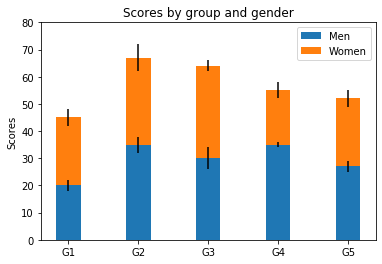

In [15]:
import numpy as np
import matplotlib.pyplot as plt


N = 5
menMeans = (20, 35, 30, 35, 27)
womenMeans = (25, 32, 34, 20, 25)
menStd = (2, 3, 4, 1, 2)
womenStd = (3, 5, 2, 3, 3)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

p1 = plt.bar(ind, menMeans, width, yerr=menStd)
p2 = plt.bar(ind, womenMeans, width,
             bottom=menMeans, yerr=womenStd)

plt.ylabel('Scores')
plt.title('Scores by group and gender')
plt.xticks(ind, ('G1', 'G2', 'G3', 'G4', 'G5'))
plt.yticks(np.arange(0, 81, 10))
plt.legend((p1[0], p2[0]), ('Men', 'Women'))

plt.show()

# AWQMS: Overlap of Carcinogens 

Based upon the IARC Definition, looking for the overlap with the carcinogen list

In [11]:
path = 'C:\\Users\\u0890227\\Desktop\\'
AWQMS_Carc =  pd.read_excel (path + 'AWQMS_Overlap.xlsx',header=0)

In [27]:
#Let's look at the total number of unique carcinogens
AWQMS_uniq_chemicals = AWQMS_Carc[['Chemicals from AWQMS']].drop_duplicates()
IARC_Carc = AWQMS_Carc[['IARC Agent','Group']]
print('There are %d Unique Chemicals in AWQMS' % AWQMS_uniq_chemicals.shape[0])
print('There are %d Unique Chemicals from IARC' % IARC_Carc.shape[0])

There are 391 Unique Chemicals in AWQMS
There are 1075 Unique Chemicals from IARC


In [28]:
#What is the overlap of chemicals with an exact merge:
AWQMS_Carc_Overlap = pd.merge(left = AWQMS_uniq_chemicals, right =  IARC_Carc, 
                              left_on='Chemicals from AWQMS', right_on='IARC Agent',how='inner')
print('There are a total of %d Chemicals in the AWQMS Dataset which overlap' % AWQMS_Carc_Overlap.shape[0])

There are a total of 83 Carcinogens in the AWQMS Dataset


In [52]:
#Let's add in a new column to convert group to legible annotation
AWQMS_Carc_Overlap['Carc_Status'] = AWQMS_Carc_Overlap['Group']
AWQMS_Carc_Overlap.loc[AWQMS_Carc_Overlap['Carc_Status'] == 1, 'Carc_Status'] = 'Known Carcinogen'
AWQMS_Carc_Overlap.loc[AWQMS_Carc_Overlap['Carc_Status'] == '2A', 'Carc_Status'] = 'Probable Carcinogen'
AWQMS_Carc_Overlap.loc[AWQMS_Carc_Overlap['Carc_Status'] == '2B', 'Carc_Status'] = 'Possible Carcinogen'
AWQMS_Carc_Overlap.loc[AWQMS_Carc_Overlap['Carc_Status'] == 3, 'Carc_Status'] = 'Not a Carcinogen'
AWQMS_Carc_Overlap = AWQMS_Carc_Overlap.sort_values(by='Carc_Status')

#Total Number of each bin: 
counts = AWQMS_Carc_Overlap[['Carc_Status']].apply(pd.value_counts)
print(counts)

                     Carc_Status
Possible Carcinogen           37
Not a Carcinogen              32
Probable Carcinogen            8
Known Carcinogen               6


In [56]:
#Export AWQMS_Carc_Overlap to an .csv file 
AWQMS_Carc_Overlap[["IARC Agent","Carc_Status"]].to_csv('AWQMS_Carcinogens', sep='\t',index=False)

Sending all of this information to Margaret Karagas for review. 01.08.20.

Information is stored as Water_Carc_Summary.docx in box (Summaries and Presentations)

In [67]:
#Want a list of known carcinogens:
Known_Carc = IARC_Carc[IARC_Carc['Group'] == 1]
Known_Carc[['IARC Agent']].to_csv("IARC_Carcinogens", sep = '\t',index = False)